# 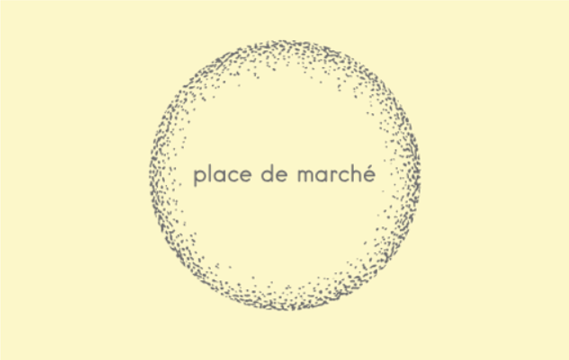

<h1><center>P6 - AUTOMATIC CLASSIFICATION OF CONSUMER GOODS</center></h1>

### OVERVIEW

"Place de marché" is a company about to launch an e-commerce marketplace. Purpose is simple: sellers offer items to buyers by posting a photo and description.

The assignment of an item's category is currently done manually by sellers and is therefore unreliable. On top of that, the number of articles is quite limited at this time.

To make the sellers experience (making it easier to put new items online) and buyers one (making it easier to find products) as smooth as possible and to be able to expand in the future, it becomes necessary to 'automate' this task.

Linda, lead data scientist, therefore asked me to study the feasibility of an engine for classifying articles into different categories, with a sufficient level of precision.

### DATA

Linda provided us with a first dataset containing items with an associated description and a link to download the picture of any item.

### OBJECTIVE

Our goal is to carry out a preliminary feasibility study of an automated content classification engine based a picture and a text description. Any additional item should be ultimately automatically allocated to a category.

### HOW

* Dataset analysis
* Products description and pictures preprocessing
* Dimension reduction
* Clustering

Results will be presented in 2D and will show us that extracted characteristics enable us to gather products from the same category together.

Graphical representation will be key to convince Linda that our modeling approach is suitable for her problem.

### SPECIFIED RULES

An implementation of SIFT / ORB / SURF algorithm is at least required to extract features.
A CNN Transfer Learning algorithm can be used if proved to be of valuable interest.

## PART 1: TEXT CLASSIFICATION

In [1]:
# ! usr/bin/env python 3
# coding: utf-8

# Importing librairies

import time
import warnings
import numpy as np               # numerical data processing
import pandas as pd              # numerical tables & time series
import scipy as sp
import scipy.stats as st         # statistical functions
import seaborn as sns            # statistical data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.collections import LineCollection
import plotly.express as px

# Clustering library
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN
import hdbscan

# metrics and scoring
from sklearn import cluster, metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import homogeneity_score
from sklearn.metrics import completeness_score
from sklearn.metrics import v_measure_score
from sklearn.metrics.cluster import fowlkes_mallows_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics import accuracy_score

from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA
from sklearn.decomposition import LatentDirichletAllocation, NMF

# USE
import tensorflow as tf
import tensorflow_hub as hub


# BERT
import transformers
from sentence_transformers import SentenceTransformer
import torch, gc

gc.collect()
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)

# Text cleaning tools
import nltk
import gensim
# nltk.download()
from collections import Counter
from nltk import word_tokenize, FreqDist
from nltk.tokenize import wordpunct_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from gensim.models import Word2Vec
from nltk.stem import WordNetLemmatizer

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import string
import multiprocessing

from IPython.display import HTML
from IPython.display import Image
import re

palette = sns.color_palette("bright", 10)
plot_kwds = {'alpha' : 1, 's' : 60, 'linewidths':0}
warnings.filterwarnings('ignore')

from functions import*

# PEP8 compliance
# %load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

All functions run in this notebook can be found at: functions.py

In [2]:
start_time = time.time()

## Dataset overview

In [3]:
# Data path file
directory = "C:/Users/steph/Documents/Formation Data Scientist/P6_Lanchec_Stephane/"
# Transforming our input files.csv 
data = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")

In [4]:
data

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >.

In [5]:
# iterating the columns
for col in data.columns:
    print(col)

uniq_id
crawl_timestamp
product_url
product_name
product_category_tree
pid
retail_price
discounted_price
image
is_FK_Advantage_product
description
product_rating
overall_rating
brand
product_specifications


### Explanation of the different columns

__uniq_id__                  : Unique identification key of the product<br>
__crawl_timestamp__          : Time at which the product has been added to the repertory<br>
__product_url__              : URL link to the product itself<br>
__product_name__             : Name of the product<br>
__product_category_tree__    : Category of the product<br>
__pid__                      : Parcel Identification (property registration)<br>
__retail_price__             : Price at which the product can be purchased<br>
__discounted_price__         : Discounted price of the product during discount campaigns<br>
__image__                    : Image in jpg format associated to the product<br>
__is_FK_Advantage_product__  : Yes or No, products that can bring advantages on FlipKart<br>
__description__              : Help the user to understand the product<br>
__product_rating__           : Rating of the product<br>
__overall_rating__           : Mean rating of the product<br>
__brand__                    : Brand of the product<br>
__product_specifications__   : Specifications of the product<br>

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [7]:
# Dataset shape
nRow, nVar = data.shape
print(f'Dataset contains {nRow} rows & {nVar} columns.')

Dataset contains 1050 rows & 15 columns.


In [8]:
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

- Dataset 341 missing data, only "brand" section has 32% missing data.

In [9]:
# Missing values replaced by "".
data.fillna("", inplace=True)

### Products category

In [10]:
print(data["product_category_tree"][50])

["Kitchen & Dining >> Coffee Mugs >> AKUP Coffee Mugs >> AKUP life-is-not-living Ceramic Mug (300 ml)"]


In [11]:
# Categories processing
def split_categories(category, level):

    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def prod_categories(dataframe):
    dataframe['prod_category1'] = dataframe['product_category_tree'].apply(split_categories_1)
    dataframe['prod_category2'] = dataframe['product_category_tree'].apply(split_categories_2)
    dataframe['prod_category3'] = dataframe['product_category_tree'].apply(split_categories_3)
    return dataframe.drop(['product_category_tree'], axis=1)

In [12]:
# Split the product_category section into its 3 highest level
data_cat = prod_categories(data)
data_cat.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,prod_category1,prod_category2,prod_category3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,,,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels


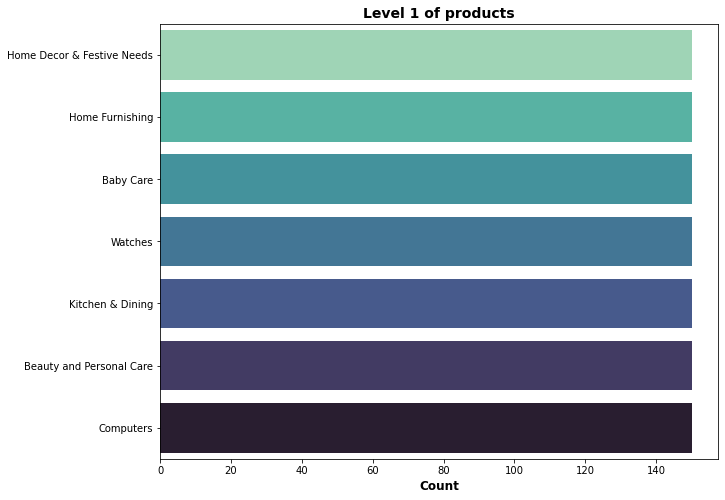

Level 1 contains 7 categories of products, number of products per category:
Home Decor & Festive Needs    150
Home Furnishing               150
Baby Care                     150
Watches                       150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: prod_category1, dtype: int64


In [13]:
# data_cat['prod_category1'].value_counts()
fig = plt.figure(figsize=(10, 8))
ax = sns.countplot(y=data_cat['prod_category1'],
                   palette='mako_r',
                   order=data_cat['prod_category1']
                   .value_counts().index)
plt.title('Level 1 of products', weight='bold', size=14)
plt.ylabel('')
plt.xlabel('Count', weight='bold', size=12)
plt.show()
print("Level 1 contains {} categories of products,\
 number of products per category:\n{}".\
      format(data_cat["prod_category1"].nunique(),
             data_cat['prod_category1'].value_counts()))

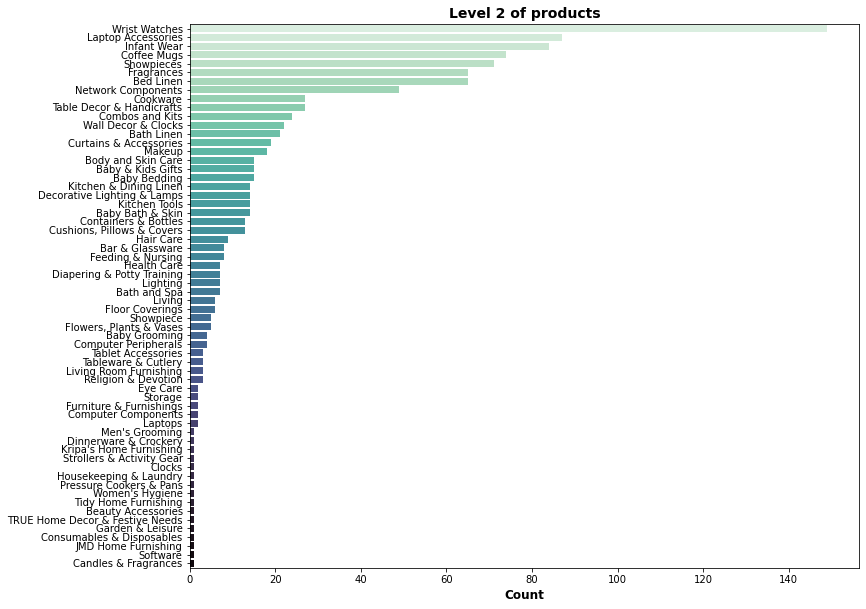

Level 2 contains 62 sub-categories,number of products by sub-category:
Wrist Watches                149
Laptop Accessories            87
Infant Wear                   84
Coffee Mugs                   74
Showpieces                    71
                            ... 
Garden & Leisure               1
Consumables & Disposables      1
JMD Home Furnishing            1
Software                       1
Candles & Fragrances           1
Name: prod_category2, Length: 62, dtype: int64


In [14]:
fig = plt.figure(figsize=(12, 10))
ax = sns.countplot(y=data_cat['prod_category2'],
                   palette='mako_r',
                   order=data_cat['prod_category2']
                   .value_counts().index)
plt.title('Level 2 of products', weight='bold', size=14)
plt.ylabel('')
plt.xlabel('Count', weight='bold', size=12)
plt.show()
print("Level 2 contains {} sub-categories,\
number of products by sub-category:\n{}".\
      format(data_cat["prod_category2"].
             nunique(), data_cat['prod_category2'].value_counts()))

62 sub-categories at Level 2 with an uneven distribution of products in each sub-category, ranging from 1 to 149.

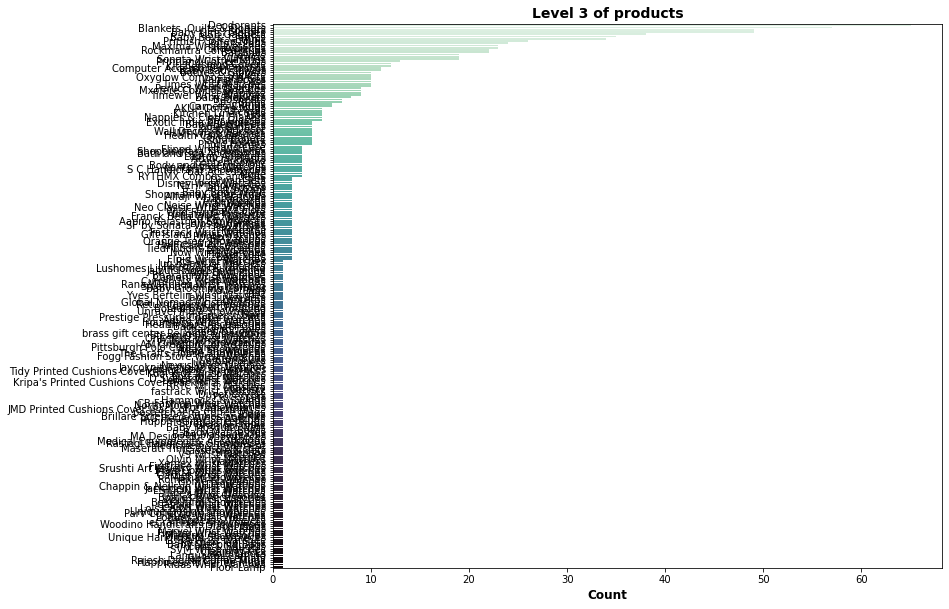

Level 3 contains 242 sub-categories,number of products by sub-category:
Deodorants                    65
Blankets, Quilts & Dohars     57
Routers                       49
Baby Girls' Clothes           49
USB Gadgets                   38
                              ..
Table Placemats                1
Rajesh Digital Coffee Mugs     1
Happiness Is Coffee Mugs       1
Ridas Wrist Watches            1
Floor Lamp                     1
Name: prod_category3, Length: 242, dtype: int64


In [15]:
fig = plt.figure(figsize=(12, 10))
ax = sns.countplot(y=data_cat['prod_category3'],
                   palette='mako_r',
                   order=data_cat['prod_category3']
                   .value_counts().index)
plt.title('Level 3 of products', weight='bold', size=14)
plt.ylabel('')
plt.xlabel('Count', weight='bold', size=12)
plt.show()
print("Level 3 contains {} sub-categories,\
number of products by sub-category:\n{}".\
      format(data_cat["prod_category3"].
             nunique(), data_cat['prod_category3'].value_counts()))

242 sub-categories at Level 3 with an uneven distribution of products in each sub-category, ranging from 1 to 65. 
We'll focus on __Category 1__ for this project.

In [16]:
# Dataframe creation: we only keep columns of interest
data_cleaned = data[['product_name', 'brand', 'image', 'product_category_tree',
                  'description', 'product_specifications', 'prod_category1']]
data_cleaned.head()
data_cleaned.to_csv('data_cleaned.csv')

## 2. Text Pre-processing

### 2.1 Step by step example

### 2.1.1 Tokenisation

Tokenization is a way of separating a piece of text into smaller units called tokens. Here, tokens can be either words, characters, or subwords

In [17]:
# An idea on the number of tokens in description section
data_cleaned['description_tok'] = [word_tokenize(row)
                                  for row in data_cleaned['description']]
list_all_token = []
for row in data_cleaned['description_tok']:
    list_all_token.extend(row)
tok_nbr = len(list_all_token)
tok_nbr_unique = len(set(list_all_token))
display(f'Total number of tokens in the description section : {tok_nbr}')
display(f'Number of unique tokens in the description section : {tok_nbr_unique}')

'Total number of tokens in the description section : 91612'

'Number of unique tokens in the description section : 8167'

In order to better understand the pre-processing phase and before applying it to the whole section, we take the product number 2 as an example and apply successively our cleaning phases. Our analysis will focus on the description and product_specifications section as they contain more detailed information. We will later create a new column with both sections combined.

### Original information

In [18]:
# Section "description"
# Exemple of product number 2
test = data_cleaned['description'].loc[2]
test

'Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Material Cotton Terry Design SHUVAM General Brand Eurospa GSM 360 Type Face Towel Set Model N

In [19]:
# Section "product_specifications"
# Exemple of product number 2
test_bis = data_cleaned['product_specifications'].loc[2]
test_bis

'{"product_specification"=>[{"key"=>"Material", "value"=>"Cotton Terry"}, {"key"=>"Design", "value"=>"SHUVAM"}, {"key"=>"Brand", "value"=>"Eurospa"}, {"key"=>"GSM", "value"=>"360"}, {"key"=>"Type", "value"=>"Face Towel Set"}, {"key"=>"Model Name", "value"=>"SHUVAM20PCFTSETASSORTED"}, {"key"=>"Ideal For", "value"=>"Boys, Girls, Men, Women"}, {"key"=>"Model ID", "value"=>"SHUVAM20PCFTSETASSORTED"}, {"key"=>"Size", "value"=>"small"}, {"key"=>"Color", "value"=>"Assorted"}, {"key"=>"Weight", "value"=>"350 g"}, {"key"=>"Length", "value"=>"9 inch"}, {"key"=>"Width", "value"=>"9 inch"}, {"key"=>"Number of Contents in Sales Package", "value"=>"20"}, {"key"=>"Sales Package", "value"=>"20 PIECE FACE TOWEL SET"}]}'

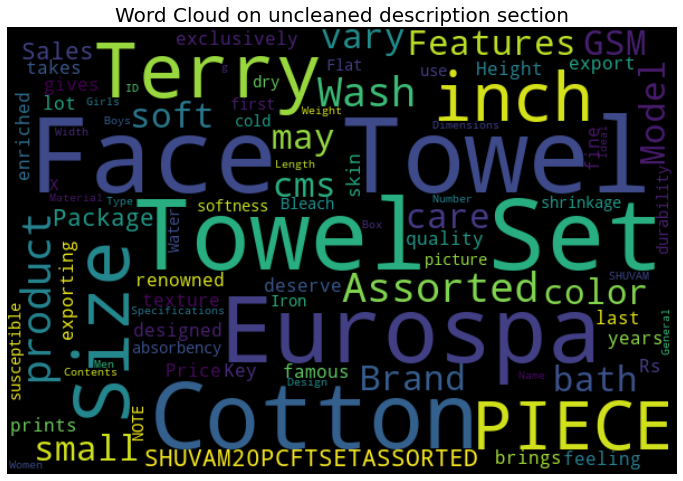

In [20]:
cloud=WordCloud(width=600,height=400).generate(str(data_cleaned["description"].loc[2]))
fig=plt.figure(figsize=(12,12))
plt.axis("off")
plt.imshow(cloud,interpolation='bilinear')
plt.title("Word Cloud on uncleaned description section", size = 20)
plt.show()

#### "Description" section

In [21]:
# Tokenisation on product number 2
tokens = wordpunct_tokenize(test)
print(tokens[:50])

['Key', 'Features', 'of', 'Eurospa', 'Cotton', 'Terry', 'Face', 'Towel', 'Set', 'Size', ':', 'small', 'Height', ':', '9', 'inch', 'GSM', ':', '360', ',', 'Eurospa', 'Cotton', 'Terry', 'Face', 'Towel', 'Set', '(', '20', 'PIECE', 'FACE', 'TOWEL', 'SET', ',', 'Assorted', ')', 'Price', ':', 'Rs', '.', '299', 'Eurospa', 'brings', 'to', 'you', 'an', 'exclusively', 'designed', ',', '100', '%']


#### "Product specifications" section

In [22]:
tokens_bis = wordpunct_tokenize(test_bis)
print(tokens_bis[:50])

['{"', 'product_specification', '"=>[{"', 'key', '"=>"', 'Material', '",', '"', 'value', '"=>"', 'Cotton', 'Terry', '"},', '{"', 'key', '"=>"', 'Design', '",', '"', 'value', '"=>"', 'SHUVAM', '"},', '{"', 'key', '"=>"', 'Brand', '",', '"', 'value', '"=>"', 'Eurospa', '"},', '{"', 'key', '"=>"', 'GSM', '",', '"', 'value', '"=>"', '360', '"},', '{"', 'key', '"=>"', 'Type', '",', '"', 'value']


### 2.1.2 Conversion to lower case

#### Description

In [23]:
# convert to lower case
tokens = [w.lower() for w in tokens]
print(tokens[:50])

['key', 'features', 'of', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', ':', 'small', 'height', ':', '9', 'inch', 'gsm', ':', '360', ',', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', '(', '20', 'piece', 'face', 'towel', 'set', ',', 'assorted', ')', 'price', ':', 'rs', '.', '299', 'eurospa', 'brings', 'to', 'you', 'an', 'exclusively', 'designed', ',', '100', '%']


#### Product specifications

In [24]:
# convert to lower case
tokens_bis = [w.lower() for w in tokens_bis]
print(tokens_bis[:50])

['{"', 'product_specification', '"=>[{"', 'key', '"=>"', 'material', '",', '"', 'value', '"=>"', 'cotton', 'terry', '"},', '{"', 'key', '"=>"', 'design', '",', '"', 'value', '"=>"', 'shuvam', '"},', '{"', 'key', '"=>"', 'brand', '",', '"', 'value', '"=>"', 'eurospa', '"},', '{"', 'key', '"=>"', 'gsm', '",', '"', 'value', '"=>"', '360', '"},', '{"', 'key', '"=>"', 'type', '",', '"', 'value']


### 2.1.3 Punctuation removed

#### Description

In [25]:
# remove punctuation
table = str.maketrans('', '', string.punctuation)
punc = [w.translate(table) for w in tokens]
print(punc[:50])

['key', 'features', 'of', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', '', 'small', 'height', '', '9', 'inch', 'gsm', '', '360', '', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', '', '20', 'piece', 'face', 'towel', 'set', '', 'assorted', '', 'price', '', 'rs', '', '299', 'eurospa', 'brings', 'to', 'you', 'an', 'exclusively', 'designed', '', '100', '']


#### Product specifications

In [26]:
# remove punctuation
table_bis = str.maketrans('', '', string.punctuation)
punc_bis = [w.translate(table_bis) for w in tokens_bis]
print(punc_bis[:50])

['', 'productspecification', '', 'key', '', 'material', '', '', 'value', '', 'cotton', 'terry', '', '', 'key', '', 'design', '', '', 'value', '', 'shuvam', '', '', 'key', '', 'brand', '', '', 'value', '', 'eurospa', '', '', 'key', '', 'gsm', '', '', 'value', '', '360', '', '', 'key', '', 'type', '', '', 'value']


### 2.1.4 Non-Alphabetic characters removed

#### Description

In [27]:
# remove tokens that are not alphabetic
alpha = [word for word in punc if word.isalpha()]
print(alpha[:50])

['key', 'features', 'of', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', 'small', 'height', 'inch', 'gsm', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'piece', 'face', 'towel', 'set', 'assorted', 'price', 'rs', 'eurospa', 'brings', 'to', 'you', 'an', 'exclusively', 'designed', 'soft', 'cotton', 'towels', 'of', 'export', 'quality', 'all', 'our', 'products', 'have', 'soft', 'texture', 'that', 'takes', 'care', 'of']


#### Product specifications

In [28]:
# remove tokens that are not alphabetic
alpha_bis = [word for word in punc_bis if word.isalpha()]
print(alpha_bis[:50])

['productspecification', 'key', 'material', 'value', 'cotton', 'terry', 'key', 'design', 'value', 'shuvam', 'key', 'brand', 'value', 'eurospa', 'key', 'gsm', 'value', 'key', 'type', 'value', 'face', 'towel', 'set', 'key', 'model', 'name', 'value', 'key', 'ideal', 'for', 'value', 'boys', 'girls', 'men', 'women', 'key', 'model', 'id', 'value', 'key', 'size', 'value', 'small', 'key', 'color', 'value', 'assorted', 'key', 'weight', 'value']


### 2.1.5 Stopwords removed

Stop words are words that do not provide any useful information to infer content or nature. It may be either because they don't carry any meaning (prepositions, conjunctions, etc.) or because they are too frequent.

#### Description

In [29]:
# Remove stopwords
stop_words = set(stopwords.words('english'))
alpha = [w for w in alpha if not w in stop_words]
print(alpha[:50])

['key', 'features', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', 'small', 'height', 'inch', 'gsm', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'piece', 'face', 'towel', 'set', 'assorted', 'price', 'rs', 'eurospa', 'brings', 'exclusively', 'designed', 'soft', 'cotton', 'towels', 'export', 'quality', 'products', 'soft', 'texture', 'takes', 'care', 'skin', 'gives', 'enriched', 'feeling', 'deserve', 'eurospa', 'exporting', 'bath', 'towels', 'lot']


#### Product specifications

In [30]:
# Remove stopwords
stop_words_bis = set(stopwords.words('english'))
alpha_bis = [w for w in alpha_bis if not w in stop_words_bis]
print(alpha_bis[:50])

['productspecification', 'key', 'material', 'value', 'cotton', 'terry', 'key', 'design', 'value', 'shuvam', 'key', 'brand', 'value', 'eurospa', 'key', 'gsm', 'value', 'key', 'type', 'value', 'face', 'towel', 'set', 'key', 'model', 'name', 'value', 'key', 'ideal', 'value', 'boys', 'girls', 'men', 'women', 'key', 'model', 'id', 'value', 'key', 'size', 'value', 'small', 'key', 'color', 'value', 'assorted', 'key', 'weight', 'value', 'g']


### 2.1.6 Lemmatization

Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma .

#### Description

In [31]:
# Lemmatization
alpha = [WordNetLemmatizer().lemmatize(w) for w in alpha]
print(alpha[:50])

['key', 'feature', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', 'small', 'height', 'inch', 'gsm', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'piece', 'face', 'towel', 'set', 'assorted', 'price', 'r', 'eurospa', 'brings', 'exclusively', 'designed', 'soft', 'cotton', 'towel', 'export', 'quality', 'product', 'soft', 'texture', 'take', 'care', 'skin', 'give', 'enriched', 'feeling', 'deserve', 'eurospa', 'exporting', 'bath', 'towel', 'lot']


#### Product specifications

In [32]:
# Lemmatization
alpha_bis = [WordNetLemmatizer().lemmatize(w) for w in alpha_bis]
print(alpha_bis[:50])

['productspecification', 'key', 'material', 'value', 'cotton', 'terry', 'key', 'design', 'value', 'shuvam', 'key', 'brand', 'value', 'eurospa', 'key', 'gsm', 'value', 'key', 'type', 'value', 'face', 'towel', 'set', 'key', 'model', 'name', 'value', 'key', 'ideal', 'value', 'boy', 'girl', 'men', 'woman', 'key', 'model', 'id', 'value', 'key', 'size', 'value', 'small', 'key', 'color', 'value', 'assorted', 'key', 'weight', 'value', 'g']


### 2.2 Cleaning generalization

In [33]:
def preprocess(text):
    '''
    Clean text (tokenize, lower case, punctuation,
    stopwords, non alphabetic, lemmatize)
    
    '''
    words = wordpunct_tokenize(text)
    words = [w.lower() for w in words]
    words = [w.translate(table) for w in words]
    words = [w for w in words if w.isalpha()]
    words = [w for w in words if not w in stop_words]
    words = [WordNetLemmatizer().lemmatize(w) for w in words]
    return (' '.join(words))

# Cleaning the description section
data_cleaned['description_clean'] = data_cleaned['description'].apply(preprocess)

# Cleaning the product specifications section
data_cleaned['product_specifications_clean'] = data_cleaned['product_specifications'].apply(preprocess)

### 2.3 Additional cleaning phase: most & least recurrent words

#### 2.3.1 "description" section

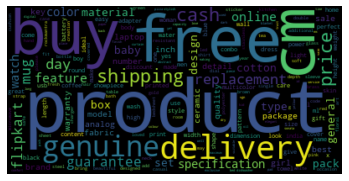

In [34]:
# Create and generate a word cloud image:

wordcloud = WordCloud(collocations=False).\
            generate(' '.join(data_cleaned['description_clean']))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [35]:
# Words frequency in "description" section
text = ''
sentence = ' '.join([text + row for row in data_cleaned['description_clean']])
tokens = nltk.word_tokenize(sentence)
fdist = FreqDist(tokens)
# Dataframe creation
df_word_frequency = pd.DataFrame({'Word': fdist.keys(),
                                 'Frequency': fdist.values()}) \
                    .sort_values(['Frequency'], ascending=False)
nb_tot = df_word_frequency['Frequency'].count()
df_word_frequency['%_frequency'] = \
    round((df_word_frequency['Frequency'])*100/nb_tot, 2)

In [36]:
# Most recurrent words: List of words appearing more than 5% of the time
df_word_frequency[df_word_frequency['%_frequency'] > 5]

,Word,Frequency,%_frequency
14,r,927,20.66
133,product,864,19.26
225,free,618,13.77
214,buy,581,12.95
10,cm,568,12.66
228,delivery,567,12.64
227,cash,564,12.57
226,shipping,564,12.57
221,genuine,564,12.57
13,price,561,12.50


Few of the most recurrent words does not give any information about any type of category. Only "Mug" in position 16 can be of significant information so we'll remove the 15 most recurrent words. Further manual removal of useless words below mug could done but we'll stick to that right now.

In [37]:
# Least recurrent words: List of words appearing less than 3 times
df_word_frequency[df_word_frequency['Frequency'] < 3]

,Word,Frequency,%_frequency
4188,course,2,0.04
2749,doubt,2,0.04
2751,raised,2,0.04
4205,inexorably,2,0.04
2750,request,2,0.04
...,...,...,...
2023,t,1,0.02
3343,mykid,1,0.02
3341,quits,1,0.02
3340,frabjous,1,0.02


In [38]:
# List of words appearing more than 460 times
list_desc = set(df_word_frequency[df_word_frequency['Frequency']
                                               >460]['Word'].to_list())
# List of words appearing less than 3 times
list_words_desc = \
    list_desc.union(df_word_frequency[df_word_frequency
                                                   ['Frequency']
                                                   < 3]['Word'].to_list())

In [39]:
# Removal of this list of words from the "description" section
data_cleaned['description_clean'] = [' '.join([y for y in x.split() if y not in list_words_desc]) for x in data_cleaned['description_clean']]

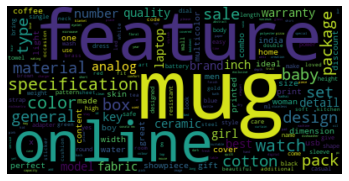

In [40]:
# Create and generate a word cloud image:

wordcloud = WordCloud(collocations=False).generate(' '.join(data_cleaned['description_clean']))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#### "Product specifications" section

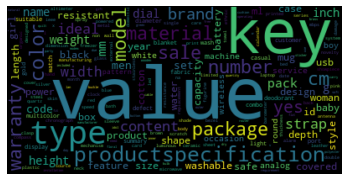

In [41]:
# Create and generate a word cloud image:

wordcloud = WordCloud(collocations=False).generate(' '.join(data_cleaned['product_specifications_clean']))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [42]:
# Words frequency in "product_specifications" section
text = ''
sentence = ' '.join([text + row for row in data_cleaned['product_specifications_clean']])
tokens = nltk.word_tokenize(sentence)
fdist = FreqDist(tokens)
# Dataframe creation
df_word_frequency = pd.DataFrame({'Word': fdist.keys(),
                                 'Frequency': fdist.values()}) \
                    .sort_values(['Frequency'], ascending=False)
nb_tot = df_word_frequency['Frequency'].count()
df_word_frequency['%_frequency'] = \
    round((df_word_frequency['Frequency'])*100/nb_tot, 2)

In [43]:
# Most recurrent words
df_word_frequency[df_word_frequency['%_frequency'] > 5]

,Word,Frequency,%_frequency
3,value,12786,395.85
1,key,12289,380.46
7,type,1182,36.59
0,productspecification,1049,32.48
16,color,898,27.80
9,model,837,25.91
23,package,810,25.08
22,sale,808,25.02
20,number,806,24.95
25,material,800,24.77


In [44]:
# Least recurrent words
df_word_frequency[df_word_frequency['Frequency'] < 3]

,Word,Frequency,%_frequency
2198,though,2,0.06
2372,spill,2,0.06
1658,bridge,2,0.06
1657,point,2,0.06
756,learning,2,0.06
...,...,...,...
1771,udp,1,0.03
1770,tcp,1,0.03
1769,icmp,1,0.03
1768,scheduling,1,0.03


In [45]:
# List of most recurrent words
list_spec = set(df_word_frequency[df_word_frequency['Frequency']
                                               >= 225]['Word'].to_list())
# List of least recurrent words
list_words_spec = \
    list_spec.union(df_word_frequency[df_word_frequency
                                                   ['Frequency']
                                                   < 3]['Word'].to_list())

In [46]:
data_cleaned['product_specifications_clean'] = [' '.join([y for y in x.split() if y not in list_words_spec]) for x in data_cleaned['product_specifications_clean']]

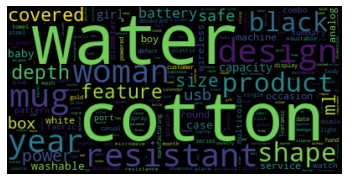

In [47]:
# Create and generate a word cloud image:

wordcloud = WordCloud(collocations=False).generate(' '.join(data_cleaned['product_specifications_clean']))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [48]:
# Creation of a new column with both sections together
data_cleaned['desc_spec'] = data_cleaned['description'] + data_cleaned['product_specifications']
data_cleaned['desc_spec_clean'] = data_cleaned['description_clean'] + data_cleaned['product_specifications_clean']

Most recurrent words of the category: Home Furnishing
Most recurrent words of the category: Baby Care
Most recurrent words of the category: Watches
Most recurrent words of the category: Home Decor & Festive Needs
Most recurrent words of the category: Kitchen & Dining
Most recurrent words of the category: Beauty and Personal Care
Most recurrent words of the category: Computers


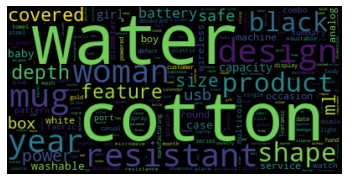

In [49]:
# change the value to black
def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")
# set the wordcloud background color to white
# set max_words to 1000
# set width and height to higher quality, 3000 x 2000
liste_hue = data_cleaned['prod_category1'].unique().tolist()
for cat in liste_hue:
    print('Most recurrent words of the category: ' + cat)
#         hero.wordcloud(dataframe[dataframe[var_hue] == cat][variable],
#                        max_words=nb_mots)
    # plot the wordcloud
    plt.imshow(wordcloud, interpolation="bilinear")
    # remove plot axes
    plt.axis("off")
    # save the image
    plt.savefig('wordcloud.png')
        # liste_hue = dataframe[var_hue].unique().tolist()
        #     for cat in liste_hue:
        #         print('Mots les plus fréquents de la catégorie : ' + cat)
        #         hero.wordcloud(dataframe[dataframe[var_hue] == cat][variable],
        #                        max_words=nb_mots)

## 3. Words Embedding

### 3.1 Bags of words (BOW) - CountVectorizer

CountVectorizer converts a collection of text documents to a matrix of token counts. 2 important parameters need to be taken into account:<br>

* __max_df__ (default=1.0)
When building the vocabulary ignore terms that have a document frequency strictly higher than the given threshold (corpus-specific stop words). If float, the parameter represents a proportion of documents, integer absolute counts. 

* __min_df__ (default=1.0)
When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold. This value is also called cut-off in the literature. If float, the parameter represents a proportion of documents, integer absolute counts.

#### 3.1.1 "description" section

In [50]:
# creating the feature matrix for "description 

cv_desc = CountVectorizer(min_df=5)
X_cv_desc = cv_desc.fit_transform(data_cleaned['description_clean'])
vect_cv_desc = X_cv_desc.toarray()
df_countvect_desc = pd.DataFrame(data=vect_cv_desc,columns = cv_desc.get_feature_names())
df_countvect_desc.head()

,absorbent,abstract,ac,accessory,actual,adapter,add,addition,additional,adhesive,...,wooden,work,working,world,would,wrap,year,yellow,yes,yet
0,0,4,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


#### 3.1.2 "product specifications" section

In [51]:
# creating the feature cv_spec 

cv_spec = CountVectorizer(min_df=5)
X_cv_spec = cv_spec.fit_transform(data_cleaned['product_specifications_clean'])
vect_cv_spec = X_cv_spec.toarray()
df_countvect_spec = pd.DataFrame(data=vect_cv_spec, columns = cv_spec.get_feature_names())
df_countvect_spec.head()

,absorbent,abstract,ac,access,accessory,accidental,acrylic,adapter,adaptor,address,...,wooden,wool,wpa,wps,wrap,wrapper,xp,year,yellow,zipper
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### 3.1.2 "desc_spec" section

In [52]:
# creating the feature cv_spec 

cv_desc_spec = CountVectorizer(min_df=5)
X_cv_desc_spec = cv_desc_spec.fit_transform(data_cleaned['desc_spec_clean'])
vect_cv_desc_spec = X_cv_desc_spec.toarray()
df_countvect_desc_spec = pd.DataFrame(data=vect_cv_desc_spec, columns = cv_desc_spec.get_feature_names())
df_countvect_desc_spec.head()

,absorbent,abstract,ac,access,accessory,accidental,acrylic,actual,adapter,adaptor,...,wrap,wrapper,wrist,xmug,xp,year,yellow,yes,yet,zipper
0,0,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,3,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


### 3.2 HashingVectorizer

Convert a collection of text documents to a matrix of token occurrences.

It turns a collection of text documents into a scipy.sparse matrix holding token occurrence counts (or binary occurrence information), possibly normalized as token frequencies if norm=’l1’ or projected on the euclidean unit sphere if norm=’l2’.

This text vectorizer implementation uses the hashing trick to find the token string name to feature integer index mapping.

#### 3.2.1 "description" section

In [53]:
hashvect_desc = HashingVectorizer(norm=None, n_features=len(df_countvect_desc.columns))
X_hashvect_desc = hashvect_desc.fit_transform(data_cleaned['description_clean'])
X_array_hash_desc = X_hashvect_desc.toarray()

df_hashvect_desc = pd.DataFrame(X_array_hash_desc,
                              columns=cv_desc.get_feature_names())
df_hashvect_desc.head(3)

,absorbent,abstract,ac,accessory,actual,adapter,add,addition,additional,adhesive,...,wooden,work,working,world,would,wrap,year,yellow,yes,yet
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


#### 3.2.2 "product_specifications" section

In [54]:
hashvect = HashingVectorizer(norm=None, n_features=len(df_countvect_spec.columns))
X_hashvect_prod_spec = hashvect.fit_transform(data_cleaned['product_specifications_clean'])
X_array_hash_prod_spec = X_hashvect_prod_spec.toarray()

df_hashvect_prod_spec = pd.DataFrame(X_array_hash_prod_spec,
                              columns=cv_spec.get_feature_names())
df_hashvect_prod_spec.head(3)

,absorbent,abstract,ac,access,accessory,accidental,acrylic,adapter,adaptor,address,...,wooden,wool,wpa,wps,wrap,wrapper,xp,year,yellow,zipper
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 3.2.3 "desc_spec" section

In [55]:
hashvect = HashingVectorizer(norm=None, n_features=len(df_countvect_desc_spec.columns))
X_hashvect_desc_spec = hashvect.fit_transform(data_cleaned['desc_spec_clean'])
X_array_hash_desc_spec = X_hashvect_desc_spec.toarray()

df_hashvect_desc_spec = pd.DataFrame(X_array_hash_desc_spec,
                              columns=cv_desc_spec.get_feature_names())
df_hashvect_desc_spec.head(3)

,absorbent,abstract,ac,access,accessory,accidental,acrylic,actual,adapter,adaptor,...,wrap,wrapper,wrist,xmug,xp,year,yellow,yes,yet,zipper
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0


### 3.3 Tf-idf Vectorizer

TF-IDF stands for “Term Frequency — Inverse Document Frequency”. This is a technique to quantify words in a set of documents. We generally compute a score for each word to signify its importance in the document and corpus.

TF-IDF is better than Count Vectorizers because it not only focuses on the frequency of words present in the corpus but also provides the importance of the words. We can then remove the words that are less important for analysis, hence making the model building less complex by reducing the input dimensions.

#### 3.3.1 "Description" section

In [56]:
# creating the feature matrix 

tfidf_desc = TfidfVectorizer(min_df=5)
X_tfidf_desc = tfidf_desc.fit_transform(data_cleaned['description_clean'])
X_array_tfidf_desc = X_tfidf_desc.toarray()
df_tfidf_desc = pd.DataFrame(data=X_array_tfidf_desc,
                             columns = tfidf_desc.get_feature_names())
df_tfidf_desc.head()

,absorbent,abstract,ac,accessory,actual,adapter,add,addition,additional,adhesive,...,wooden,work,working,world,would,wrap,year,yellow,yes,yet
0,0.0,0.18813,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.062009,0.0,0.0,0.00000,0.000000,0.000000,0.0
1,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.195986,0.076799,0.0
2,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.04959,0.000000,0.000000,0.0
3,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.045174,0.0
4,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.037572,0.0


#### 3.3.2 "product_specifications" section

In [57]:
# creating the feature matrix 

tfidf_spec = TfidfVectorizer(min_df=5)
X_tfidf_prod_spec = tfidf_spec.fit_transform(data_cleaned['product_specifications_clean'])
X_array_tfidf_prod_spec = X_tfidf_prod_spec.toarray()
df_tfidf_prod_spec = pd.DataFrame(data=X_array_tfidf_prod_spec,
                                  columns = tfidf_spec.get_feature_names())
df_tfidf_prod_spec.head()

,absorbent,abstract,ac,access,accessory,accidental,acrylic,adapter,adaptor,address,...,wooden,wool,wpa,wps,wrap,wrapper,xp,year,yellow,zipper
0,0.0,0.262127,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.190339,0.0
2,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


#### 3.3.3 "desc_spec" section

In [58]:
# creating the feature matrix 

tfidf_desc_spec = TfidfVectorizer(min_df=5)
X_tfidf_desc_spec = tfidf_desc_spec.fit_transform(data_cleaned['desc_spec_clean'])
X_array_tfidf_desc_spec = X_tfidf_desc_spec.toarray()
df_tfidf_desc_spec = pd.DataFrame(data=X_array_tfidf_desc_spec,
                                  columns = tfidf_desc_spec.get_feature_names())
df_tfidf_desc_spec.head()

,absorbent,abstract,ac,access,accessory,accidental,acrylic,actual,adapter,adaptor,...,wrap,wrapper,wrist,xmug,xp,year,yellow,yes,yet,zipper
0,0.0,0.20067,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0
1,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.202115,0.056546,0.0,0.0
2,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.027317,0.000000,0.000000,0.0,0.0
3,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.030138,0.0,0.0
4,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.027352,0.0,0.0


## 4. Dimension reduction - Principal Components Analysis (PCA)

Principal Component Analysis, or PCA, is a dimensionality-reduction method that is often used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set.

Reducing the number of variables of a data set naturally comes at the expense of accuracy, but the trick in dimensionality reduction is to trade a little accuracy for simplicity. Because smaller data sets are easier to explore and visualize and make analyzing data much easier and faster for machine learning algorithms without extraneous variables to process.

<img src="https://www.analyticsvidhya.com/wp-content/uploads/2016/03/1-1.png" alt="image info" />

### 4.1 "Description" section - CountVectorizer

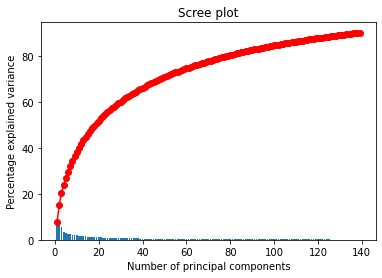

The number of principal components to keep to get 90% of the variance explained is: 139 


In [59]:
pca = PCA(n_components = 0.90)
pca.fit(df_countvect_desc)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [60]:
n_comp1 = pca.n_components_
pca_cv = PCA(n_components=n_comp1)
X_proj_cv = pca_cv.fit_transform(df_countvect_desc)

# Dataframe creation for visualization
df_pca_cv = pd.DataFrame({'PC1': X_proj_cv[:, 0],
                          'PC2': X_proj_cv[:, 1],
                          'PC3': X_proj_cv[:, 2],
                          'Category' : data_cleaned['prod_category1']})

#### 2D PCA Visualization

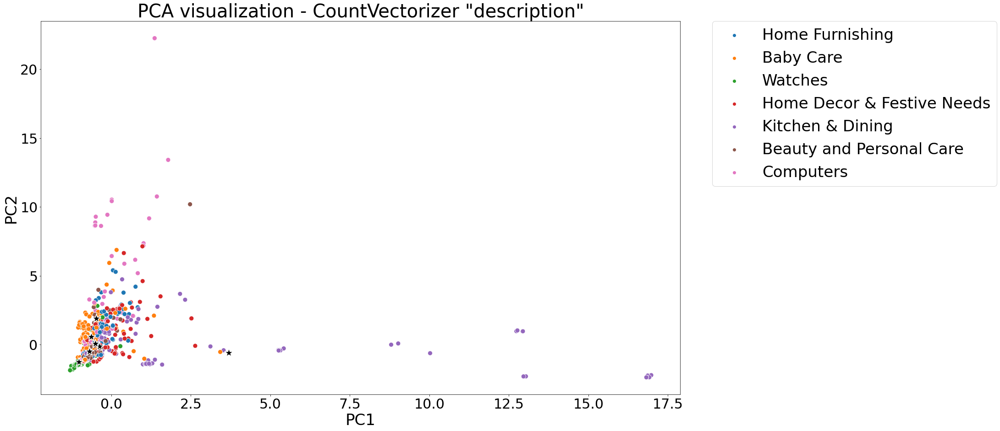

In [61]:
# PCA visualization of the first 2 principal components
title = 'PCA visualization - CountVectorizer "description"'
pca_visualization(data_cleaned, X_proj_cv, 'PC1', 'PC2', title)

#### 3D PCA model visualization 

In [62]:
# 3d Scatter plot of categories after PCA
threed_pca(df_pca_cv)

### 4.2 "product specifications" section - CountVectorizer

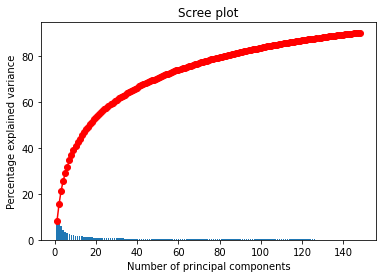

The number of principal components to keep to get 90% of the variance explained is: 148 


In [63]:
pca = PCA(n_components = 0.90)
pca.fit(df_countvect_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [64]:
n_comp2 = pca.n_components_
pca_cv_spec = PCA(n_components=n_comp2)
pca_cv_spec.fit(df_countvect_spec)
X_proj_cv_spec = pca_cv_spec.transform(df_countvect_spec)

# Dataframe creation for visualization
df_pca_cv_spec = pd.DataFrame({'PC1': X_proj_cv_spec[:, 0],
                               'PC2': X_proj_cv_spec[:, 1],
                               'PC3': X_proj_cv_spec[:, 2],
                               'Category' : data_cleaned['prod_category1']})

#### 2D PCA visualization

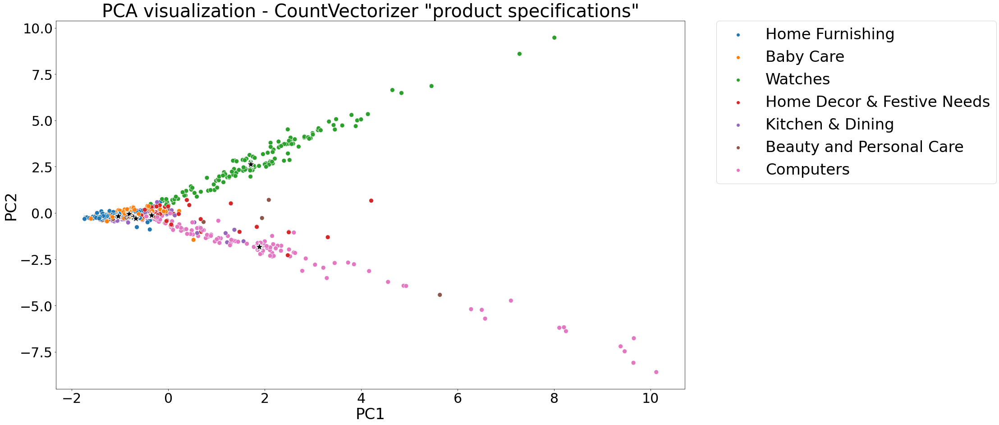

In [65]:
# PCA visualization of the first 2 principal components 
title = 'PCA visualization - CountVectorizer "product specifications"'
pca_visualization(data_cleaned, X_proj_cv_spec, 'PC1', 'PC2', title)

#### 3D PCA Visualization

In [66]:
# 3d Scatter plot of categories after PCA
threed_pca(df_pca_cv_spec)

### 4.3 "description + product specifications" section - CountVectorizer

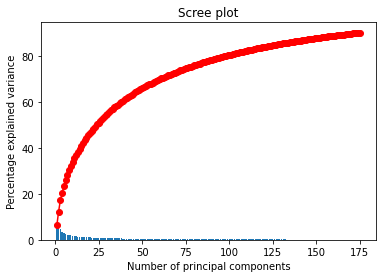

The number of principal components to keep to get 90% of the variance explained is: 175 


In [67]:
pca = PCA(n_components = 0.90)
pca.fit(df_countvect_desc_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [68]:
n_comp3 = pca.n_components_
pca_cv_desc_spec = PCA(n_components=n_comp3)
pca_cv_desc_spec.fit(df_countvect_desc_spec)
X_proj_cv_desc_spec = pca_cv_desc_spec.transform(df_countvect_desc_spec)

# Dataframe creation for visualization
df_pca_cv_desc_spec = pd.DataFrame({'PC1': X_proj_cv_desc_spec[:, 0],
                               'PC2': X_proj_cv_desc_spec[:, 1],
                               'PC3': X_proj_cv_desc_spec[:, 2],
                               'Category' : data_cleaned['prod_category1']})

#### 2D PCA visualization

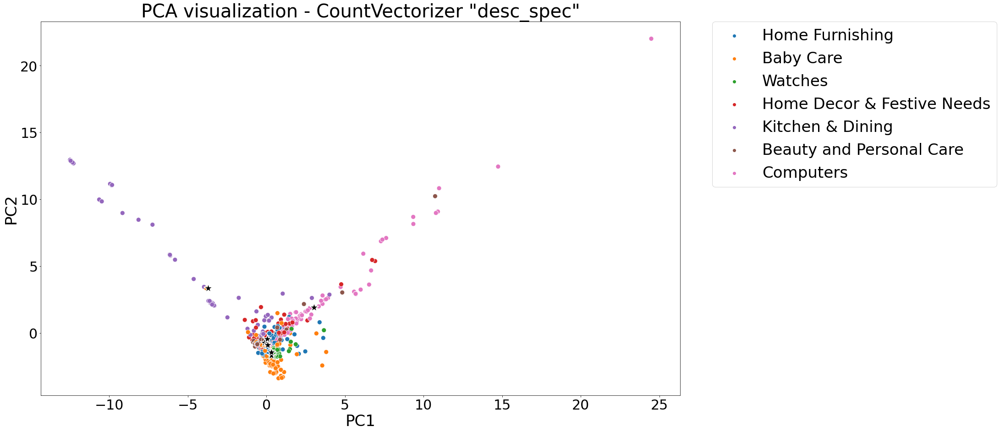

In [69]:
# PCA visualization of the first 2 principal components 
title = 'PCA visualization - CountVectorizer "desc_spec"'
pca_visualization(data_cleaned, X_proj_cv_desc_spec, 'PC1', 'PC2', title)

#### 3D PCA Visualization

In [70]:
# 3d Scatter plot of categories after PCA
threed_pca(df_pca_cv_desc_spec)

### 4.4 "description" section - HashingVectorizer 

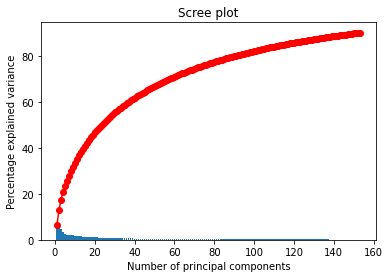

The number of principal components to keep to get 90% of the variance explained is: 153 


In [71]:
pca = PCA(n_components = 0.90)
pca.fit(df_hashvect_desc)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [72]:
n_comp4 = pca.n_components_
pca_hash = PCA(n_components=n_comp4)
X_proj_hashvect_desc = pca_hash.fit_transform(df_hashvect_desc)

# Dataframe creation for visualization
df_pca_hashvect_desc = pd.DataFrame({'PC1': X_proj_hashvect_desc[:, 0],
                                     'PC2': X_proj_hashvect_desc[:, 1],
                                     'PC3': X_proj_hashvect_desc[:, 2],
                                     'Category' : data_cleaned['prod_category1']})

### 2D PCA

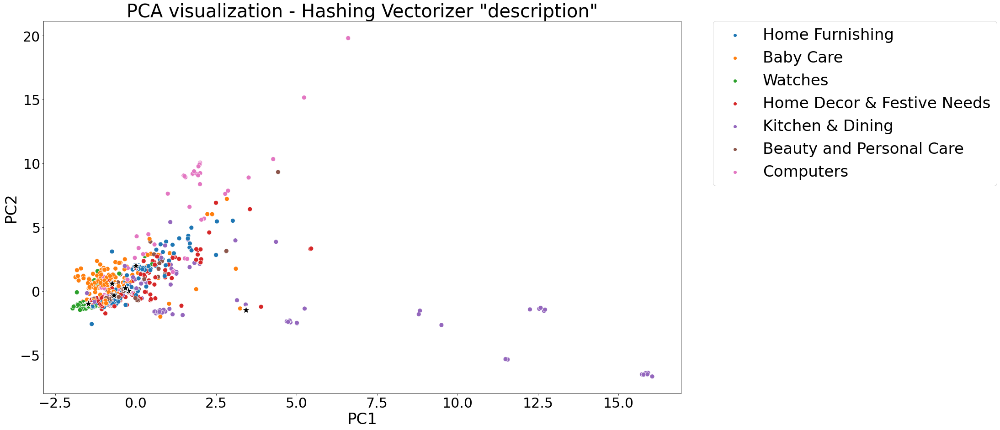

In [73]:
# 2D PCA visualization of the first 2 principal components
title = 'PCA visualization - Hashing Vectorizer "description"'
pca_visualization(data_cleaned, X_proj_hashvect_desc, 'PC1', 'PC2', title)

#### 3D PCA visualization

In [74]:
threed_pca(df_pca_hashvect_desc)

### 4.5 "product specifications" section - HashingVectorizer 

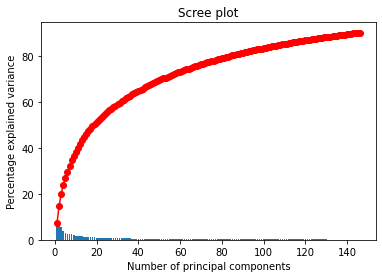

The number of principal components to keep to get 90% of the variance explained is: 146 


In [75]:
pca = PCA(n_components = 0.90)
pca.fit(df_hashvect_prod_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [76]:
n_comp5 = pca.n_components_
pca_hash = PCA(n_components=n_comp5)
X_proj_hashvect_prod_spec = pca_hash.fit_transform(df_hashvect_prod_spec)

# Dataframe creation for clustering
df_pca_hashvect_prod_spec = pd.DataFrame({'PC1': X_proj_hashvect_prod_spec[:, 0],
                                          'PC2': X_proj_hashvect_prod_spec[:, 1],
                                          'PC3': X_proj_hashvect_prod_spec[:, 2],
                                          'Category' : data_cleaned['prod_category1']})

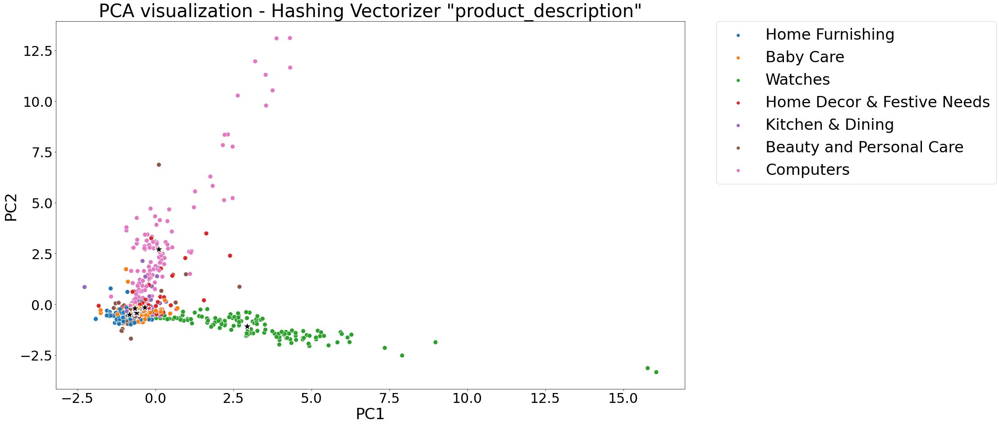

In [77]:
# 2D PCA visualization
title = 'PCA visualization - Hashing Vectorizer "product_description"'
pca_visualization(data_cleaned, X_proj_hashvect_prod_spec, 'PC1', 'PC2', title)

In [78]:
threed_pca(df_pca_hashvect_prod_spec)

### 4.6 "description + product specifications" section - HashingVectorizer 

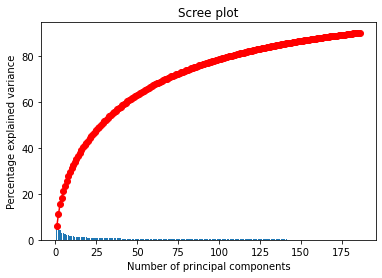

The number of principal components to keep to get 90% of the variance explained is: 186 


In [79]:
pca = PCA(n_components = 0.90)
pca.fit(df_hashvect_desc_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [80]:
n_comp6 = pca.n_components_
pca_hash = PCA(n_components=n_comp6)
X_proj_hashvect_desc_spec = pca_hash.fit_transform(df_hashvect_desc_spec)

# Dataframe creation for visualization
df_pca_hashvect_desc_spec = pd.DataFrame({'PC1': X_proj_hashvect_desc_spec[:, 0],
                                          'PC2': X_proj_hashvect_desc_spec[:, 1],
                                          'PC3': X_proj_hashvect_desc_spec[:, 2],
                                          'Category' : data_cleaned['prod_category1']})

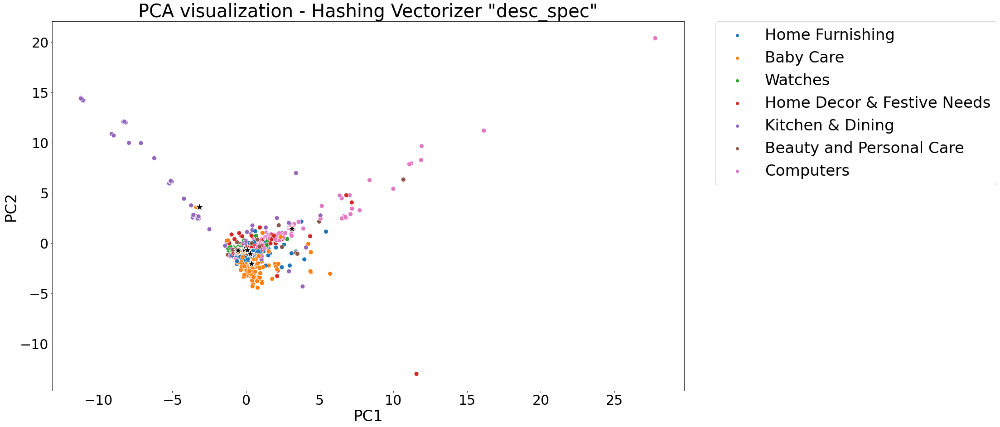

In [81]:
# 2D PCA visualization
title = 'PCA visualization - Hashing Vectorizer "desc_spec"'
pca_visualization(data_cleaned, X_proj_hashvect_desc_spec, 'PC1', 'PC2', title)

In [82]:
threed_pca(df_pca_hashvect_desc_spec)

### 4.7 "description" section - Tf-idf Vectorizer 

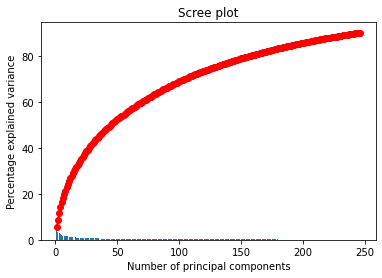

The number of principal components to keep to get 90% of the variance explained is: 246 


In [83]:
pca = PCA(n_components = 0.90)
pca.fit(df_tfidf_desc)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [84]:
n_comp7 = pca.n_components_
pca_tfidf_desc = PCA(n_components=n_comp7)
pca_tfidf_desc.fit(df_tfidf_desc)
X_proj_tfidf_desc = pca_tfidf_desc.transform(df_tfidf_desc)

# Dataframe pour clustering & visualization
df_pca_tfidf_desc = pd.DataFrame({'PC1': X_proj_tfidf_desc[:, 0],
                            'PC2': X_proj_tfidf_desc[:, 1],
                            'PC3': X_proj_tfidf_desc[:, 2],
                            'Category' : data_cleaned['prod_category1']})

#### 2D PCA visualization

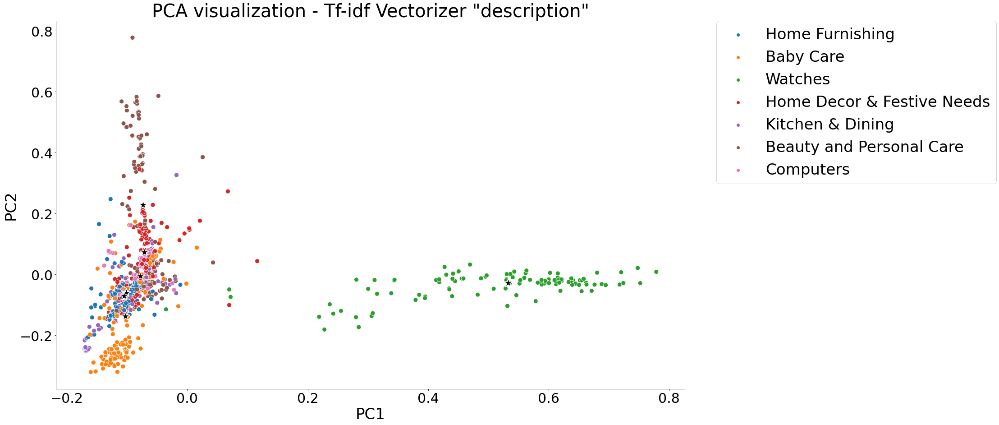

In [85]:
# 2D PCA Visulisation 
title = 'PCA visualization - Tf-idf Vectorizer "description"'
pca_visualization(data_cleaned, X_proj_tfidf_desc, 'PC1', 'PC2', title)

#### 3D PCA visualization

In [86]:
# 3d Scatter plot of categories after PCA
threed_pca(df_pca_tfidf_desc)

### 4.8 "product specifications" section - Tf-idf Vectorizer

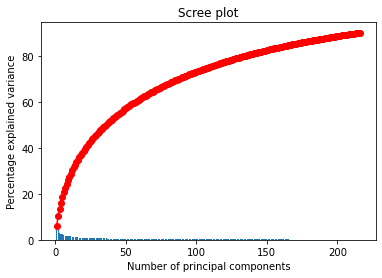

The number of principal components to keep to get 90% of the variance explained is: 216 


In [87]:
pca = PCA(n_components = 0.90)
pca.fit(df_tfidf_prod_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [88]:
n_comp8 = pca.n_components_
pca_tfidf_prod_spec = PCA(n_components=n_comp8)
pca_tfidf_prod_spec.fit(df_tfidf_prod_spec)
X_proj_tfidf_prod_spec = pca_tfidf_prod_spec.transform(df_tfidf_prod_spec)

# Dataframe pour clustering & visualization
df_pca_tfidf_prod_spec = pd.DataFrame({'PC1': X_proj_tfidf_prod_spec[:, 0],
                            'PC2': X_proj_tfidf_prod_spec[:, 1],
                            'PC3': X_proj_tfidf_prod_spec[:, 2],
                            'Category' : data_cleaned['prod_category1']})

#### 2D PCA visualization

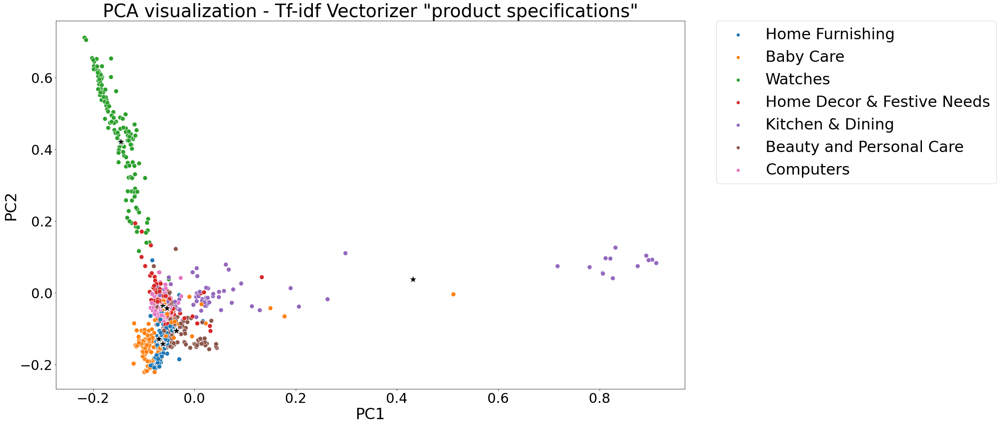

In [89]:
# 2D PCA Visulisation 
title = 'PCA visualization - Tf-idf Vectorizer "product specifications"'
pca_visualization(data_cleaned, X_proj_tfidf_prod_spec, 'PC1', 'PC2', title)

#### 3D PCA visualization

In [90]:
threed_pca(df_pca_tfidf_prod_spec)

### 4.9 "description + product specifications" section - Tf-idf Vectorizer

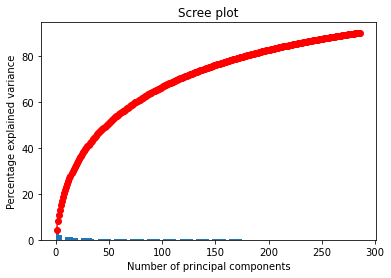

The number of principal components to keep to get 90% of the variance explained is: 286 


In [91]:
pca = PCA(n_components = 0.90)
pca.fit(df_tfidf_desc_spec)
display_scree_plot(pca)
print("The number of principal components to keep to get 90% of the variance explained is: {} ".format(pca.n_components_))

In [92]:
n_comp9 = pca.n_components_
pca_tfidf_desc_spec = PCA(n_components=n_comp9)
pca_tfidf_desc_spec.fit(df_tfidf_desc_spec)
X_proj_tfidf_desc_spec = pca_tfidf_desc_spec.transform(df_tfidf_desc_spec)

# Dataframe creation for visualization
df_pca_tfidf_desc_spec = pd.DataFrame({'PC1': X_proj_tfidf_desc_spec[:, 0],
                            'PC2': X_proj_tfidf_desc_spec[:, 1],
                            'PC3': X_proj_tfidf_desc_spec[:, 2],
                            'Category' : data_cleaned['prod_category1']})

#### 2D PCA visualization

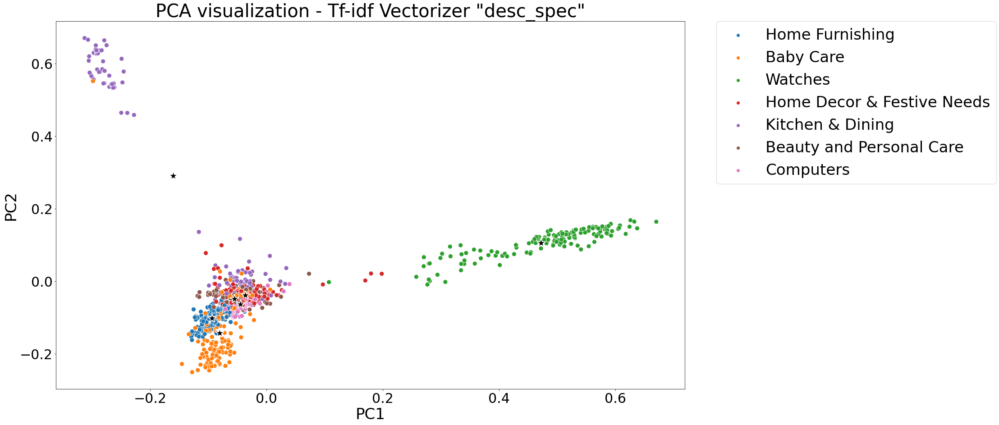

In [93]:
# 2D PCA Visulisation 
title = 'PCA visualization - Tf-idf Vectorizer "desc_spec"'
pca_visualization(data_cleaned, X_proj_tfidf_desc_spec, 'PC1', 'PC2', title)

#### 3D PCA visualization

In [94]:
threed_pca(df_pca_tfidf_desc_spec)

## 5. TSNE (T-distributed Stochastic Neighbor Embedding) Visualization

t-SNE is a tool to visualize high-dimensional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data.

### 5.1 "Description" section - CounVectorizer

In [95]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=1500, random_state=42)
tsne_results_1 = tsne.fit_transform(df_countvect_desc)
    
cv_tsne_desc = pd.concat([pd.DataFrame(tsne_results_1), data_cleaned['prod_category1']], axis=1)
cv_tsne_desc = cv_tsne_desc.rename(columns={'prod_category1':'Category'})

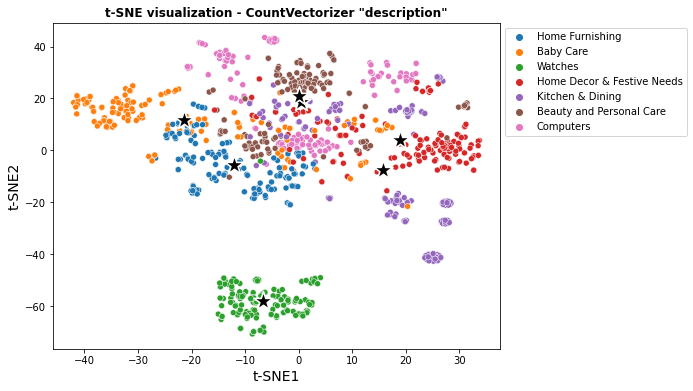

In [96]:
title = 't-SNE visualization - CountVectorizer "description"'
tsne_visualisation(cv_tsne_desc, title)

### 5.2 "product specifications" section - CountVectorizer

In [97]:
tsne_results_2 = tsne.fit_transform(df_countvect_spec)
    
cv_tsne_prod_spec = pd.concat([pd.DataFrame(tsne_results_2), data_cleaned['prod_category1']], axis=1)
cv_tsne_prod_spec = cv_tsne_prod_spec.rename(columns={'prod_category1':'Category'})

In [98]:
cv_tsne_prod_spec

,0,1,Category
0,-21.541550,-2.667671,Home Furnishing
1,-34.217751,-10.992870,Baby Care
2,-29.566105,-9.304917,Baby Care
3,-27.815735,2.293714,Home Furnishing
4,-28.295624,2.257338,Home Furnishing
...,...,...,...
1045,-12.230435,2.429609,Baby Care
1046,-14.883095,2.662662,Baby Care
1047,-9.536304,1.237653,Baby Care
1048,-14.886572,2.659741,Baby Care


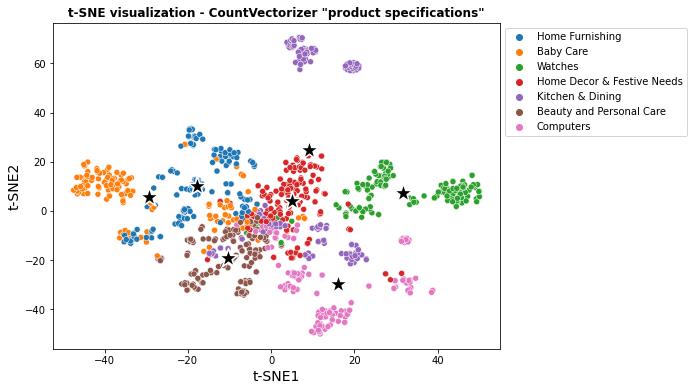

In [99]:
title = 't-SNE visualization - CountVectorizer "product specifications"'
tsne_visualisation(cv_tsne_prod_spec, title)

### 5.3 "description + product specifications" section - CountVectorizer

In [100]:
tsne_results_3 = tsne.fit_transform(df_countvect_desc_spec)
    
cv_tsne_desc_spec = pd.concat([pd.DataFrame(tsne_results_3), data_cleaned['prod_category1']], axis=1)
cv_tsne_desc_spec = cv_tsne_desc_spec.rename(columns={'prod_category1':'Category'})

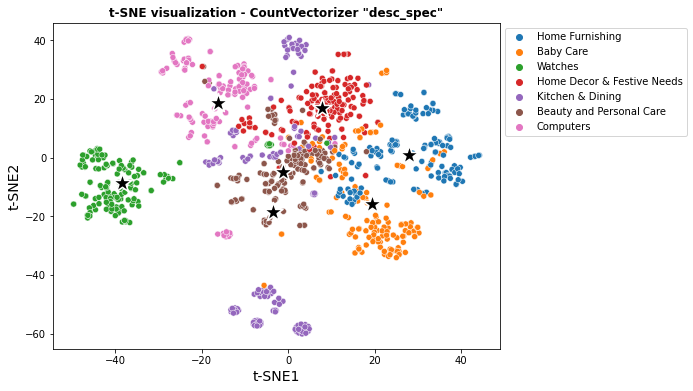

In [101]:
title = 't-SNE visualization - CountVectorizer "desc_spec"'
tsne_visualisation(cv_tsne_desc_spec, title)

### 5.4 "description" section - HashingVectorizer

In [102]:
tsne_results_4 = tsne.fit_transform(df_hashvect_desc)
    
hashvect_tsne_desc = pd.concat([pd.DataFrame(tsne_results_4), data_cleaned['prod_category1']], axis=1)
hashvect_tsne_desc = hashvect_tsne_desc.rename(columns={'prod_category1':'Category'})

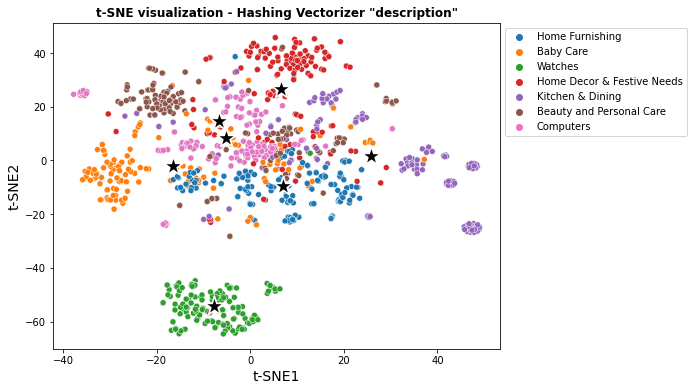

In [103]:
title = 't-SNE visualization - Hashing Vectorizer "description"'
tsne_visualisation(hashvect_tsne_desc, title)

### 5.5 "product specifications" section - HashingVectorizer

In [104]:
tsne_results_5 = tsne.fit_transform(df_hashvect_prod_spec)
    
hashvect_tsne_prod_spec = pd.concat([pd.DataFrame(tsne_results_5), data_cleaned['prod_category1']], axis=1)
hashvect_tsne_prod_spec = hashvect_tsne_prod_spec.rename(columns={'prod_category1':'Category'})

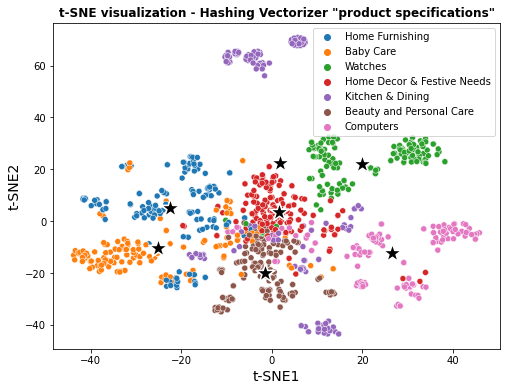

In [105]:
title = 't-SNE visualization - Hashing Vectorizer "product specifications"'
tsne_visualisation(hashvect_tsne_prod_spec, title)

### 5.6 "description + product specifications" section - HashingVectorizer

In [106]:
tsne_results_6 = tsne.fit_transform(df_hashvect_desc_spec)
    
hashvect_tsne_desc_spec = pd.concat([pd.DataFrame(tsne_results_6), data_cleaned['prod_category1']], axis=1)
hashvect_tsne_desc_spec = hashvect_tsne_desc_spec.rename(columns={'prod_category1':'Category'})

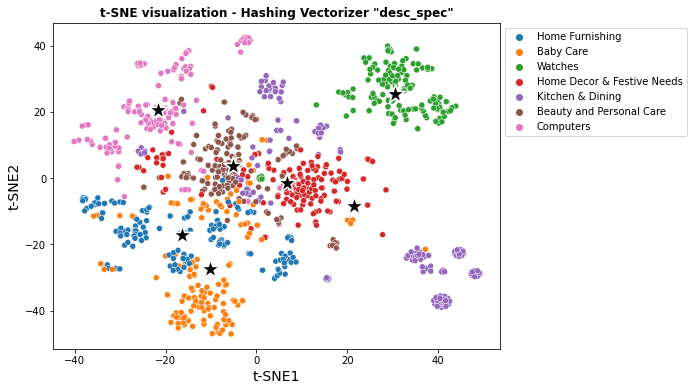

In [107]:
title = 't-SNE visualization - Hashing Vectorizer "desc_spec"'
tsne_visualisation(hashvect_tsne_desc_spec, title)

### 5.7 "description" section - Tf-idf Vectorizer

In [108]:
tsne_results_7 = tsne.fit_transform(df_tfidf_desc)
    
tfidf_tsne_desc = pd.concat([pd.DataFrame(tsne_results_7), data_cleaned['prod_category1']], axis=1)
tfidf_tsne_desc = tfidf_tsne_desc.rename(columns={'prod_category1':'Category'})

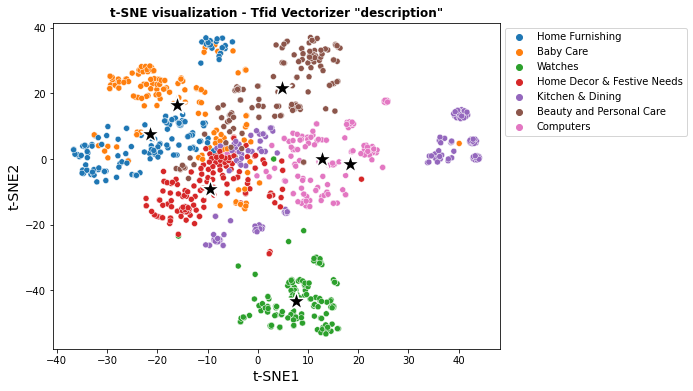

In [109]:
title = 't-SNE visualization - Tfid Vectorizer "description"'
tsne_visualisation(tfidf_tsne_desc, title)

### 5.8 "product specification" section - Tf-idf Vectorizer 

In [110]:
tsne_results_8 = tsne.fit_transform(df_tfidf_prod_spec)
    
tfidf_tsne_prod_spec = pd.concat([pd.DataFrame(tsne_results_8), data_cleaned['prod_category1']], axis=1)
tfidf_tsne_prod_spec = tfidf_tsne_prod_spec.rename(columns={'prod_category1':'Category'})

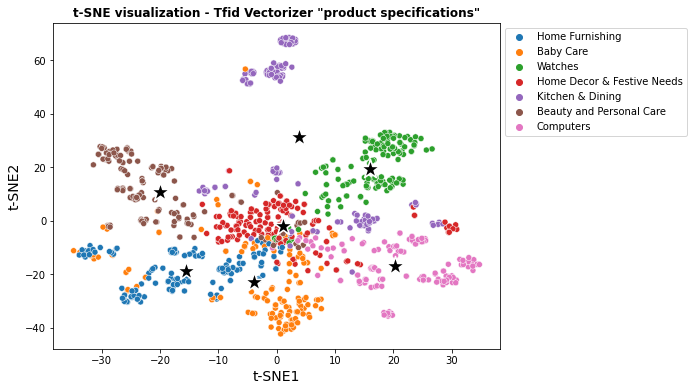

In [111]:
title = 't-SNE visualization - Tfid Vectorizer "product specifications"'
tsne_visualisation(tfidf_tsne_prod_spec, title)

### 5.9 "description + product specification" section - Tf-idf Vectorizer 

In [112]:
tsne_results_9 = tsne.fit_transform(df_tfidf_desc_spec)
    
tfidf_tsne_desc_spec = pd.concat([pd.DataFrame(tsne_results_9), data_cleaned['prod_category1']], axis=1)
tfidf_tsne_desc_spec = tfidf_tsne_desc_spec.rename(columns={'prod_category1':'Category'})

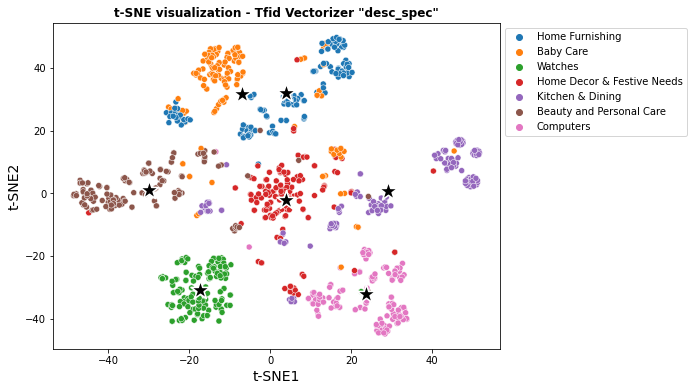

In [113]:
title = 't-SNE visualization - Tfid Vectorizer "desc_spec"'
tsne_visualisation(tfidf_tsne_desc_spec, title)

## 6. Clustering

### 6.1 KMeans clustering on PCA

#### 6.1.1 CountVectorizer on "description"

In [114]:
data_type = 'cv_pca_desc'

In [115]:
cv_pca_desc = pd.concat([pd.DataFrame(X_proj_cv),
                         data_cleaned['prod_category1']], axis=1)
cv_pca_desc = cv_pca_desc.rename(columns={'prod_category1':'Category'})

kmean = KMeans(n_clusters=7,
               init='k-means++',
               random_state=42).fit(cv_pca_desc.iloc[:, :n_comp1])

cv_pca_desc['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

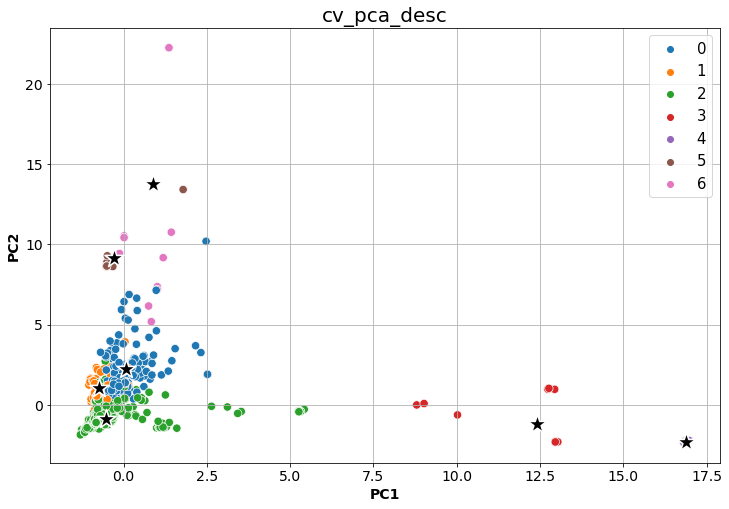

In [116]:
display_clusters_pca(X_proj_cv, cluster_labels, centres_reduced, data_type)

In [117]:
# 3d Scatter plot of clusters using K-means
threed_clustering(cv_pca_desc)

Number of products per cluster:
2    766
0    150
1     76
3     20
6     16
4     11
5     11
Name: cluster, dtype: int64


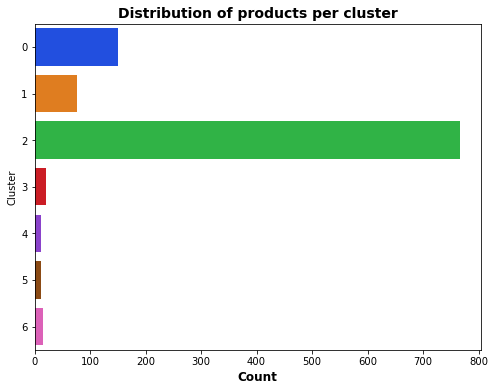

In [118]:
cluster_distribution(cv_pca_desc)

In [119]:
# Categories into clusters
cv_pca_desc.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Furnishing                   45
        Home Decor & Festive Needs        38
        Kitchen & Dining                  23
        Baby Care                         17
        Computers                         17
        Beauty and Personal Care           8
        Watches                            2
1       Baby Care                         76
2       Watches                          148
        Beauty and Personal Care         142
        Home Decor & Festive Needs       112
        Computers                        106
        Home Furnishing                  105
        Kitchen & Dining                  96
        Baby Care                         57
3       Kitchen & Dining                  20
4       Kitchen & Dining                  11
5       Computers                         11
6       Computers                         16

#### Metrics evaluation

Regarding clustering quality measures, the following list was considered: homogeneity, completeness, adjusted Rand index,
V-measure, Fowlkes–Mallows, and AMI.<br>

* The __Rand Index__ computes a similarity measure between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings.

The raw RI score is then “adjusted for chance” into the __ARI__ score using the following scheme:

ARI = (RI - Expected_RI) / (max(RI) - Expected_RI)

The adjusted Rand index is thus ensured to have a value close to 0 for random labeling independently of the number of clusters and samples and exactly 1 when the clusterings are identical (up to a permutation).

* __Homogeneity__ is a material or image that is homogeneous (uniform in composition or character) while __Completeness__ is a property of a statistic in relation to a model for a set of observed data. In essence, it ensures that the distributions corresponding to different values of the parameters are distinct. In particular Rosenberg and Hirschberg (2007) define the following two desirable objectives for any cluster assignment:

homogeneity: each cluster contains only members of a single class.<br>
completeness: all members of a given class are assigned to the same cluster.<br>
Their harmonic mean is called __V-measure__.<br>

* Adjusted mutual information (__AMI__) is a variation of mutual information and may be used for comparing clusterings. It corrects the effect of agreement solely due to chance between clusterings, similar to the way the adjusted rand index corrects the Rand index. The Mutual Information is a function that measures the agreement of the two assignments, ignoring permutations. Two different normalized versions of this measure are available, Normalized Mutual Information (NMI) and Adjusted Mutual Information (AMI).

* The __Fowlkes–Mallows__ index is an external evaluation method that is used to determine the similarity between two clusterings (clusters obtained after a clustering algorithm), and also a metric to measure confusion matrices. This measure of similarity could be either between two hierarchical clusterings or a clustering and a benchmark classification. A higher value for the Fowlkes–Mallows index indicates a greater similarity between the clusters and the benchmark classifications. The Fowlkes-Mallows index can be used when the ground truth class assignments of the samples is known. The Fowlkes-Mallows score FMI is defined as the geometric mean of the pairwise precision and recall.

In [120]:
results_cv_pca_desc = metrics_clusters(cv_pca_desc, data_type)
results_cv_pca_desc

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.15851,0.330658,0.214293,0.203763,0.321146


#### Summary for PCA + CountVectorizer on "description"

* PCA CountVectorizer on "description" cannot properly capture the different categories.<br> 
We need to keep in mind that each cluster shoud ideally contain 150 products from the same category.

- Cluster 0 contains almost all products and no classification is being made
- A poor ARI score of 0.04

#### 6.2.2 CountVectorizer on "product specifications"

In [121]:
data_type = 'cv_pca_prod_spec'

In [122]:
cv_pca_spec = pd.concat([pd.DataFrame(X_proj_cv_spec),
                         data_cleaned['prod_category1']], axis=1)
cv_pca_spec = cv_pca_spec.rename(columns={'prod_category1':'Category'})

kmean = KMeans(n_clusters=7,
               init='k-means++',
               random_state=42).fit(cv_pca_spec.iloc[:, :n_comp2])

cv_pca_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

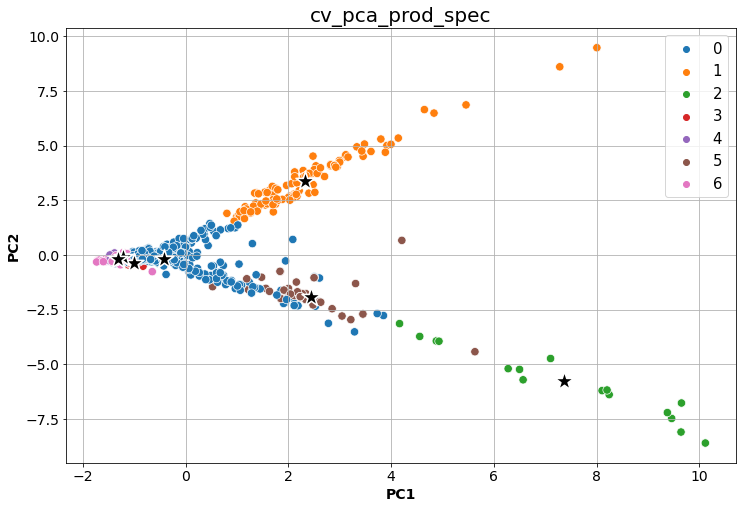

In [123]:
display_clusters_pca(X_proj_cv_spec, cluster_labels, centres_reduced, data_type)

In [124]:
# # 3d Scatter plot of clusters using K-means
threed_clustering(cv_pca_spec)

Number of products per cluster:
0    715
1    109
6     77
3     74
5     48
2     16
4     11
Name: cluster, dtype: int64


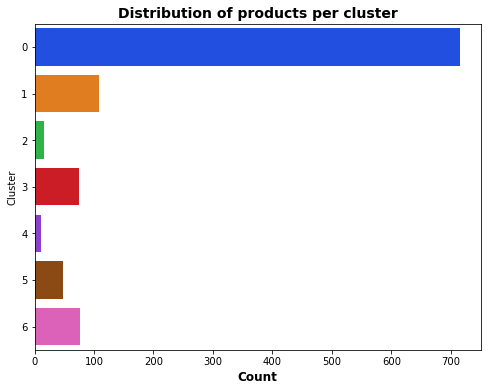

In [125]:
cluster_distribution(cv_pca_spec)

In [126]:
# Categories into clusters
cv_pca_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Beauty and Personal Care         149
        Home Decor & Festive Needs       143
        Baby Care                        132
        Computers                         98
        Home Furnishing                   79
        Kitchen & Dining                  73
        Watches                           41
1       Watches                          109
2       Computers                         16
3       Kitchen & Dining                  74
4       Home Furnishing                   10
        Baby Care                          1
5       Computers                         36
        Home Decor & Festive Needs         7
        Kitchen & Dining                   3
        Baby Care                          1
        Beauty and Personal Care           1
6       Home Furnishing                   61
        Baby Care                         16

### Clustering metrics

In [127]:
results_cv_pca_spec = metrics_clusters(cv_pca_spec, data_type)
results1 = results_cv_pca_desc.append(results_cv_pca_spec, ignore_index=True)
results1

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289


#### Summary for PCA + CountVectorizer on "product specifications"

* Once again cluster 0 contains more than 700 products and no classification can be made.
    
- A poor ARI score of 0.08

#### 6.2.3 CountVectorizer on "description + product specifications"

In [128]:
data_type = 'cv_pca_desc_spec'

In [129]:
cv_pca_desc_spec = pd.concat([pd.DataFrame(X_proj_cv_desc_spec),
                              data_cleaned['prod_category1']], axis=1)
cv_pca_desc_spec = cv_pca_desc_spec.rename(columns={'prod_category1':'Category'})

kmean = KMeans(n_clusters=7,
               init='k-means++',
               random_state=42).fit(cv_pca_desc_spec.iloc[:, :n_comp3])

cv_pca_desc_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

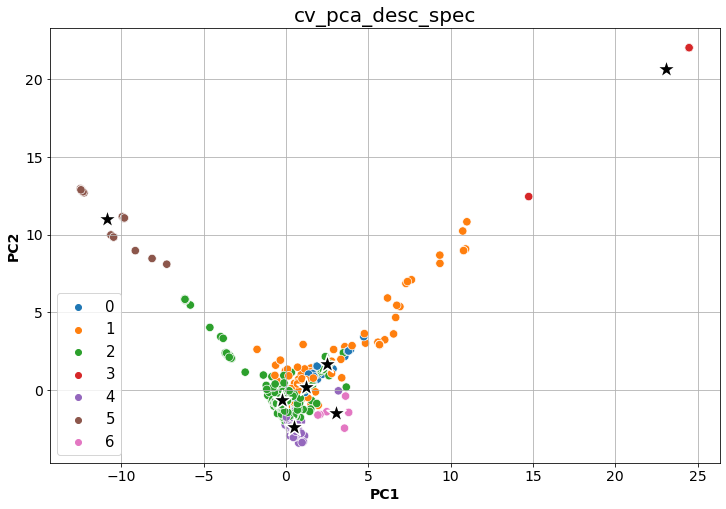

In [130]:
display_clusters_pca(X_proj_cv_desc_spec, cluster_labels, centres_reduced, data_type)

In [131]:
# 3d Scatter plot of clusters using K-means
threed_clustering(cv_pca_spec)

Number of products per cluster:
2    770
1    102
4     77
0     56
5     31
3      7
6      7
Name: cluster, dtype: int64


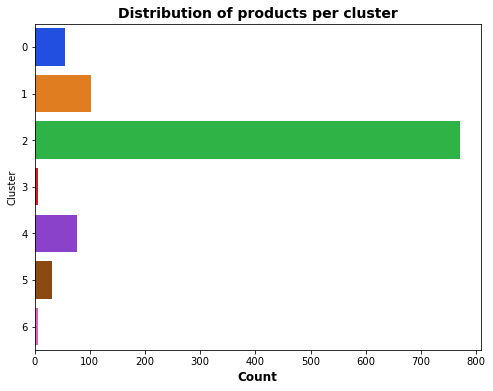

In [132]:
cluster_distribution(cv_pca_desc_spec)

In [133]:
# Categories into clusters
cv_pca_desc_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Computers                         54
        Home Decor & Festive Needs         1
        Kitchen & Dining                   1
1       Home Decor & Festive Needs        28
        Home Furnishing                   28
        Computers                         27
        Kitchen & Dining                  11
        Baby Care                          5
        Beauty and Personal Care           3
2       Watches                          150
        Beauty and Personal Care         147
        Home Decor & Festive Needs       121
        Home Furnishing                  119
        Kitchen & Dining                 107
        Baby Care                         64
        Computers                         62
3       Computers                          7
4       Baby Care                         77
5       Kitchen & Dining                  31
6       Baby Care                          4
        Home Furnishing                    3

#### Clustering metrics

In [134]:
results_cv_pca_desc_spec = metrics_clusters(cv_pca_desc_spec, data_type)
results2 = results1.append(results_cv_pca_desc_spec, ignore_index=True)
results2

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653


#### Summary for PCA + CountVectorizer on "description + product specifications"

* 6 categories are found but the distribution of the products in each cluster is once again poor. Cluster 6 contains too many products while cluster 0, 1, 2, 3, 4 & 5 too few. Categories Home decor & Festive Needs, Home Furnishing are not represented while Computers and Baby Care represent 2 clusters each.
    
- Poor ARI score of 0.14

#### 6.2.4 HashingVectorizer on "description"

In [135]:
data_type = 'hashvect_pca_desc'

In [136]:
hash_pca_desc = pd.concat([pd.DataFrame(X_proj_hashvect_desc), data_cleaned['prod_category1']], axis=1)
hash_pca_desc = hash_pca_desc.rename(columns={'prod_category1':'Category'})

# Apply KMeans with optimum K
kmean = KMeans(n_clusters=7,
                  init='k-means++',
                  random_state=42).fit(hash_pca_desc.iloc[:, :n_comp4])

hash_pca_desc['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

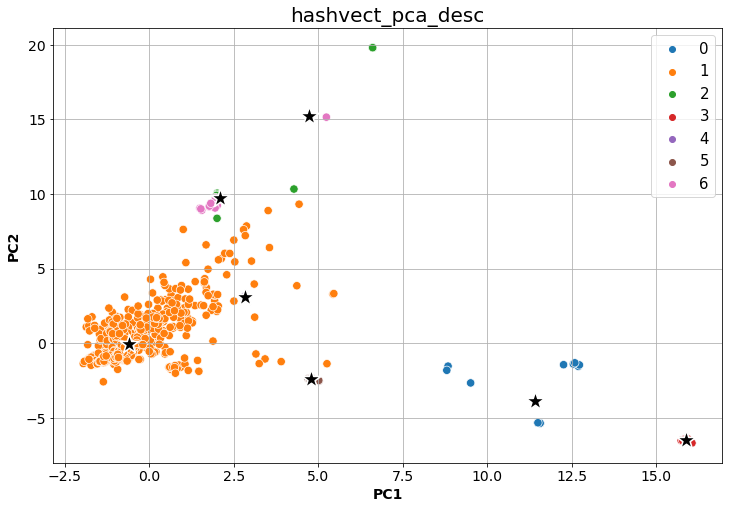

In [137]:
display_clusters_pca(X_proj_hashvect_desc, cluster_labels, centres_reduced, data_type)

### 3D clustering visualization

In [138]:
threed_clustering(hash_pca_desc)

Number of products per cluster:
1    974
5     21
0     20
2     11
3     11
6     11
4      2
Name: cluster, dtype: int64


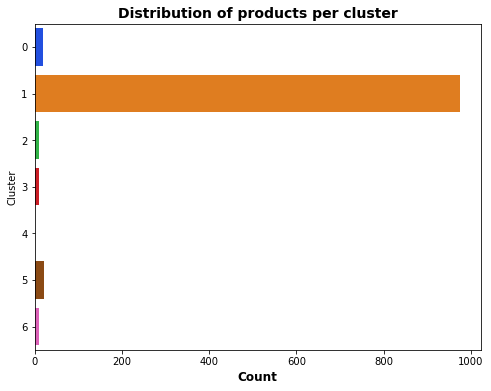

In [139]:
cluster_distribution(hash_pca_desc)

### Clusters metrics

In [140]:
# PCA + HashingVectorizer on "description" 
results_hash_pca_desc = metrics_clusters(hash_pca_desc, data_type)
results3 = results2.append(results_hash_pca_desc, ignore_index=True)
results3

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306


#### 6.2.5 HashingVectorizer on "product description"

In [141]:
data_type = 'hashvect_pca_spec'

In [142]:
hash_pca_spec = pd.concat([pd.DataFrame(X_proj_hashvect_prod_spec),
                           data_cleaned['prod_category1']], axis=1)
hash_pca_spec = hash_pca_spec.rename(columns={'prod_category1':'Category'})
# Apply KMeans with optimum K
kmean = KMeans(n_clusters=7,
                  init='k-means++',
                  random_state=42).fit(hash_pca_spec.iloc[:, :n_comp5])

hash_pca_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

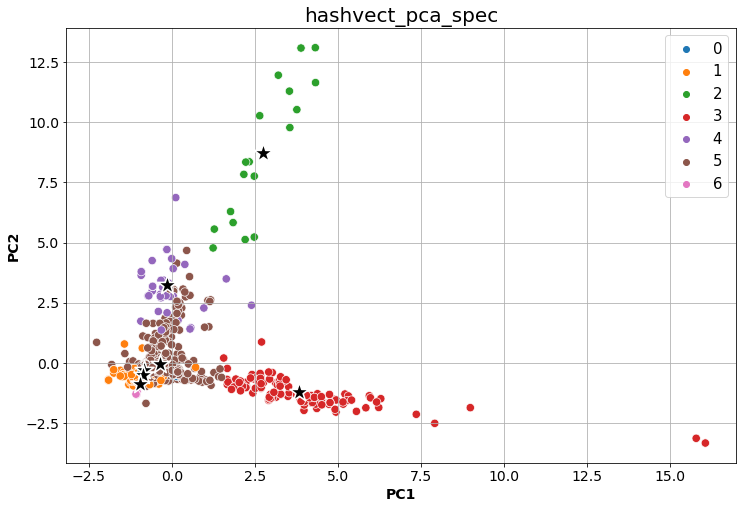

In [143]:
display_clusters_pca(X_proj_hashvect_prod_spec, cluster_labels, centres_reduced, data_type)

In [144]:
threed_clustering(hash_pca_spec)

Number of products per cluster:
5    577
1    199
3    112
0     74
4     49
6     21
2     18
Name: cluster, dtype: int64


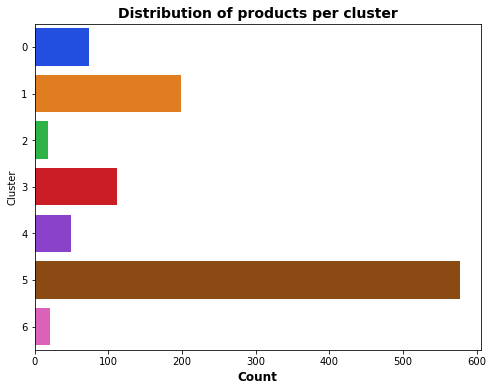

In [145]:
cluster_distribution(hash_pca_spec)

### Clusters metrics

In [146]:
# PCA + HashingVectorizer on "product specifications" 
results_hash_pca_spec = metrics_clusters(hash_pca_spec, data_type)
results4 = results3.append(results_hash_pca_spec, ignore_index=True)
results4

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708


#### 6.2.6 HashingVectorizer on "description + product description"

In [147]:
data_type = 'hashvect_pca_desc_spec'

In [148]:
hash_pca_desc_spec = pd.concat([pd.DataFrame(X_proj_hashvect_desc_spec),
                                data_cleaned['prod_category1']], axis=1)
hash_pca_desc_spec = hash_pca_desc_spec.rename(columns={'prod_category1':'Category'})
# Apply KMeans with optimum K
# vars = ['PC1', 'PC2']
kmean = KMeans(n_clusters=7,
                  init='k-means++',
                  random_state=42).fit(hash_pca_desc_spec.iloc[:, :n_comp6])

hash_pca_desc_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

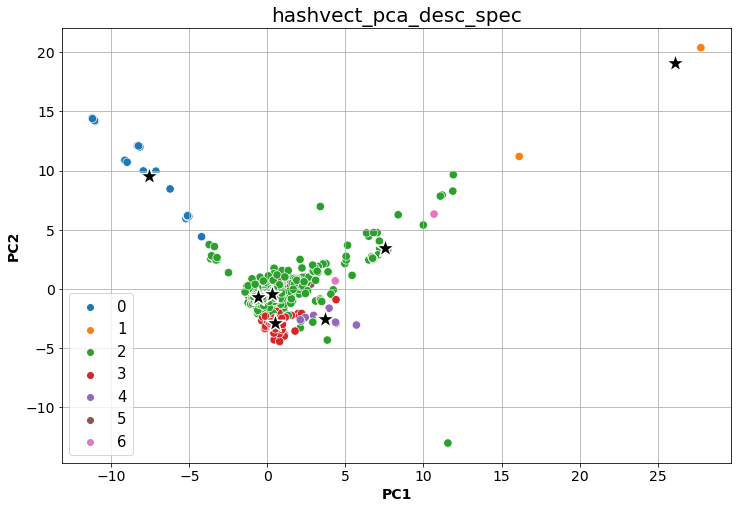

In [149]:
display_clusters_pca(X_proj_hashvect_desc_spec, cluster_labels, centres_reduced, data_type)

In [150]:
threed_clustering(hash_pca_desc_spec)

Number of products per cluster:
2    770
5    132
3     78
0     54
1      7
4      7
6      2
Name: cluster, dtype: int64


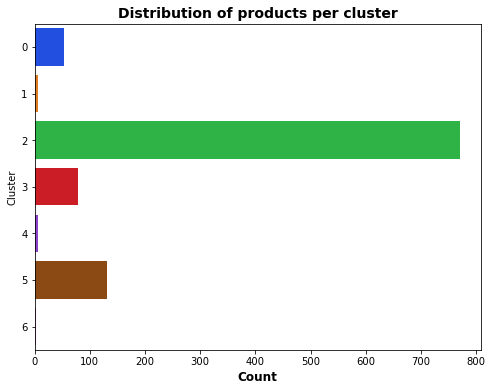

In [151]:
cluster_distribution(hash_pca_desc_spec)

### Clusters metrics

In [152]:
# PCA + HashingVectorizer on "product specifications" 
results_hash_pca_desc_spec = metrics_clusters(hash_pca_desc_spec, data_type)
results5 = results4.append(results_hash_pca_desc_spec, ignore_index=True)
results5

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333


#### 6.2.7 Tf-idf Vectorizer on "description"

In [153]:
data_type = 'tfidf_pca_desc'

In [154]:
tfidf_pca_desc = pd.concat([pd.DataFrame(X_proj_tfidf_desc), data_cleaned['prod_category1']], axis=1)
tfidf_pca_desc = tfidf_pca_desc.rename(columns={'prod_category1':'Category'})

# Apply KMeans with K=7
kmean = KMeans(n_clusters=7,
               init='k-means++',
               random_state=42).fit(tfidf_pca_desc.iloc[:, :n_comp7])

tfidf_pca_desc['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

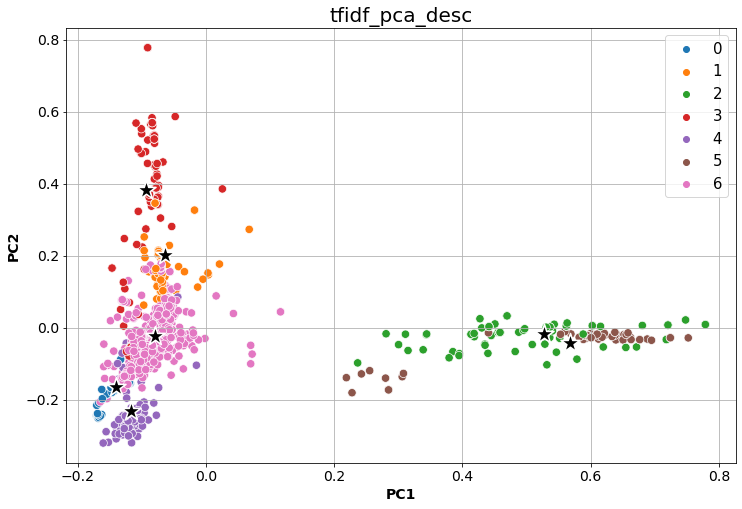

In [155]:
display_clusters_pca(X_proj_tfidf_desc, cluster_labels, centres_reduced, data_type)

In [156]:
threed_clustering(tfidf_pca_desc)

Number of products per cluster:
6    590
3     91
2     90
4     81
0     75
1     66
5     57
Name: cluster, dtype: int64


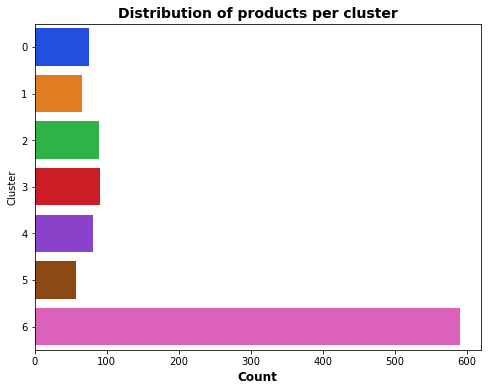

In [157]:
cluster_distribution(tfidf_pca_desc)

In [158]:
# Categories into clusters
tfidf_pca_desc.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Kitchen & Dining                  74
        Baby Care                          1
1       Home Decor & Festive Needs        64
        Beauty and Personal Care           1
        Kitchen & Dining                   1
2       Watches                           90
3       Beauty and Personal Care          68
        Home Furnishing                   13
        Baby Care                         10
4       Baby Care                         81
5       Watches                           57
6       Computers                        150
        Home Furnishing                  137
        Home Decor & Festive Needs        86
        Beauty and Personal Care          81
        Kitchen & Dining                  75
        Baby Care                         58
        Watches                            3

In [159]:
# PCA + Tf-idf Vectorizer on "description" 
results_tfidf_pca_desc = metrics_clusters(tfidf_pca_desc, data_type)
results6 = results5.append(results_tfidf_pca_desc, ignore_index=True)
results6

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236


#### Summary for ¨PCA + Tf_idf Vectorizer on "description"

    - Cluster 0 : Computers & Home Furnishing (150/614) (150 Computers products/total number of products in the cluster: 614)
    - Cluster 1 : Kitchen & Dining (53/54)
    - Cluster 2 : Watches (147/147)
    - Cluster 3 : Home Decor & Festive Needs (63/65)
    - Cluster 4 : Kitchen & Dining (21/21)
    - Cluster 5 : Beauty & Personal Care (68/68)
    - Cluster 6 : Baby Care (81/81)
    
- ARI score of 0.22

#### 6.2.8 Tf-idf Vectorizer on "product specifications"

In [160]:
data_type = 'tfidf_pca_prod_spec'

In [161]:
tfidf_pca_spec = pd.concat([pd.DataFrame(X_proj_tfidf_prod_spec),
                            data_cleaned['prod_category1']], axis=1)
tfidf_pca_spec = tfidf_pca_spec.rename(columns={'prod_category1':'Category'})

# Apply KMeans with optimum K
# vars = ['PC1', 'PC2']
kmean = KMeans(n_clusters=7,
                  init='k-means++',
                  random_state=42).fit(tfidf_pca_spec.iloc[:, :n_comp8])

tfidf_pca_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

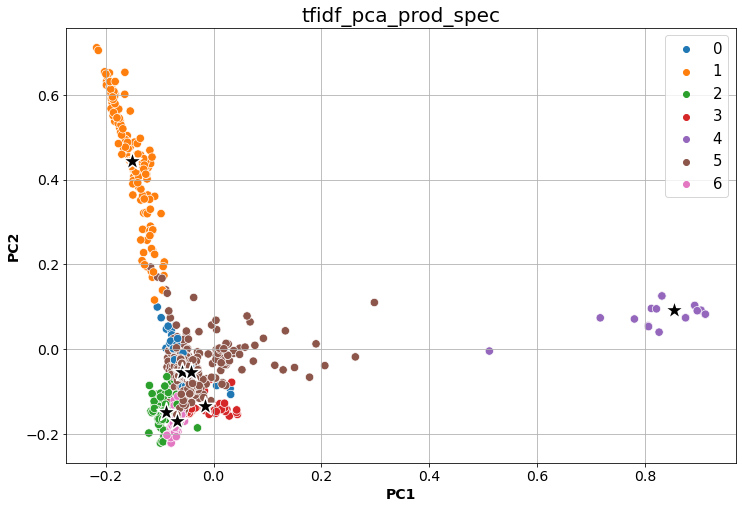

In [162]:
display_clusters_pca(X_proj_tfidf_prod_spec, cluster_labels, centres_reduced, data_type)

In [163]:
threed_clustering(tfidf_pca_spec)

Number of products per cluster:
5    480
1    142
2    106
6     99
0     97
4     75
3     51
Name: cluster, dtype: int64


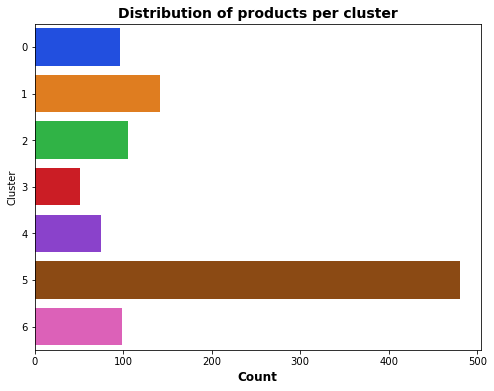

In [164]:
cluster_distribution(tfidf_pca_spec)

In [165]:
# Categories into clusters
tfidf_pca_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Decor & Festive Needs        97
1       Watches                          142
2       Baby Care                         84
        Home Furnishing                   22
3       Beauty and Personal Care          51
4       Kitchen & Dining                  74
        Baby Care                          1
5       Computers                        150
        Beauty and Personal Care          99
        Kitchen & Dining                  76
        Home Decor & Festive Needs        53
        Home Furnishing                   51
        Baby Care                         43
        Watches                            8
6       Home Furnishing                   77
        Baby Care                         22

### Clusters metrics  

In [166]:
# PCA + Tf-idf Vectorizer on "product_specification" 
results_tfidf_pca_spec = metrics_clusters(tfidf_pca_spec, data_type)
results7 = results6.append(results_tfidf_pca_spec, ignore_index=True)
results7

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896


#### Summary for ¨PCA + Tf_idf Vectorizer on "product specifications"

    - Cluster 0 : Beauty and Personal Care (90/90)
    - Cluster 1 : Baby Care (90/126)
    - Cluster 2 : Watches (142/142)
    - Cluster 3 : Computers (49/49)
    - Cluster 4 : Home Furnishing (55/63)
    - Cluster 5 : Kitchen & Dining (74/75)
    - Cluster 6 : Home Decor & Festive Needs (150/505)
    
- ARI score of 0.27

#### 6.2.9 Tf-idf Vectorizer on "description + product specifications"

In [167]:
data_type = 'tfidf_pca_desc_spec'

In [168]:
tfidf_pca_desc_spec = pd.concat([pd.DataFrame(X_proj_tfidf_desc_spec),
                                 data_cleaned['prod_category1']], axis=1)
tfidf_pca_desc_spec = tfidf_pca_desc_spec.rename(columns={'prod_category1':'Category'})

# Apply KMeans with optimum K
kmean = KMeans(n_clusters=7,
                  init='k-means++',
                  random_state=42).fit(tfidf_pca_desc_spec.iloc[:, :n_comp9])

tfidf_pca_desc_spec['cluster'] = kmean.labels_
cluster_labels = kmean.labels_
centres_reduced = kmean.cluster_centers_

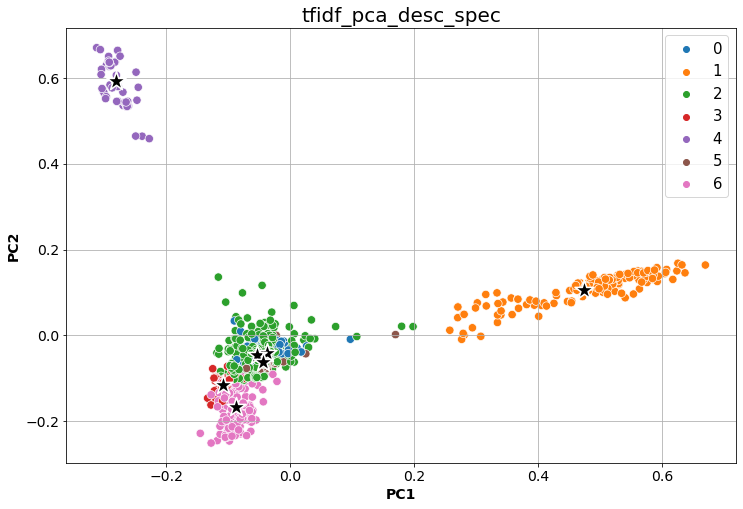

In [169]:
display_clusters_pca(X_proj_tfidf_desc_spec, cluster_labels, centres_reduced, data_type)

In [170]:
threed_clustering(tfidf_pca_desc_spec)

Number of products per cluster:
2    405
1    149
6    141
5    130
0     95
4     75
3     55
Name: cluster, dtype: int64


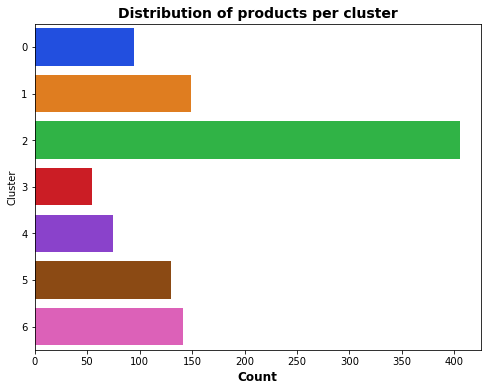

In [171]:
cluster_distribution(tfidf_pca_desc_spec)

In [172]:
# Categories into clusters
tfidf_pca_desc_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Decor & Festive Needs        94
        Beauty and Personal Care           1
1       Watches                          149
2       Beauty and Personal Care         147
        Kitchen & Dining                  76
        Home Furnishing                   68
        Home Decor & Festive Needs        55
        Baby Care                         35
        Computers                         23
        Watches                            1
3       Home Furnishing                   50
        Baby Care                          5
4       Kitchen & Dining                  74
        Baby Care                          1
5       Computers                        127
        Beauty and Personal Care           2
        Home Decor & Festive Needs         1
6       Baby Care                        109
        Home Furnishing                   32

### Clusters metrics  

In [173]:
# PCA + Tf-idf Vectorizer on "desc_spec" 
results_tfidf_pca_desc_spec = metrics_clusters(tfidf_pca_desc_spec, data_type)
results8 = results7.append(results_tfidf_pca_desc_spec, ignore_index=True)
results8

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182


#### Summary for ¨PCA + Tf_idf Vectorizer on "description + product specifications"

* 7 categories were found this time & there is a significant improvement in the ARI score. Watches and Computers are well represented in their respective clusters. Cluster 2 however contains too many products.<br>


    - Cluster 0 : Home Decor & Festive Needs (94/95)
    - Cluster 1 : Watches (149/149)
    - Cluster 2 : Beauty & Personal Care (147/417)
    - Cluster 3 : Home furnishing (53/58)
    - Cluster 4 : Kitchen & Dining (74/75)
    - Cluster 5 : Computers (127/130)
    - Cluster 6 : Baby Care (102/126)


- ARI score of 0.41

All in all, clustering after PCA returns poor results. A Max ARI score of 0.41 is obtained with Tf-idf on "description + product specifications" section. We can notice that the category "Watches" is the easiest to classify.

### 6.1 KMeans clustering on t-SNE

#### 6.1.1 t-SNE - CountVectorizer - "description" section

In [174]:
data_type = 'cv_tsne_desc'

In [175]:
# Kmeans
tsne_cv_desc = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(cv_tsne_desc.iloc[:, :2])
 
cv_tsne_desc['cluster'] = tsne_cv_desc.labels_
cluster_labels = tsne_cv_desc.labels_
centres_reduced = tsne_cv_desc.cluster_centers_

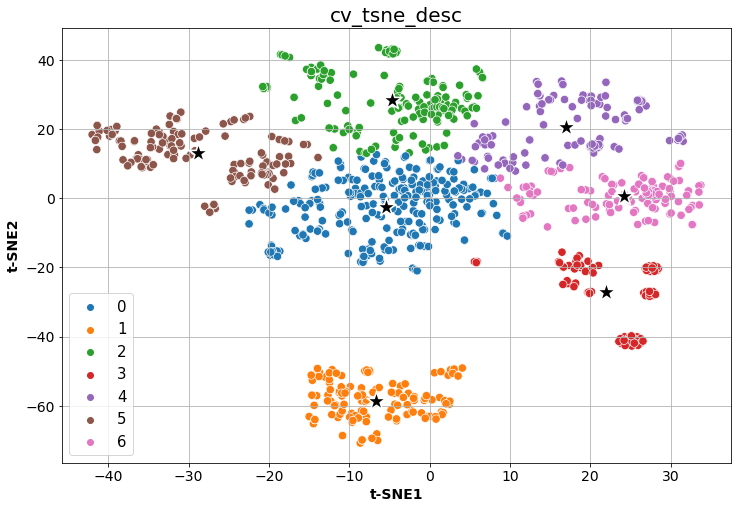

In [176]:
display_clusters_tsne(tsne_results_1, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    272
2    173
1    149
5    140
4    120
6    115
3     81
Name: cluster, dtype: int64


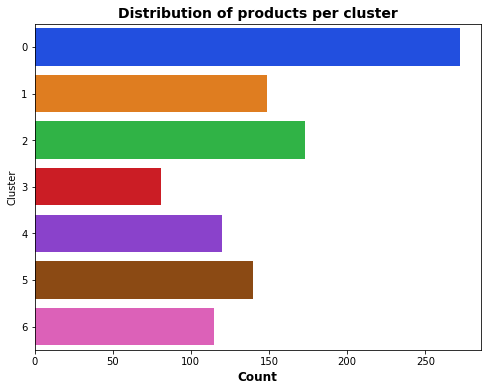

In [177]:
cluster_distribution(cv_tsne_desc)

In [178]:
# Categories into clusters
cv_tsne_desc.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Furnishing                  118
        Computers                         55
        Beauty and Personal Care          38
        Baby Care                         25
        Home Decor & Festive Needs        18
        Kitchen & Dining                  17
        Watches                            1
1       Watches                          149
2       Beauty and Personal Care          87
        Computers                         55
        Home Decor & Festive Needs        15
        Kitchen & Dining                  13
        Baby Care                          3
3       Kitchen & Dining                  79
        Baby Care                          1
        Home Decor & Festive Needs         1
4       Kitchen & Dining                  40
        Computers                         39
        Home Decor & Festive Needs        21
        Beauty and Personal Care          12
        Baby Care                          8
5       Baby Care                        104
        Home Furnishing                   32
        Beauty and Personal Care           3
        Home Decor & Festive Needs         1
6       Home Decor & Festive Needs        94
        Beauty and Personal Care          10
        Baby Care                          9
        Computers                          1
        Kitchen & Dining                   1

#### Metrics evaluation for the different models

In [179]:
results_cv_tsne_desc = metrics_clusters(cv_tsne_desc, data_type)
results1_1 = results8.append(results_cv_tsne_desc, ignore_index=True)
results1_1

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for ¨t-SNE + CountVectorizer on "description"

* 6 categories are found and the number of products in each cluster is relatively better than with PCA except for cluster 0 with 272 products and cluster 4 with only 40 products. Kitchen & Dining are split between cluster 3 & 4 while Computers category is not represented. Results are the following:


    - Cluster 0 : Home Furnishing (118/272) 
    - Cluster 1 : Watches (149/149)
    - Cluster 2 : Beauty and Personal Care (87/173)
    - Cluster 3 : Kitchen & Dining (79/81)
    - Cluster 4 : Kitchen & Dining (40/120)
    - Cluster 5 : Baby Care (104/140)
    - Cluster 6 : Home decor & Festive Needs (94/115)
    
    
- ARI score of 0.40

#### 6.1.2 t-SNE - CountVectorizer - "product specifications" section

In [180]:
data_type = 'cv_tsne_prod_spec'

In [181]:
# Kmeans
tsne_cv_prod_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(cv_tsne_prod_spec.iloc[:, :2])
 
cv_tsne_prod_spec['cluster'] = tsne_cv_prod_spec.labels_
cluster_labels = tsne_cv_prod_spec.labels_
centres_reduced = tsne_cv_prod_spec.cluster_centers_

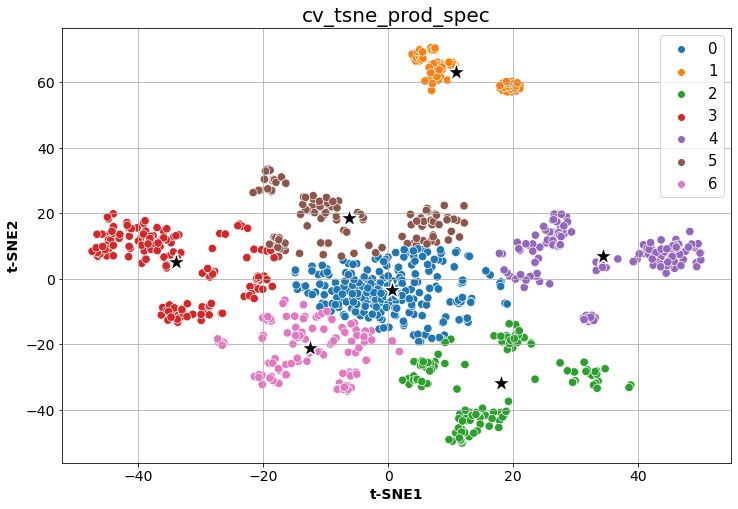

In [182]:
display_clusters_tsne(tsne_results_2, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    250
3    160
2    149
4    146
6    137
5    134
1     74
Name: cluster, dtype: int64


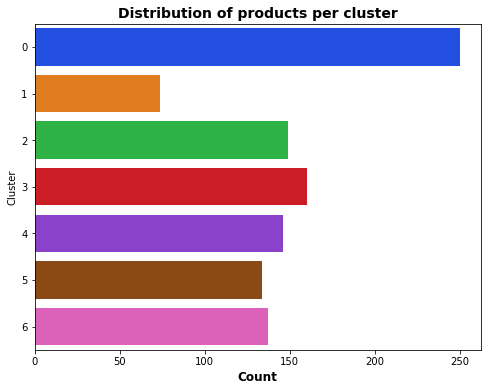

In [183]:
cluster_distribution(cv_tsne_prod_spec)

In [184]:
# Categories into clusters
cv_tsne_prod_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Decor & Festive Needs        94
        Baby Care                         35
        Kitchen & Dining                  35
        Beauty and Personal Care          34
        Computers                         22
        Watches                           16
        Home Furnishing                   14
1       Kitchen & Dining                  74
2       Computers                        116
        Kitchen & Dining                  29
        Home Decor & Festive Needs         3
        Beauty and Personal Care           1
3       Baby Care                        100
        Home Furnishing                   60
4       Watches                          134
        Computers                         11
        Home Decor & Festive Needs         1
5       Home Furnishing                   76
        Home Decor & Festive Needs        49
        Baby Care                          9
6       Beauty and Personal Care         115
        Kitchen & Dining                  12
        Baby Care                          6
        Home Decor & Festive Needs         3
        Computers                          1

In [185]:
results_cv_tsne_prod_spec = metrics_clusters(cv_tsne_prod_spec, data_type)
results1_2 = results1_1.append(results_cv_tsne_prod_spec, ignore_index=True)
results1_2

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for t-SNE + CountVectorizer on "product specifications"

* 7 categories are found but the distribution of the products in each cluster is poor. Cluster 0 contains too many products while cluster 2 & 6 too few. Once again the "Watches" category is the easiest to classify. Results are the following:


    - Cluster 0 : Home decor & Festive Needs (98/279)
    - Cluster 1 : Watches (144/144)
    - Cluster 2 : Kitchen & Dining (74/74)
    - Cluster 3 : Computers (125/162)
    - Cluster 4 : Home Furnishing (99/151)
    - Cluster 5 : Baby Care (96/139)
    - Cluster 6 : Beauty and Personal Care (97/101)
    
- ARI score of 0.45.

### 6.1.3 t-SNE - CountVectorizer - "description + product specifications" section

In [186]:
data_type = 'cv_tsne_desc_spec'

In [187]:
# Kmeans
tsne_cv_desc_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(cv_tsne_desc_spec.iloc[:, :2])
 
cv_tsne_desc_spec['cluster'] = tsne_cv_desc_spec.labels_
cluster_labels = tsne_cv_desc_spec.labels_
centres_reduced = tsne_cv_desc_spec.cluster_centers_

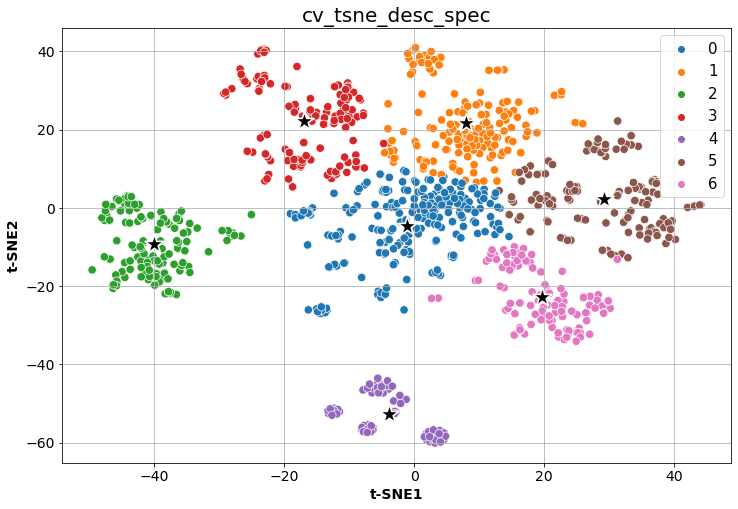

In [188]:
display_clusters_tsne(tsne_results_3, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    238
1    175
5    152
3    147
2    143
6    120
4     75
Name: cluster, dtype: int64


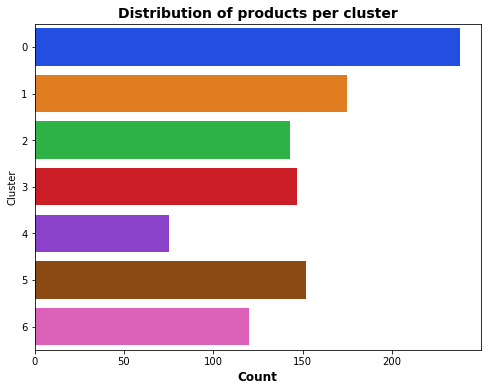

In [189]:
cluster_distribution(cv_tsne_desc_spec)

In [190]:
# Categories into clusters
cv_tsne_desc_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Beauty and Personal Care         132
        Kitchen & Dining                  35
        Computers                         24
        Baby Care                         22
        Home Decor & Festive Needs        12
        Watches                            7
        Home Furnishing                    6
1       Home Decor & Festive Needs       120
        Kitchen & Dining                  33
        Beauty and Personal Care           9
        Baby Care                          7
        Home Furnishing                    4
        Computers                          2
2       Watches                          143
3       Computers                        124
        Home Decor & Festive Needs        11
        Kitchen & Dining                   8
        Beauty and Personal Care           4
4       Kitchen & Dining                  74
        Baby Care                          1
5       Home Furnishing                  123
        Baby Care                         21
        Home Decor & Festive Needs         7
        Beauty and Personal Care           1
6       Baby Care                         99
        Home Furnishing                   17
        Beauty and Personal Care           4

In [191]:
results_cv_tsne_desc_spec = metrics_clusters(cv_tsne_desc_spec, data_type)
results1_3 = results1_2.append(results_cv_tsne_desc_spec, ignore_index=True)
results1_3

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for t-SNE + CountVectorizer on "description + product specifications"

* 7 categories are found, the distribution of products in each cluster is better but cluster 0 contains too many products while cluster 4 too few. "Watches", "Home Furnishing" & "Computers" categories are relatively well assigned. Results are the following:


    - Cluster 0 : Beauty and Personal Care (132/238)
    - Cluster 1 : Home decor & Festive Needs (120/175)
    - Cluster 2 : Watches (143/143)
    - Cluster 3 : Computers (124/147)
    - Cluster 4 : Kitchen & Dining (74/75)
    - Cluster 5 : Home Furnishing (123/152)
    - Cluster 6 : Baby Care (99/120)
    

- ARI score of 0.55

#### 6.1.4 t-SNE - HashingVectorizer - "description" section

In [192]:
data_type = 'hash_tsne_desc'

In [193]:
# Kmeans
tsne_hash_desc = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(hashvect_tsne_desc.iloc[:, :2])
 
hashvect_tsne_desc['cluster'] = tsne_hash_desc.labels_
cluster_labels = tsne_hash_desc.labels_
centres_reduced = tsne_hash_desc.cluster_centers_

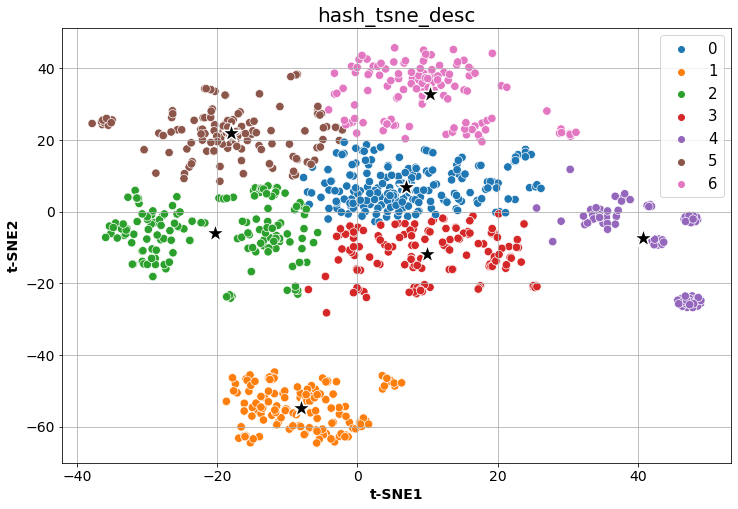

In [194]:
display_clusters_tsne(tsne_results_4, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    200
2    171
5    152
3    151
1    150
6    142
4     84
Name: cluster, dtype: int64


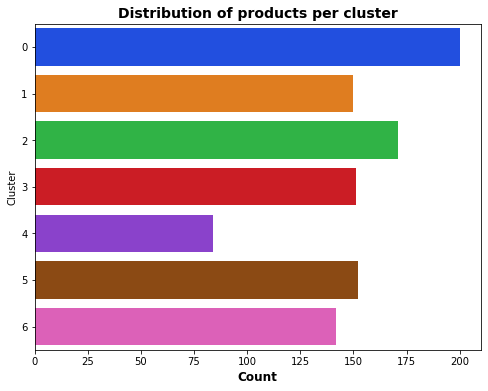

In [195]:
cluster_distribution(hashvect_tsne_desc)

In [196]:
# t_SNE + HashingVectorizer on "description" 
results_hashvect_tsne_desc = metrics_clusters(hashvect_tsne_desc, data_type)
results1_4 = results1_3.append(results_hashvect_tsne_desc, ignore_index=True)
results1_4

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


### 6.1.5 t-SNE - HashingVectorizer - "product specifications" section

In [197]:
data_type = 'hash_tsne_prod_spec'

In [198]:
# Kmeans
tsne_hash_prod_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(hashvect_tsne_prod_spec.iloc[:, :2])
 
hashvect_tsne_prod_spec['cluster'] = tsne_hash_prod_spec.labels_
cluster_labels = tsne_hash_prod_spec.labels_
centres_reduced = tsne_hash_prod_spec.cluster_centers_

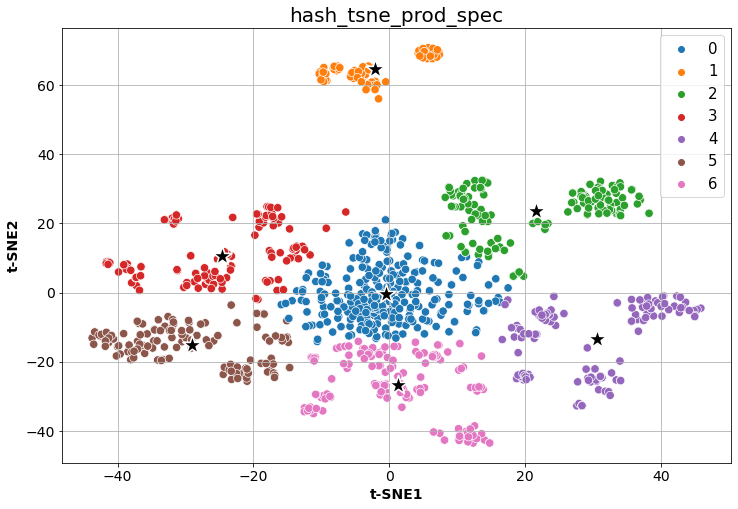

In [199]:
display_clusters_tsne(tsne_results_5, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    291
6    150
2    142
4    134
5    133
3    126
1     74
Name: cluster, dtype: int64


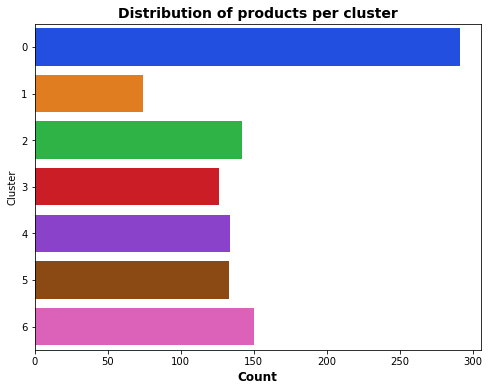

In [200]:
cluster_distribution(hashvect_tsne_prod_spec)

#### Cluster metrics

In [201]:
# tSNE + HashingVectorizer on "product specifications" 
results_hashvect_tsne_prod_spec = metrics_clusters(hashvect_tsne_prod_spec, data_type)
results1_5 = results1_4.append(results_hashvect_tsne_prod_spec, ignore_index=True)
results1_5

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 6.1.6 t-SNE - HashingVectorizer - "description + product specifications" section

In [202]:
data_type = 'hash_tsne_desc_spec'

In [203]:
# Kmeans
tsne_hash_desc_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(hashvect_tsne_desc_spec.iloc[:, :2])
 
hashvect_tsne_desc_spec['cluster'] = tsne_hash_desc_spec.labels_
cluster_labels = tsne_hash_desc_spec.labels_
centres_reduced = tsne_hash_desc_spec.cluster_centers_

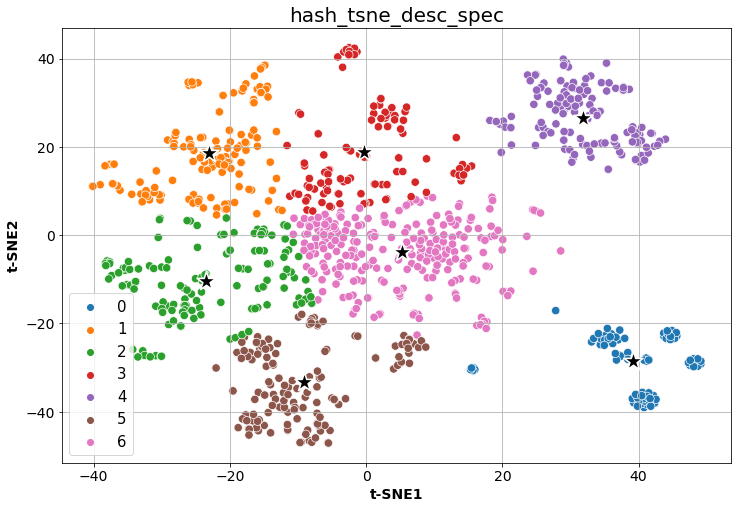

In [204]:
display_clusters_tsne(tsne_results_6, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
6    263
1    153
2    148
4    143
5    143
3    119
0     81
Name: cluster, dtype: int64


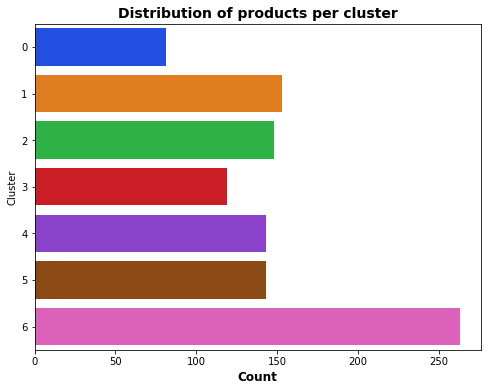

In [205]:
cluster_distribution(hashvect_tsne_desc_spec)

#### Cluster metrics

In [206]:
# tSNE + HashingVectorizer on "description + product specifications" 
results_hashvect_tsne_desc_spec = metrics_clusters(hashvect_tsne_desc_spec, data_type)
results1_6 = results1_5.append(results_hashvect_tsne_desc_spec, ignore_index=True)
results1_6

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


Clustering after t-SNE HashingVectorizer return almost the same metrics as t-SNE CountVectorizer.

#### 6.1.7 t-SNE - Tf-idf Vectorizer - "description" section

In [207]:
data_type = 'tfidf_tsne_desc'

In [208]:
# Kmeans
tsne_tfidf_desc = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(tfidf_tsne_desc.iloc[:, :2])
 
tfidf_tsne_desc['cluster'] = tsne_tfidf_desc.labels_
cluster_labels = tsne_tfidf_desc.labels_
centres_reduced = tsne_tfidf_desc.cluster_centers_

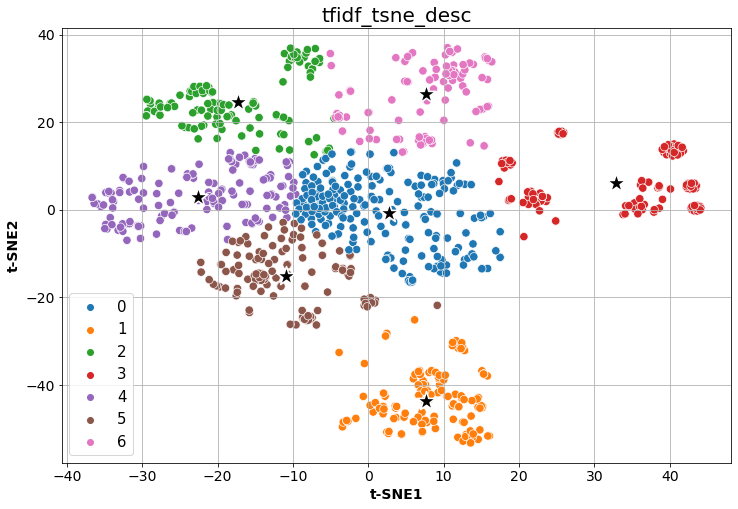

In [209]:
display_clusters_tsne(tsne_results_7, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    242
4    159
1    150
5    132
2    126
6    121
3    120
Name: cluster, dtype: int64


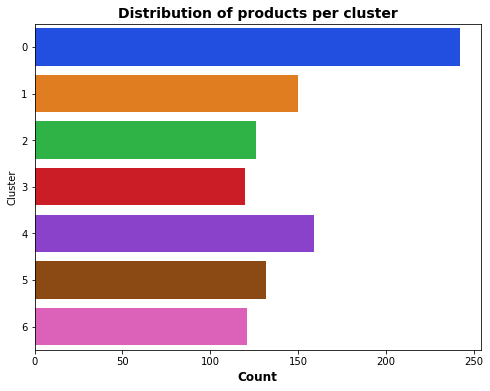

In [210]:
cluster_distribution(tfidf_tsne_desc)

In [211]:
# Categories into clusters
tfidf_tsne_desc.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Computers                        106
        Home Decor & Festive Needs        52
        Kitchen & Dining                  46
        Baby Care                         20
        Beauty and Personal Care          16
        Home Furnishing                    1
        Watches                            1
1       Watches                          147
        Home Decor & Festive Needs         3
2       Baby Care                         98
        Home Furnishing                   20
        Beauty and Personal Care           8
3       Kitchen & Dining                  74
        Computers                         44
        Baby Care                          1
        Home Decor & Festive Needs         1
4       Home Furnishing                  128
        Baby Care                         16
        Beauty and Personal Care          10
        Home Decor & Festive Needs         5
5       Home Decor & Festive Needs        89
        Kitchen & Dining                  30
        Baby Care                         10
        Watches                            2
        Beauty and Personal Care           1
6       Beauty and Personal Care         115
        Baby Care                          5
        Home Furnishing                    1

In [212]:
results_tfidf_tsne_desc = metrics_clusters(tfidf_tsne_desc, data_type)
results1_7 = results1_6.append(results_tfidf_tsne_desc, ignore_index=True)
results1_7

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for t-SNE + Tf_idf Vectorizer on "description"

* Cluster 0 contains too many products with mixed up categories. Cluster 1 represent very well the Watches category and cluster 4 gathers most of Home Furnishing products.


    - Cluster 0 : Computers (106/242)
    - Cluster 1 : Watches (147/150)
    - Cluster 2 : Baby Care (98/126)
    - Cluster 3 : Kitchen & Dining (74/120)
    - Cluster 4 : Home Furnishing (128/159)
    - Cluster 5 : Home Decor & Festive Needs (89/132)
    - Cluster 6 : Beauty and Personal Care (115/121)
    
    
- ARI score of 0.50

#### 6.1.8 t-SNE - Tf-idf Vectorizer - "product specifications" section

In [213]:
data_type = 'tfidf_tsne_prod_spec'

In [214]:
# Kmeans
tsne_tfidf_prod_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(tfidf_tsne_prod_spec.iloc[:, :2])
 
tfidf_tsne_prod_spec['cluster'] = tsne_tfidf_prod_spec.labels_
cluster_labels = tsne_tfidf_prod_spec.labels_
centres_reduced = tsne_tfidf_prod_spec.cluster_centers_

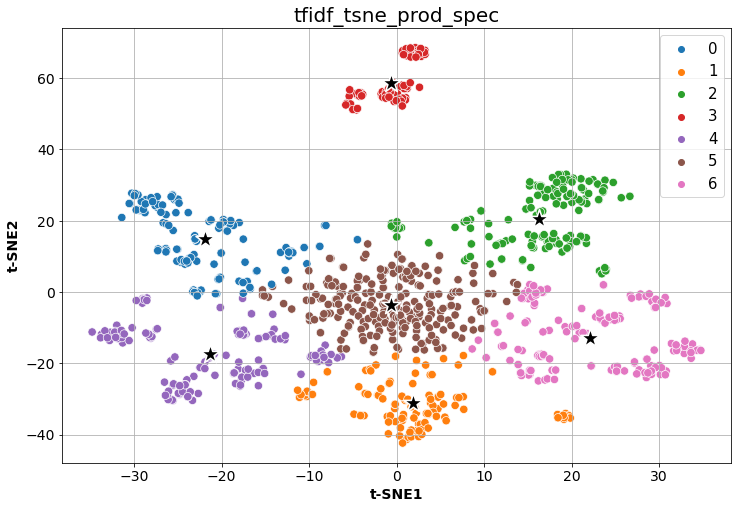

In [215]:
display_clusters_tsne(tsne_results_8, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
5    253
6    168
2    154
4    143
0    133
1    124
3     75
Name: cluster, dtype: int64


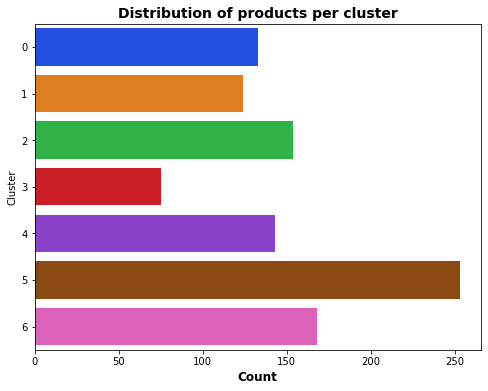

In [216]:
cluster_distribution(tfidf_tsne_prod_spec)

In [217]:
# Categories into clusters
tfidf_tsne_prod_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Beauty and Personal Care         113
        Kitchen & Dining                  13
        Baby Care                          4
        Home Decor & Festive Needs         2
        Computers                          1
1       Baby Care                         90
        Home Furnishing                   18
        Computers                         15
        Home Decor & Festive Needs         1
2       Watches                          135
        Kitchen & Dining                  18
        Home Decor & Festive Needs         1
3       Kitchen & Dining                  74
        Baby Care                          1
4       Home Furnishing                  110
        Baby Care                         23
        Beauty and Personal Care          10
5       Home Decor & Festive Needs       127
        Baby Care                         32
        Beauty and Personal Care          26
        Home Furnishing                   22
        Kitchen & Dining                  17
        Watches                           15
        Computers                         14
6       Computers                        120
        Kitchen & Dining                  28
        Home Decor & Festive Needs        19
        Beauty and Personal Care           1

In [218]:
# tSNE + Tf-idf Vectorizer on "product_specifications" 
results_tfidf_tsne_prod_spec = metrics_clusters(tfidf_tsne_prod_spec, data_type)
results1_8 = results1_7.append(results_tfidf_tsne_prod_spec, ignore_index=True)
results1_8

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for ¨tSNE + Tf_idf Vectorizer on "product specifications"

    - Cluster 0 : Beauty & Personal Care (113/133)
    - Cluster 1 : Baby Care (90/124)
    - Cluster 2 : Watches (135/154)
    - Cluster 3 : Kitchen & Dining (74/75)
    - Cluster 4 : Home furnishing (110/143)
    - Cluster 5 : Home Decor & Festive Needs (127/253)
    - Cluster 6 : Computers (120/168)
    
    
- ARI score of 0.48

#### 6.1.9 t-SNE - Tf-idf Vectorizer - "description + product specifications" section

In [219]:
data_type = 'tfidf_tsne_desc_spec'

In [220]:
# Kmeans
tsne_tfidf_desc_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(tfidf_tsne_desc_spec.iloc[:, :2])
 
tfidf_tsne_desc_spec['cluster'] = tsne_tfidf_desc_spec.labels_
cluster_labels = tsne_tfidf_desc_spec.labels_
centres_reduced = tsne_tfidf_desc_spec.cluster_centers_

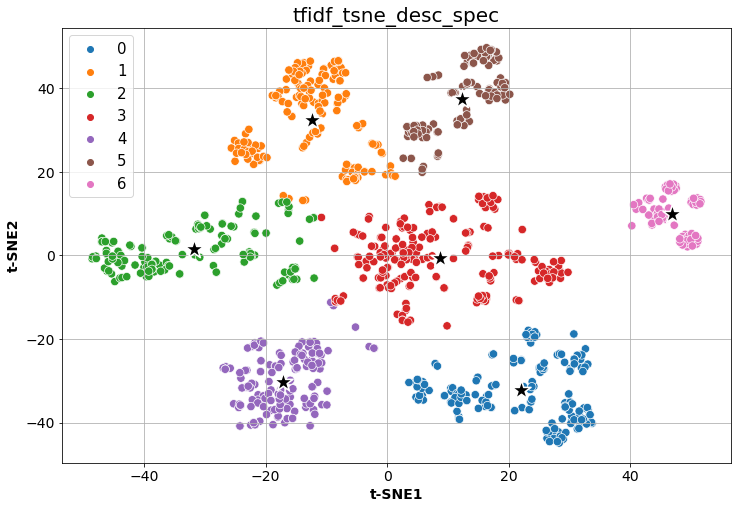

In [221]:
display_clusters_tsne(tsne_results_9, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
3    210
0    176
1    169
2    155
4    155
5    109
6     76
Name: cluster, dtype: int64


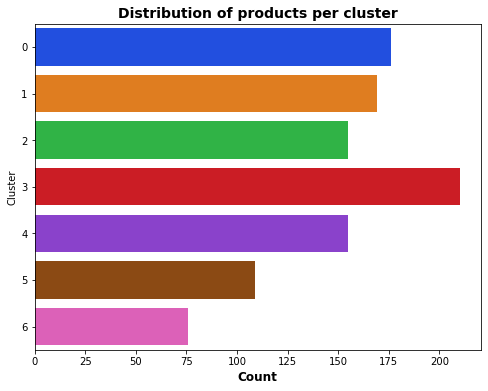

In [222]:
cluster_distribution(tfidf_tsne_desc_spec)

In [223]:
# Categories into clusters
tfidf_tsne_desc_spec.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Computers                        148
        Home Decor & Festive Needs        15
        Kitchen & Dining                   7
        Beauty and Personal Care           4
        Baby Care                          1
        Watches                            1
1       Baby Care                        109
        Home Furnishing                   56
        Beauty and Personal Care           3
        Computers                          1
2       Beauty and Personal Care         132
        Kitchen & Dining                  14
        Baby Care                          7
        Home Decor & Festive Needs         2
3       Home Decor & Festive Needs       126
        Kitchen & Dining                  55
        Baby Care                         19
        Beauty and Personal Care           9
        Home Furnishing                    1
4       Watches                          149
        Home Decor & Festive Needs         3
        Beauty and Personal Care           2
        Computers                          1
5       Home Furnishing                   93
        Baby Care                         13
        Home Decor & Festive Needs         3
6       Kitchen & Dining                  74
        Baby Care                          1
        Home Decor & Festive Needs         1

In [224]:
# tSNE + Tf-idf Vectorizer on "description + product_specifications" 
results_tfidf_tsne_desc_spec = metrics_clusters(tfidf_tsne_desc_spec, data_type)
results1_9 = results1_8.append(results_tfidf_tsne_desc_spec, ignore_index=True)
results1_9

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for ¨tSNE + Tf_idf Vectorizer on "description + product specifications"

We can see here a much better distribution of the clusters overall. The relatively high ARI score reflects it.
Even though cluster 3 contains 210 products and cluster 6 76 products, the other clusters tend to get closer to 150 products. Computers, Watches, Beauty & Personal Care are reasonnably well represented in clusters 0, 4 & 2 respectively.

    - Cluster 0 : Computers (148/176)
    - Cluster 1 : Baby Care (109/169)
    - Cluster 2 : Beauty & Personal Care (132/155)
    - Cluster 3 : Home Decor & Festive Needs (126/210)
    - Cluster 4 : Watches (149/155)
    - Cluster 5 : Home furnishing (93/109)
    - Cluster 6 : Kitchen & Dining (74/76)
    
        
- ARI score of 0.62 with a completness of 0.70.

This combination of t-SNE/Tf-idf Vectorizer on "description + product specifications" returns the best ARI score so far.

## 7. Topic Modeling

### 7.1 Latent Dirichlet Allocation (LDA)

We describe latent Dirichlet allocation (LDA) as a generative probabilistic model for collections of
discrete data such as text corpora. LDA is a three-level hierarchical Bayesian model, in which each
item of a collection is modeled as a finite mixture over an underlying set of topics. Each topic is, in
turn, modeled as an infinite mixture over an underlying set of topic probabilities. In the context of
text modeling, the topic probabilities provide an explicit representation of a document.

<img src="https://miro.medium.com/max/638/0*Sj65xR38wDwuxhtr.jpg" alt="image info" />

In [225]:
topics_name = ["Topic" + str(i) for i in range(7)]

#### 7.1.1 LDA: CountVectorizer on "description" section

In [226]:
data_type = 'cv_lda_desc'

In [227]:
# Model initialisation
lda_cv_desc = LatentDirichletAllocation(n_components=7,
                                          max_iter=10,
                                          learning_method='online',
                                          learning_offset=50,
                                          random_state=42,
                                          n_jobs=-1)
# Model training
lda_cv_desc.fit(X_cv_desc)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          n_components=7, n_jobs=-1, random_state=42)

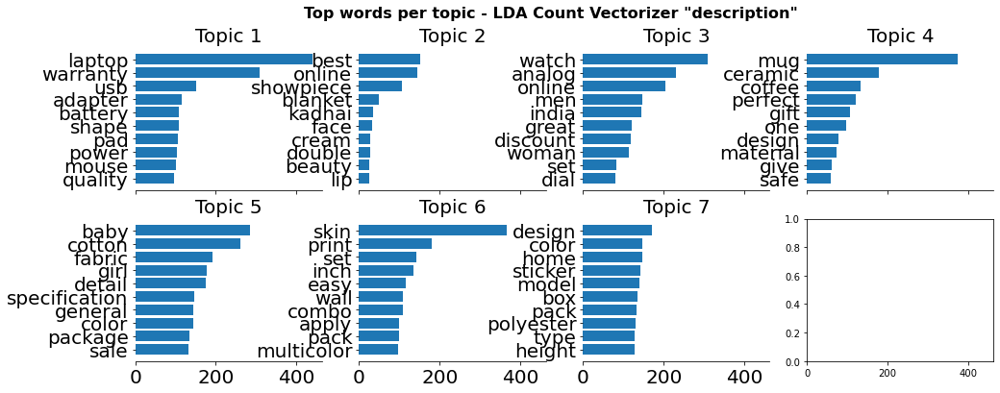

In [228]:
# Most frequent words appearing in the different topics
n_top_words = 10
lda_cv_desc_feature_names = cv_desc.get_feature_names()

top_words_display(lda_cv_desc, lda_cv_desc_feature_names,
                  n_top_words,
                  'Top words per topic - LDA Count Vectorizer "description"')

In [229]:
# Descriptions
lda_cv_desc_top = lda_cv_desc.transform(X_cv_desc)

# Dataframe creation
df_topics = pd.DataFrame(lda_cv_desc_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Computers                         94
       Beauty and Personal Care           3
       Kitchen & Dining                   2
       Baby Care                          1
       Home Decor & Festive Needs         1
       Watches                            1
1      Home Decor & Festive Needs        54
       Computers                         39
       Beauty and Personal Care          37
       Kitchen & Dining                  21
       Home Furnishing                   20
       Baby Care                          8
2      Watches                          147
       Beauty and Personal Care          68
       Kitchen & Dining                   7
       Baby Care                          6
       Home Decor & Festive Needs         3
       Computers                          2
3      Kitchen & Dining                  73
       Computers                          3
       Baby Care                          1
4      Baby Care                        105
       Home Furnishing                   50
       Kitchen & Dining                   5
       Home Decor & Festive Needs         3
       Beauty and Personal Care           1
       Watches                            1
5      Kitchen & Dining                  35
       Beauty and Personal Care          15
       Computers                         10
       Baby Care                          9
       Home Decor & Festive Needs         8
       Watches                            1
6      Home Decor & Festive Needs        81
       Home Furnishing                   80
       Beauty and Personal Care          26
       Baby Care                         20
       Kitchen & Dining                   7
       Computers                          2

<AxesSubplot:xlabel='row_0'>

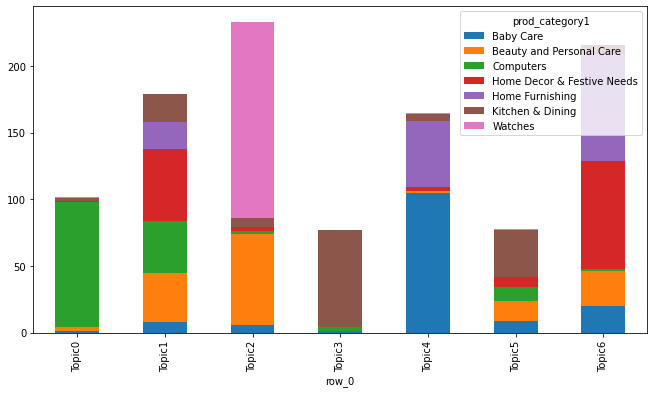

In [230]:
lda_topic = pd.DataFrame(lda_cv_desc.transform(X_cv_desc),
                             columns=topics_name)
lda_best_topic = lda_topic.idxmax(axis=1)
pd.crosstab(lda_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [231]:
results_lda_desc = metrics_clusters_lda(df_topics, data_type)
results2_1 = results1_9.append(results_lda_desc, ignore_index=True)
results2_1

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for LDA + CountVectorizer on "description"

* 5 topics are found but the number of products in each topic is quite inequal. Topic 2 & 6 contain more than 200 products each. Results are the following:


    - Cluster 0 : Computers (94/102)
    - Cluster 1 : Home Decor & Festive Needs (54/179)
    - Cluster 2 : Watches (147/233)
    - Cluster 3 : Kitchen & Dining (73/77)
    - Cluster 4 : Baby Care (105/165)
    - Cluster 5 : Kitchen & Dining (35/78)
    - Cluster 6 : Home decor & Festive Needs (81/216)
    

- Home Furnishing & Beauty and Personal Care do not fall into any separate cluster.
    
- ARI score of 0.35

#### 7.1.2 LDA: CountVectorizer on "product specifications" section

In [232]:
data_type = 'cv_lda_prod_spec'

In [233]:
# Instanciation du modèle
lda_cv_spec = LatentDirichletAllocation(n_components=7,
                                          max_iter=10,
                                          learning_method='online',
                                          learning_offset=50,
                                          random_state=42,
                                          n_jobs=-1)
# Entraînement du modèle
lda_cv_spec.fit(X_cv_spec)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          n_components=7, n_jobs=-1, random_state=42)

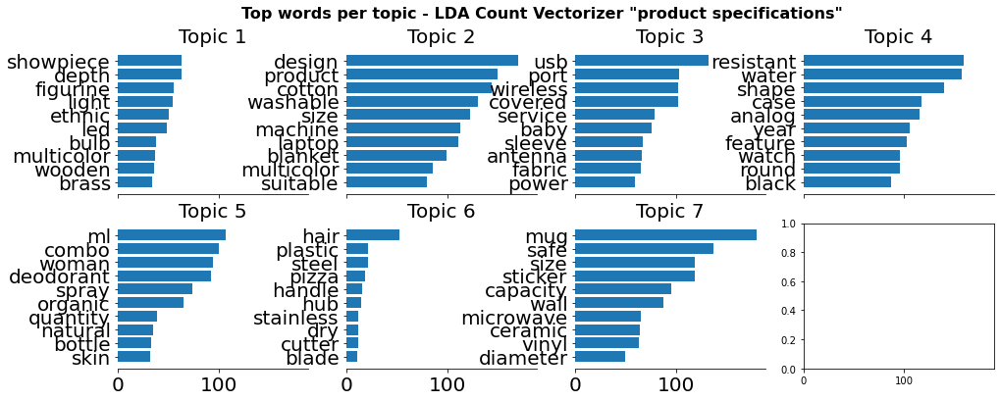

In [234]:
# Most frequent words appearing in the different topics
n_top_words = 10
lda_cv_spec_feature_names = cv_spec.get_feature_names()

top_words_display(lda_cv_spec, lda_cv_spec_feature_names,
                  n_top_words,
                  'Top words per topic - LDA Count Vectorizer "product specifications"')

In [235]:
# Descriptions
lda_cv_spec_top = lda_cv_spec.transform(X_cv_spec)

# Dataframe creation
df_topics = pd.DataFrame(lda_cv_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Home Decor & Festive Needs       126
       Computers                         21
       Beauty and Personal Care          12
       Kitchen & Dining                  11
       Baby Care                          6
       Watches                            5
       Home Furnishing                    1
1      Home Furnishing                  141
       Baby Care                         48
       Computers                         46
       Home Decor & Festive Needs         8
       Beauty and Personal Care           4
       Kitchen & Dining                   1
2      Computers                         76
       Baby Care                         67
       Beauty and Personal Care           3
       Kitchen & Dining                   1
3      Watches                          145
       Baby Care                          9
       Home Furnishing                    6
       Home Decor & Festive Needs         5
       Kitchen & Dining                   4
       Beauty and Personal Care           1
       Computers                          1
4      Beauty and Personal Care         123
       Kitchen & Dining                   9
       Baby Care                          4
       Home Decor & Festive Needs         1
5      Kitchen & Dining                  14
       Beauty and Personal Care           6
       Computers                          6
       Baby Care                          2
6      Kitchen & Dining                 110
       Baby Care                         14
       Home Decor & Festive Needs        10
       Home Furnishing                    2
       Beauty and Personal Care           1

<AxesSubplot:xlabel='row_0'>

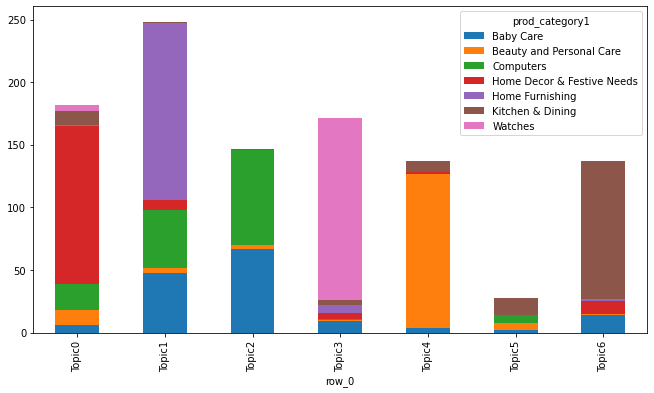

In [236]:
lda_topic_spec = pd.DataFrame(lda_cv_spec.transform(X_cv_spec),
                             columns=topics_name)
lda_best_topic = lda_topic_spec.idxmax(axis=1)
pd.crosstab(lda_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [237]:
results_lda_spec = metrics_clusters_lda(df_topics, data_type)
results2_2 = results2_1.append(results_lda_spec, ignore_index=True)
results2_2

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for LDA + CountVectorizer on "product specifications"

* 6 clusters are found but the distribution of the products in each cluster is quite poor. Cluster 1 contains too many products while cluster 5 contains only 28 products. Categoriy Baby Care is not represented while Kitchen & Dining represents 2 clusters.


    - Cluster 0 : Home Decor & Festive Needs (126/182)
    - Cluster 1 : Home Furnishing (141/248)
    - Cluster 2 : Computers (76/147)
    - Cluster 3 : Watches (145/171)
    - Cluster 4 : Beauty and Personal Care (123/137)
    - Cluster 5 : Kitchen & Dining (14/28)
    - Cluster 6 : Kitchen & Dining (110/137)

    
- ARI score of 0.51

#### 7.1.3 LDA: CountVectorizer on "description + product specifications" section

In [238]:
data_type = 'cv_lda_desc_spec'

In [239]:
# Instanciation du modèle
lda_cv_desc_spec = LatentDirichletAllocation(n_components=7,
                                          max_iter=10,
                                          learning_method='online',
                                          learning_offset=50,
                                          random_state=42,
                                          n_jobs=-1)
# Entraînement du modèle
lda_cv_desc_spec.fit(X_cv_desc_spec)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          n_components=7, n_jobs=-1, random_state=42)

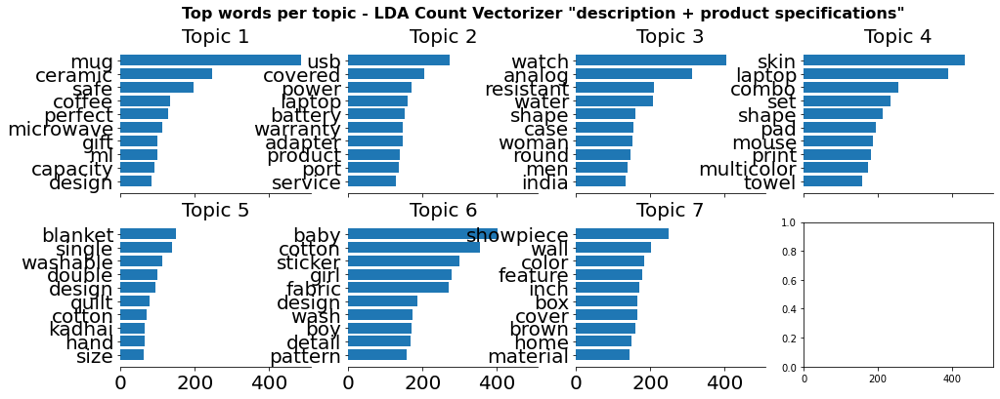

In [240]:
# Most frequent words appearing in the different topics
n_top_words = 10
lda_cv_desc_spec_feature_names = cv_desc_spec.get_feature_names()

top_words_display(lda_cv_desc_spec, lda_cv_desc_spec_feature_names,
                  n_top_words,
                  'Top words per topic - LDA Count Vectorizer "description + product specifications"')

In [241]:
# Descriptions
lda_cv_desc_spec_top = lda_cv_desc_spec.transform(X_cv_desc_spec)

# Dataframe creation
df_topics = pd.DataFrame(lda_cv_desc_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Kitchen & Dining                  75
       Baby Care                          1
1      Computers                        129
       Kitchen & Dining                  14
       Beauty and Personal Care           3
       Home Decor & Festive Needs         2
2      Watches                          150
       Home Decor & Festive Needs         2
       Kitchen & Dining                   2
       Computers                          1
3      Beauty and Personal Care         120
       Computers                         18
       Home Furnishing                   13
       Baby Care                         10
       Kitchen & Dining                  10
       Home Decor & Festive Needs         9
4      Home Furnishing                   58
       Kitchen & Dining                  27
       Baby Care                         11
       Beauty and Personal Care          10
       Home Decor & Festive Needs         3
5      Baby Care                        114
       Home Furnishing                   38
       Home Decor & Festive Needs         4
       Beauty and Personal Care           1
6      Home Decor & Festive Needs       130
       Home Furnishing                   41
       Kitchen & Dining                  22
       Beauty and Personal Care          16
       Baby Care                         14
       Computers                          2

<AxesSubplot:xlabel='row_0'>

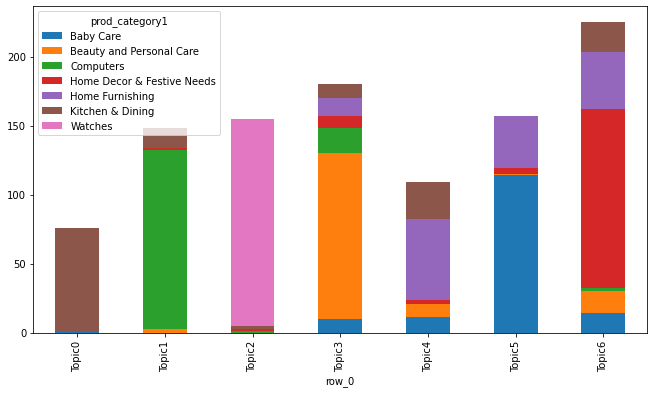

In [242]:
lda_topic_desc_spec = pd.DataFrame(lda_cv_desc_spec.transform(X_cv_desc_spec),
                             columns=topics_name)
lda_best_topic = lda_topic_desc_spec.idxmax(axis=1)
pd.crosstab(lda_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [243]:
results_lda_desc_spec = metrics_clusters_lda(df_topics, data_type)
results2_3 = results2_2.append(results_lda_desc_spec, ignore_index=True)
results2_3

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for LDA + CountVectorizer on "description + product specifications"


    - Cluster 0 : Kitchen & Dining (75/76)
    - Cluster 1 : Computers (129/148)
    - Cluster 2 : Watches (150/155)
    - Cluster 3 : Beauty and Personal Care (120/180)
    - Cluster 4 : Home Furnishing (58/109)
    - Cluster 5 : Baby Care (114/157)
    - Cluster 6 : Home Decor & Festive Needs (130/225)
    
    
- ARI score of 0.53

### 7.2 Negative Matrix Factorization (NMF)

Non-Negative Matrix Factorization is a state of the art feature extraction algorithm. NMF is useful when there are many attributes and the attributes are ambiguous or have weak predictability. By combining attributes, NMF can produce meaningful patterns, topics, or themes.

Each feature created by NMF is a linear combination of the original attribute set. Each feature has a set of coefficients, which are a measure of the weight of each attribute on the feature. There is a separate coefficient for each numerical attribute and for each distinct value of each categorical attribute. The coefficients are all non-negative.

Non-Negative Matrix Factorization uses techniques from multivariate analysis and linear algebra. It decomposes the data as a matrix M into the product of two lower ranking matrices W and H. The sub-matrix W contains the NMF basis; the sub-matrix H contains the associated coefficients (weights).

The algorithm iteratively modifies of the values of W and H so that their product approaches M. The technique preserves much of the structure of the original data and guarantees that both basis and weights are non-negative. The algorithm terminates when the approximation error converges or a specified number of iterations is reached.

<img src="https://miro.medium.com/max/875/1*Cdk8UXkHqkLxfPEFTNEU4A.jpeg" alt="image info" />

#### 7.2.1 NMF: CountVectorizer on "description" section

In [244]:
data_type = 'nmf_cv_desc'

In [245]:
# Model initialisation
nmf_cv_desc = NMF(n_components=7,
               random_state=42,
               l1_ratio=0.5,  # The regularization mixing parameter, 
                              # with 0 <= l1_ratio <= 1. 
                              # For l1_ratio = 0 the penalty is an elementwise
                              # L2 penalty (aka Frobenius Norm). 
                              # For l1_ratio = 1 it is an elementwise L1 penalty. 
                              # For 0 < l1_ratio < 1, the penalty is a combination of L1 and L2.
               init='nndsvd', # Nonnegative Double Singular Value 
                              # Decomposition (NNDSVD) initialization
                              #(better for sparseness)
               solver='mu')   # mu is a Multiplicative Update solver

# Model training
nmf_cv_desc.fit(X_cv_desc)

NMF(init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42, solver='mu')

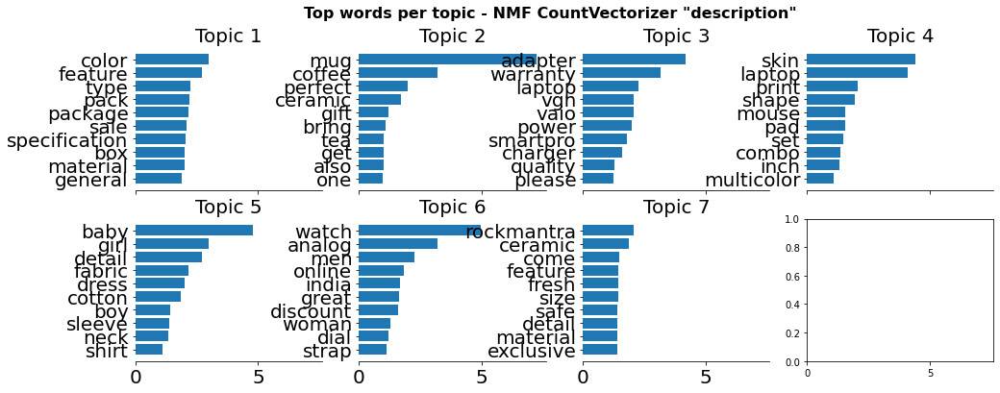

In [246]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_cv_desc_feature_names = cv_desc.get_feature_names()

top_words_display(nmf_cv_desc, nmf_cv_desc_feature_names,
                  n_top_words,
                  'Top words per topic - NMF CountVectorizer "description"')

In [247]:
# Descriptions
nmf_cv_desc_top = nmf_cv_desc.transform(X_cv_desc)

# Dataframe creation
df_topics = pd.DataFrame(nmf_cv_desc_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Home Furnishing                  126
       Home Decor & Festive Needs        71
       Computers                         60
       Beauty and Personal Care          41
       Kitchen & Dining                  33
       Baby Care                         26
       Watches                            1
1      Kitchen & Dining                  53
       Baby Care                          2
       Computers                          2
       Home Decor & Festive Needs         1
2      Computers                         32
       Beauty and Personal Care           4
       Home Decor & Festive Needs         2
       Kitchen & Dining                   2
3      Beauty and Personal Care          86
       Computers                         34
       Home Furnishing                    8
       Home Decor & Festive Needs         7
       Baby Care                          5
       Kitchen & Dining                   4
4      Baby Care                        100
       Home Furnishing                   14
5      Watches                          149
       Home Decor & Festive Needs        63
       Kitchen & Dining                  32
       Computers                         22
       Baby Care                         17
       Beauty and Personal Care          17
       Home Furnishing                    1
6      Kitchen & Dining                  26
       Home Decor & Festive Needs         6
       Beauty and Personal Care           2
       Home Furnishing                    1

<AxesSubplot:xlabel='row_0'>

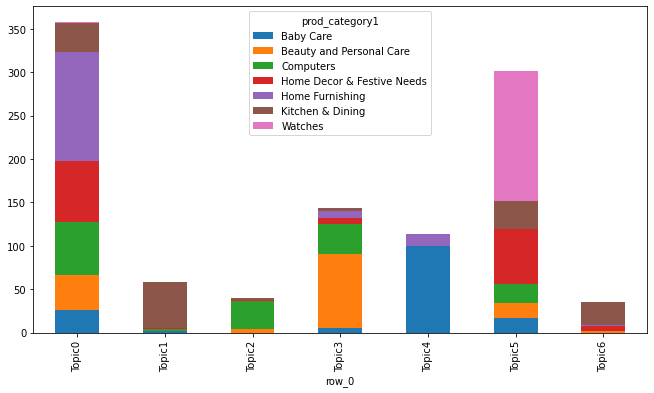

In [248]:
nmf_cv_topic_desc = pd.DataFrame(nmf_cv_desc.transform(X_cv_desc),
                             columns=topics_name)
nmf_best_topic = nmf_cv_topic_desc.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [249]:
results_nmf_cv_desc = metrics_clusters_lda(df_topics, data_type)
results3_1 = results2_3.append(results_nmf_cv_desc, ignore_index=True)
results3_1

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for ¨NMF + CountVectorizer on "description"

    - Cluster 0 : Home Furnishing (126/358)
    - Cluster 1 : Kitchen & Dining (53/58)
    - Cluster 2 : Computers (32/40)
    - Cluster 3 : Beauty & personal care (86/144)
    - Cluster 4 : Baby Care (100/114)   
    - Cluster 5 : Watches (149/301)
    - Cluster 6 : Kitchen & Dining (26/35)
    
    
- ARI score of 0.25

#### 7.2.2 NMF: CountVectorizer on "product specifications" section

In [250]:
data_type = 'nmf_cv_spec'

In [251]:
# Model initialisation
nmf_cv_spec = NMF(n_components=7,
               random_state=42,
               alpha=0.1,
               l1_ratio=0.5,
               init='nndsvd',
               solver='mu')

# Model training
nmf_cv_spec.fit(X_cv_spec)

NMF(alpha=0.1, init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42,
    solver='mu')

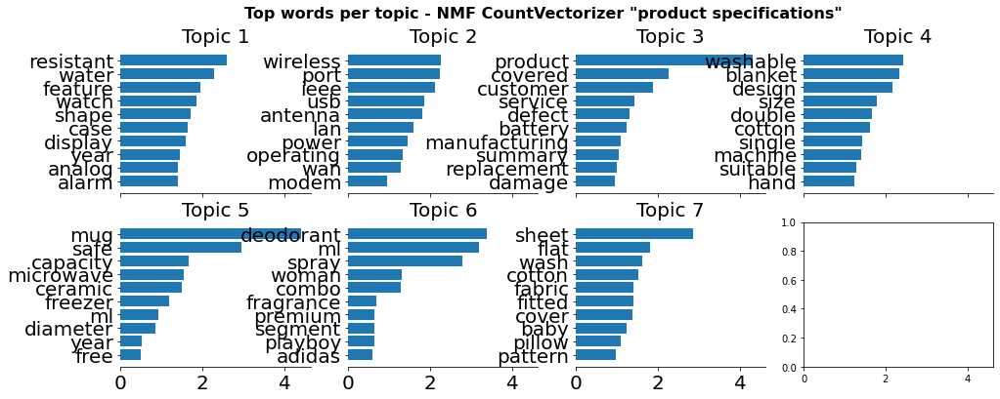

In [252]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_cv_spec_feature_names = cv_spec.get_feature_names()

top_words_display(nmf_cv_spec, nmf_cv_spec_feature_names,
                  n_top_words,
                  'Top words per topic - NMF CountVectorizer "product specifications"')

In [253]:
# Descriptions
nmf_cv_spec_top = nmf_cv_spec.transform(X_cv_spec)

# Dataframe creation
df_topics = pd.DataFrame(nmf_cv_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Watches                          150
       Home Decor & Festive Needs        58
       Kitchen & Dining                  13
       Computers                          9
       Beauty and Personal Care           8
       Baby Care                          3
       Home Furnishing                    2
1      Computers                         81
       Kitchen & Dining                   5
       Home Decor & Festive Needs         4
2      Computers                         59
       Home Decor & Festive Needs        17
       Baby Care                          6
       Kitchen & Dining                   6
       Beauty and Personal Care           3
       Home Furnishing                    3
3      Home Furnishing                  108
       Home Decor & Festive Needs        45
       Baby Care                         39
       Beauty and Personal Care           6
       Kitchen & Dining                   2
4      Kitchen & Dining                 109
       Home Decor & Festive Needs         7
       Baby Care                          4
       Home Furnishing                    2
5      Beauty and Personal Care         123
       Kitchen & Dining                  14
       Baby Care                          3
       Home Decor & Festive Needs         2
6      Baby Care                         95
       Home Furnishing                   35
       Home Decor & Festive Needs        17
       Beauty and Personal Care          10
       Computers                          1
       Kitchen & Dining                   1

<AxesSubplot:xlabel='row_0'>

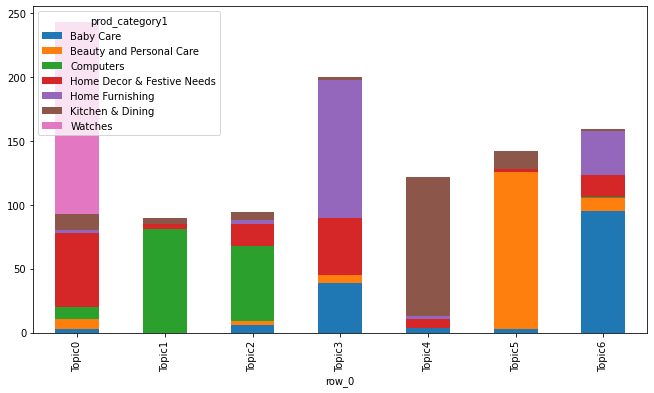

In [254]:
nmf_cv_topic_spec = pd.DataFrame(nmf_cv_spec.transform(X_cv_spec),
                             columns=topics_name)
nmf_best_topic = nmf_cv_topic_spec.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [255]:
results_nmf_cv_spec = metrics_clusters_lda(df_topics, data_type)
results3_2 = results3_1.append(results_nmf_cv_spec, ignore_index=True)
results3_2

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 7.2.2 NMF: CountVectorizer on "description + product specifications" section

In [256]:
data_type = 'nmf_cv_desc_spec'

In [257]:
# Model initialisation
nmf_cv_desc_spec = NMF(n_components=7,
               random_state=42,
               alpha=0.1,
               l1_ratio=0.5,
               init='nndsvd',
               solver='mu')

# Model training
nmf_cv_desc_spec.fit(X_cv_desc_spec)

NMF(alpha=0.1, init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42,
    solver='mu')

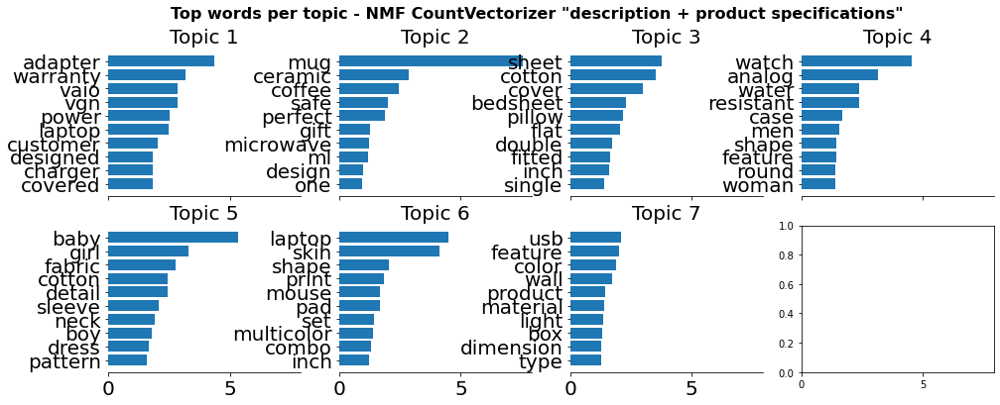

In [258]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_cv_desc_spec_feature_names = cv_desc_spec.get_feature_names()

top_words_display(nmf_cv_desc_spec, nmf_cv_desc_spec_feature_names,
                  n_top_words,
                  'Top words per topic - NMF CountVectorizer "description + product specifications"')

In [259]:
# Descriptions
nmf_cv_desc_spec_top = nmf_cv_desc_spec.transform(X_cv_desc_spec)

# Dataframe creation
df_topics = pd.DataFrame(nmf_cv_desc_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Computers                         36
       Beauty and Personal Care           2
       Home Decor & Festive Needs         1
1      Kitchen & Dining                  75
       Baby Care                          1
       Home Decor & Festive Needs         1
2      Home Furnishing                  116
       Baby Care                         19
       Beauty and Personal Care           5
       Home Decor & Festive Needs         3
3      Watches                          149
       Home Decor & Festive Needs        19
       Beauty and Personal Care          13
       Kitchen & Dining                   6
       Computers                          1
4      Baby Care                        102
       Home Furnishing                    3
5      Beauty and Personal Care          98
       Computers                         12
       Home Decor & Festive Needs         6
       Baby Care                          3
       Home Furnishing                    1
6      Home Decor & Festive Needs       120
       Computers                        101
       Kitchen & Dining                  69
       Beauty and Personal Care          32
       Home Furnishing                   30
       Baby Care                         25
       Watches                            1

<AxesSubplot:xlabel='row_0'>

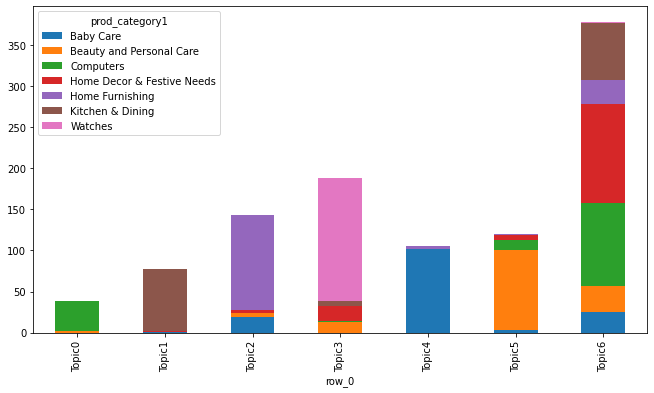

In [260]:
nmf_cv_topic_desc_spec = pd.DataFrame(nmf_cv_desc_spec.transform(X_cv_desc_spec),
                             columns=topics_name)
nmf_best_topic = nmf_cv_topic_desc_spec.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [261]:
results_nmf_cv_desc_spec = metrics_clusters_lda(df_topics, data_type)
results3_3 = results3_2.append(results_nmf_cv_desc_spec, ignore_index=True)
results3_3

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 7.2.4 NMF: Tf-idf on "description" section

In [262]:
data_type = 'nmf_tfidf_desc'

In [263]:
# Model initialisation
nmf_desc = NMF(n_components=7,
               random_state=42,
               alpha=0.1,
               l1_ratio=0.5,
               init='nndsvd',
               solver='mu')

# Model training
nmf_desc.fit(X_tfidf_desc)

NMF(alpha=0.1, init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42,
    solver='mu')

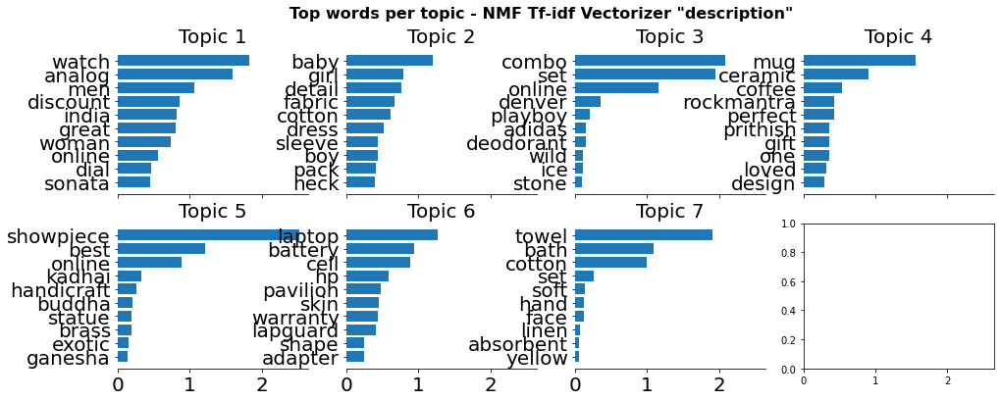

In [264]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_tfidf_desc_feature_names = tfidf_desc.get_feature_names()

top_words_display(nmf_desc, nmf_tfidf_desc_feature_names,
                  n_top_words,
                  'Top words per topic - NMF Tf-idf Vectorizer "description"')

In [265]:
# Descriptions
nmf_tfidf_desc_top = nmf_desc.transform(X_tfidf_desc)

# Dataframe creation
df_topics = pd.DataFrame(nmf_tfidf_desc_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Watches                          149
       Computers                         21
       Kitchen & Dining                   6
       Beauty and Personal Care           5
       Home Decor & Festive Needs         3
       Home Furnishing                    2
       Baby Care                          1
1      Baby Care                        113
       Home Furnishing                   98
       Beauty and Personal Care          35
       Home Decor & Festive Needs        23
       Kitchen & Dining                  23
       Computers                          8
2      Beauty and Personal Care          80
       Kitchen & Dining                   6
       Baby Care                          5
       Home Decor & Festive Needs         4
       Home Furnishing                    3
       Computers                          1
3      Kitchen & Dining                  82
       Home Decor & Festive Needs         9
       Home Furnishing                    6
       Baby Care                          5
       Beauty and Personal Care           2
       Computers                          2
4      Home Decor & Festive Needs       105
       Kitchen & Dining                  30
       Computers                         18
       Baby Care                         14
       Beauty and Personal Care          14
       Home Furnishing                    1
5      Computers                        100
       Home Furnishing                   15
       Beauty and Personal Care          13
       Home Decor & Festive Needs         6
       Kitchen & Dining                   3
       Watches                            1
6      Home Furnishing                   25
       Baby Care                         12
       Beauty and Personal Care           1

<AxesSubplot:xlabel='row_0'>

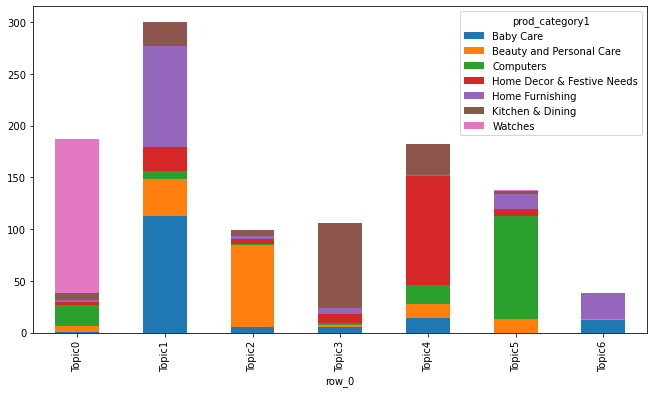

In [266]:
nmf_tfidf_topic_desc = pd.DataFrame(nmf_desc.transform(X_tfidf_desc),
                             columns=topics_name)
nmf_best_topic = nmf_tfidf_topic_desc.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [267]:
results_nmf_desc = metrics_clusters_lda(df_topics, data_type)
results3_4 = results3_3.append(results_nmf_desc, ignore_index=True)
results3_4

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 7.2.5 NMF: Tf-idf on "product specifications" section

In [268]:
data_type = 'nmf_tfidf_prod_spec'

In [269]:
# Model initialisation
nmf_spec = NMF(n_components=7,
               random_state=42,
               alpha=0.1,
               l1_ratio=0.5,
               init='nndsvd',
               solver='mu')

# Model training
nmf_spec.fit(X_tfidf_prod_spec)

NMF(alpha=0.1, init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42,
    solver='mu')

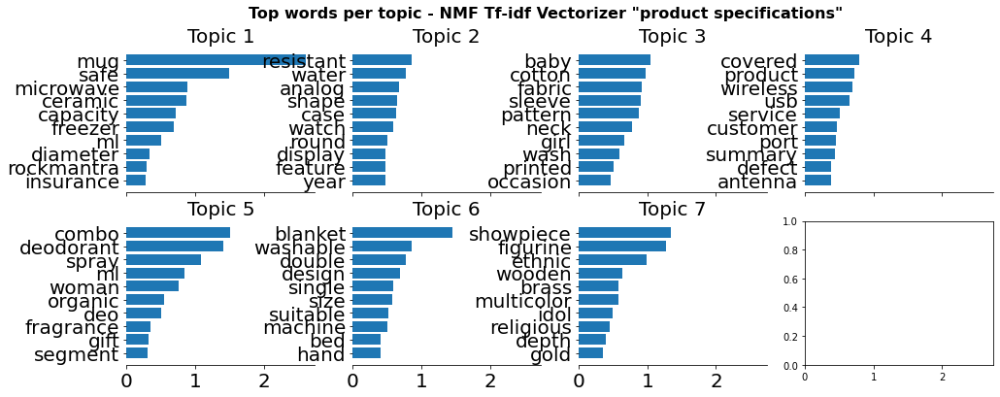

In [270]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_tfidf_spec_feature_names = tfidf_spec.get_feature_names()

top_words_display(nmf_spec, nmf_tfidf_spec_feature_names,
                  n_top_words,
                  'Top words per topic - NMF Tf-idf Vectorizer "product specifications"')

In [271]:
# Descriptions
nmf_tfidf_spec_top = nmf_spec.transform(X_tfidf_prod_spec)

# Dataframe creation
df_topics = pd.DataFrame(nmf_tfidf_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Kitchen & Dining                 103
       Watches                            5
       Baby Care                          3
       Computers                          3
       Home Decor & Festive Needs         3
       Beauty and Personal Care           2
1      Watches                          145
       Kitchen & Dining                  22
       Home Decor & Festive Needs         7
       Baby Care                          5
       Beauty and Personal Care           5
       Computers                          3
       Home Furnishing                    2
2      Baby Care                        114
       Home Furnishing                   34
       Beauty and Personal Care           6
       Home Decor & Festive Needs         2
       Computers                          1
3      Computers                        143
       Home Decor & Festive Needs        23
       Kitchen & Dining                  12
       Baby Care                          4
       Beauty and Personal Care           3
       Home Furnishing                    3
4      Beauty and Personal Care         128
       Kitchen & Dining                  10
       Baby Care                          1
       Home Decor & Festive Needs         1
5      Home Furnishing                  109
       Baby Care                         22
       Home Decor & Festive Needs        11
       Beauty and Personal Care           2
6      Home Decor & Festive Needs       103
       Beauty and Personal Care           4
       Kitchen & Dining                   3
       Home Furnishing                    2
       Baby Care                          1

<AxesSubplot:xlabel='row_0'>

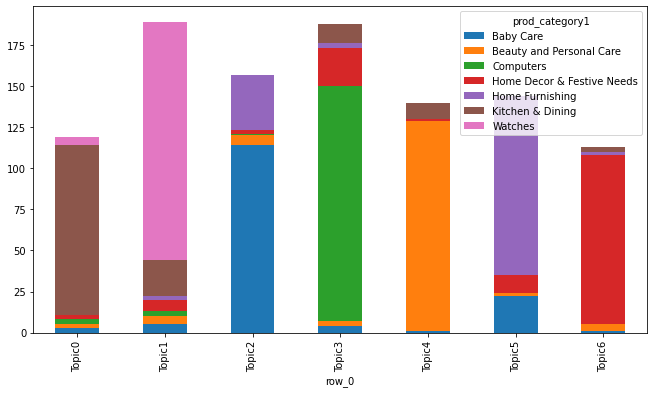

In [272]:
nmf_tfidf_topic_spec = pd.DataFrame(nmf_spec.transform(X_tfidf_prod_spec),
                             columns=topics_name)
nmf_best_topic = nmf_tfidf_topic_spec.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [273]:
results_nmf_spec = metrics_clusters_lda(df_topics, data_type)
results3_5 = results3_4.append(results_nmf_spec, ignore_index=True)
results3_5

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### Summary for ¨NMF + Tf_idf Vectorizer on "product specifications"

* We start seeing good improvements in the clusters separation at this point. We have our 7 categories with some mix up but the number of products in each cluster remain in the range of 115-185.


    - Cluster 0 : Kitchen & Dining (103/119)
    - Cluster 1 : Watches (145/189) 
    - Cluster 2 : Baby Care (114/157)
    - Cluster 3 : Computers (143/188)
    - Cluster 4 : Beauty and Personal Care (128/140)
    - Cluster 5 : Home furnishing (109/144)
    - Cluster 6 : Home Decor & Festive Needs (103/113)
    
- ARI score of 0.61

#### 7.2.6 NMF: Tf-idf on "description + product specifications" section

In [274]:
data_type = 'nmf_tfidf_desc_spec'

In [275]:
# Model initialisation
nmf_desc_spec = NMF(n_components=7,
               random_state=42,
               alpha=0.1,
               l1_ratio=0.5,
               init='nndsvd',
               solver='mu')

# Model training
nmf_desc_spec.fit(X_tfidf_desc_spec)

NMF(alpha=0.1, init='nndsvd', l1_ratio=0.5, n_components=7, random_state=42,
    solver='mu')

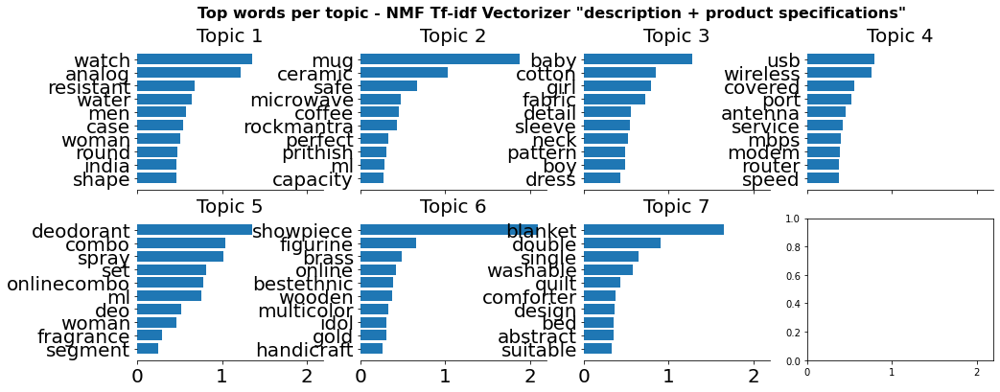

In [276]:
# Most frequent words appearing in the different topics
n_top_words = 10
nmf_tfidf_desc_spec_feature_names = tfidf_desc_spec.get_feature_names()

top_words_display(nmf_desc_spec, nmf_tfidf_desc_spec_feature_names,
                  n_top_words,
                  'Top words per topic - NMF Tf-idf Vectorizer "description + product specifications"')

In [277]:
# Descriptions
nmf_tfidf_desc_spec_top = nmf_desc_spec.transform(X_tfidf_desc_spec)

# Dataframe creation
df_topics = pd.DataFrame(nmf_tfidf_desc_spec_top, columns=topics_name)

df_topics['Topics'] = np.argmax(df_topics.values, axis=1)
df_topics['Category'] = data_cleaned['prod_category1']
# Topics
df_topics.groupby('Topics')['Category'].value_counts(). \
    to_frame()

Category
Topics Category                            
0      Watches                          150
       Kitchen & Dining                  23
       Baby Care                          8
       Beauty and Personal Care           6
       Home Decor & Festive Needs         3
       Computers                          2
1      Kitchen & Dining                  91
       Home Decor & Festive Needs         5
       Baby Care                          3
2      Baby Care                        122
       Home Furnishing                   88
       Beauty and Personal Care          22
       Home Decor & Festive Needs        16
       Kitchen & Dining                   6
       Computers                          1
3      Computers                        147
       Home Decor & Festive Needs        17
       Kitchen & Dining                  13
       Beauty and Personal Care           4
       Baby Care                          1
4      Beauty and Personal Care         112
       Kitchen & Dining                  16
       Home Decor & Festive Needs         1
5      Home Decor & Festive Needs       105
       Baby Care                          6
       Beauty and Personal Care           5
       Kitchen & Dining                   1
6      Home Furnishing                   62
       Baby Care                         10
       Home Decor & Festive Needs         3
       Beauty and Personal Care           1

<AxesSubplot:xlabel='row_0'>

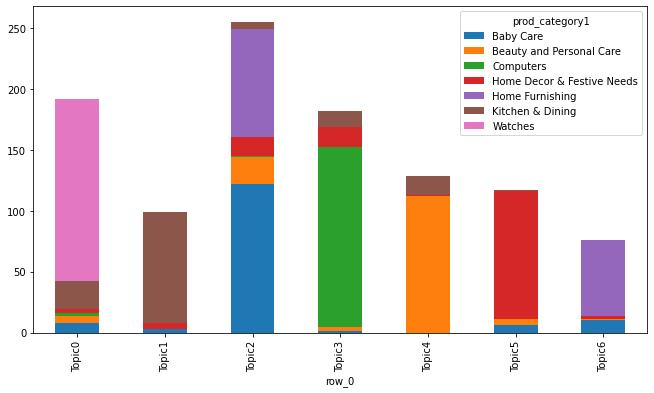

In [278]:
nmf_tfidf_topic_desc_spec = pd.DataFrame(nmf_desc_spec.transform(X_tfidf_desc_spec),
                             columns=topics_name)
nmf_best_topic = nmf_tfidf_topic_desc_spec.idxmax(axis=1)
pd.crosstab(nmf_best_topic, data_cleaned['prod_category1']).plot.bar(figsize=(11,6), stacked=True)

In [279]:
results_nmf_desc_spec = metrics_clusters_lda(df_topics, data_type)
results3_6 = results3_5.append(results_nmf_desc_spec, ignore_index=True)
results3_6

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


NMF/Tf-idf on the "product specifications" section reaches an ARI score of 0.61 which is quite similar to the ARI score reached by t-SNE/Tf-idf on the "description + product specifications" section. These 2 methods are the best observed so far.

## 8. Google's Universal Sentence Encoder

The Universal Sentence Encoder encodes text into high dimensional vectors that can be used for text classification, semantic similarity, clustering, and other natural language tasks.

### 8.1 Preprocessed data

In [280]:
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"

#### 8.1.1 "description" section

In [281]:
# Model loading
data_use_desc_model = hub.load(module_url)
print('Module %s loaded' % module_url)

INFO:absl:Using C:\Users\steph\AppData\Local\Temp\tfhub_modules to cache modules.


Module https://tfhub.dev/google/universal-sentence-encoder/4 loaded


In [282]:
data_use_desc = data_cleaned['description_clean']
data_use_desc_vect = data_use_desc_model(data_use_desc)

In [283]:
use_tsne_results = tsne.fit_transform(data_use_desc_vect)
    
use_tsne_desc = pd.concat([pd.DataFrame(use_tsne_results), data_cleaned['prod_category1']], axis=1)
use_tsne_desc = use_tsne_desc.rename(columns={'prod_category1':'Category'})

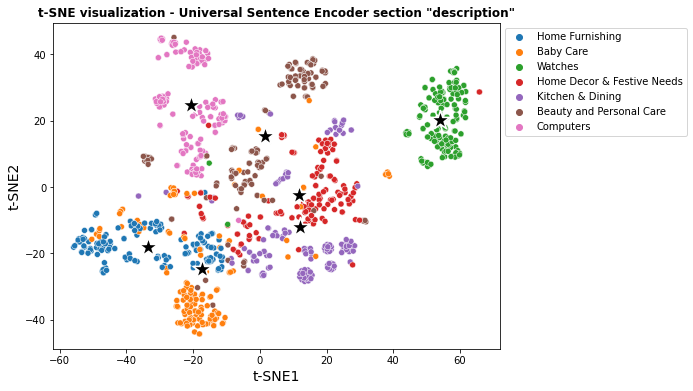

In [284]:
title = 't-SNE visualization - Universal Sentence Encoder section "description"'
tsne_visualisation(use_tsne_desc, title)

#### KMeans clustering after t-SNE

In [285]:
data_type = 'use_tsne_desc'

In [286]:
# Kmeans
tsne_use_desc = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(use_tsne_desc.iloc[:, :2])
 
use_tsne_desc['cluster'] = tsne_use_desc.labels_
cluster_labels = tsne_use_desc.labels_
centres_reduced = tsne_use_desc.cluster_centers_

#### 2D Visualization

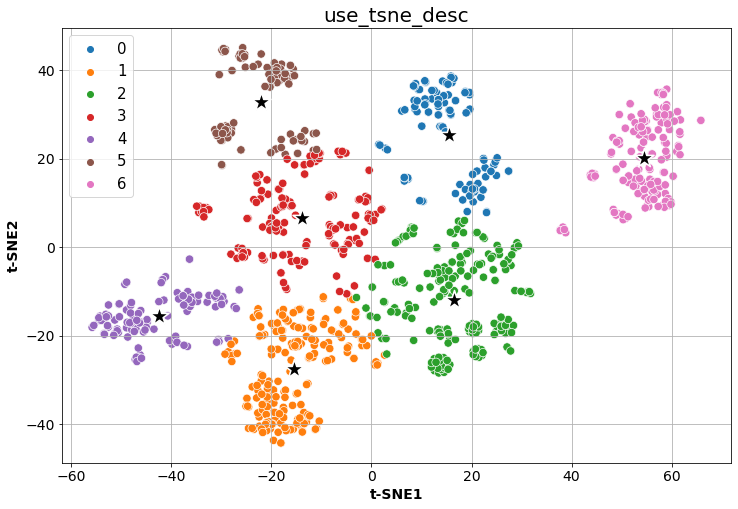

In [287]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
2    206
1    198
3    165
6    155
4    117
0    115
5     94
Name: cluster, dtype: int64


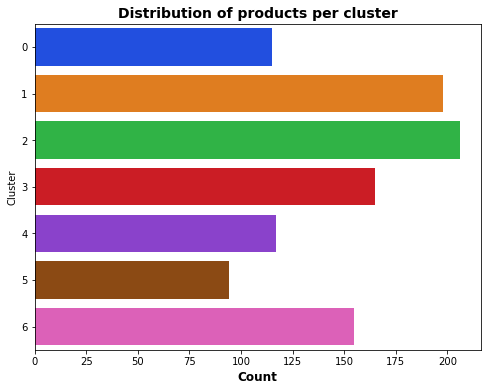

In [288]:
cluster_distribution(use_tsne_desc)

#### Clusters metrics

In [289]:
# tSNE + U.S.E on "description" 
results_use_desc = metrics_clusters(use_tsne_desc, data_type)
results4_1 = results3_6.append(results_use_desc, ignore_index=True)
results4_1

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 8.1.2 "product specifications" section

In [290]:
# Model loading
data_use_prod_spec = data_cleaned['product_specifications_clean']
data_use_prod_spec_model = hub.load(module_url)

In [291]:
data_use_prod_spec_vect = data_use_prod_spec_model(data_use_prod_spec)

In [292]:
use_tsne_results = tsne.fit_transform(data_use_prod_spec_vect)
    
use_tsne_prod_spec = pd.concat([pd.DataFrame(use_tsne_results), data_cleaned['prod_category1']], axis=1)
use_tsne_prod_spec = use_tsne_prod_spec.rename(columns={'prod_category1':'Category'})

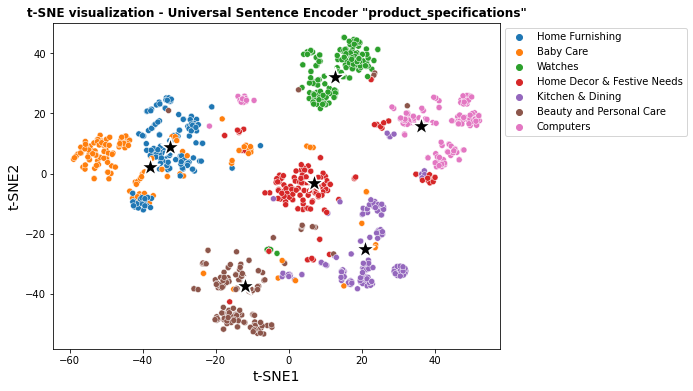

In [293]:
title = 't-SNE visualization - Universal Sentence Encoder "product_specifications"'
tsne_visualisation(use_tsne_prod_spec, title)

#### KMeans clustering after t-SNE

In [294]:
data_type = 'use_tsne_prod_spec'

In [295]:
# Kmeans
tsne_use_prod_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(use_tsne_prod_spec.iloc[:, :2])
 
use_tsne_prod_spec['cluster'] = tsne_use_prod_spec.labels_
cluster_labels = tsne_use_prod_spec.labels_
centres_reduced = tsne_use_prod_spec.cluster_centers_

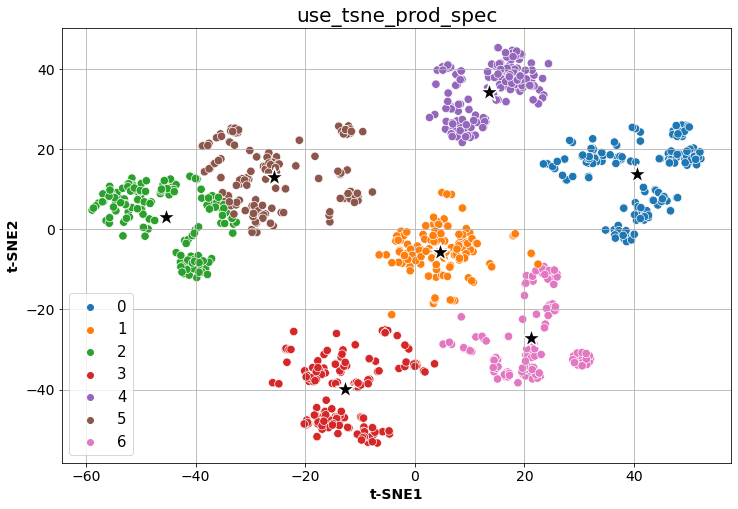

In [296]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
0    165
3    161
2    157
5    151
4    149
6    137
1    130
Name: cluster, dtype: int64


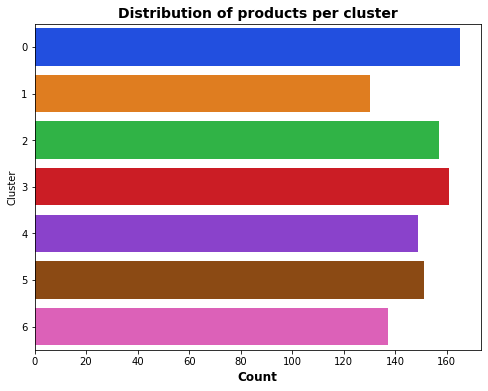

In [297]:
cluster_distribution(use_tsne_prod_spec)

#### Clusters metrics

In [298]:
# tSNE + U.S.E on "product specifications" 
results_use_spec = metrics_clusters(use_tsne_prod_spec, data_type)
results4_2 = results4_1.append(results_use_spec, ignore_index=True)
results4_2

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 8.1.3 "description + product specifications" section

In [299]:
# Model loading
data_use_desc_spec = data_cleaned['desc_spec_clean']
data_use_desc_spec_model = hub.load(module_url)

In [300]:
data_use_desc_spec_vect = data_use_desc_spec_model(data_use_desc_spec)

In [301]:
use_tsne_results = tsne.fit_transform(data_use_desc_spec_vect)
    
use_tsne_desc_spec = pd.concat([pd.DataFrame(use_tsne_results), data_cleaned['prod_category1']], axis=1)
use_tsne_desc_spec = use_tsne_desc_spec.rename(columns={'prod_category1':'Category'})

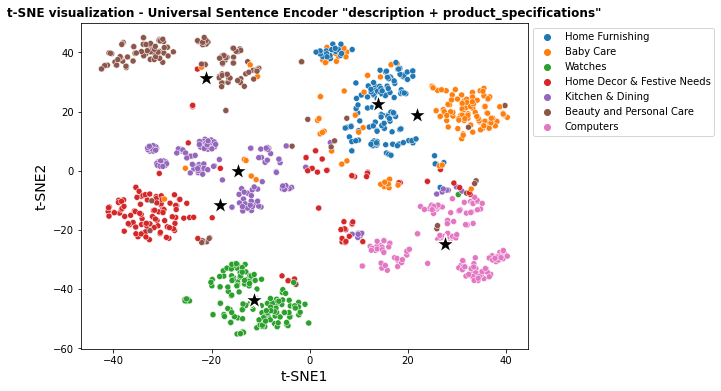

In [302]:
title = 't-SNE visualization - Universal Sentence Encoder "description + product_specifications"'
tsne_visualisation(use_tsne_desc_spec, title)

#### KMeans clustering after t-SNE

In [303]:
data_type = 'use_tsne_desc_spec'

In [304]:
# Kmeans
tsne_use_desc_spec = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(use_tsne_desc_spec.iloc[:, :2])
 
use_tsne_desc_spec['cluster'] = tsne_use_desc_spec.labels_
cluster_labels = tsne_use_desc_spec.labels_
centres_reduced = tsne_use_desc_spec.cluster_centers_

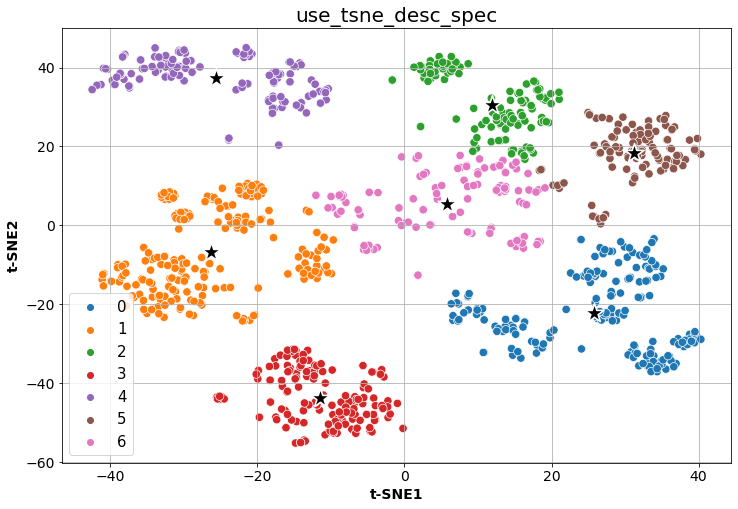

In [305]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
1    216
0    193
3    154
4    133
6    124
2    121
5    109
Name: cluster, dtype: int64


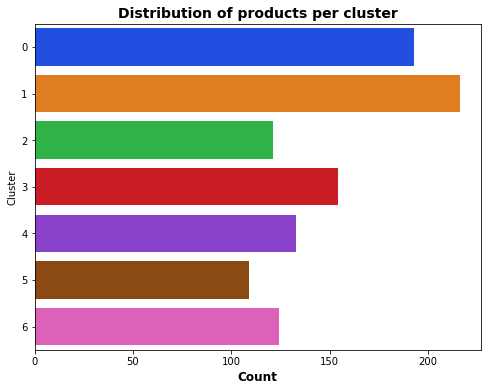

In [306]:
cluster_distribution(use_tsne_desc_spec)

#### Clusters metrics

In [307]:
# tSNE + U.S.E on "description + product specifications" 
results_use_desc_spec = metrics_clusters(use_tsne_desc_spec, data_type)
results4_3 = results4_2.append(results_use_desc_spec, ignore_index=True)
results4_3

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


#### 8.1.4 "description" section - Raw data

There is no preprocess requirement for the current USE model. Let's have a look at how it performs with raw data

In [308]:
# Model loading - Data no preprocessed
data_use_desc_raw = data_cleaned['description']
data_use_desc_raw_model = hub.load(module_url)

In [309]:
data_use_desc_raw_vect = data_use_desc_raw_model(data_use_desc_raw)

In [310]:
use_tsne_results = tsne.fit_transform(data_use_desc_raw_vect)
    
use_tsne_desc_raw = pd.concat([pd.DataFrame(use_tsne_results), data_cleaned['prod_category1']], axis=1)
use_tsne_desc_raw = use_tsne_desc_raw.rename(columns={'prod_category1':'Category'})

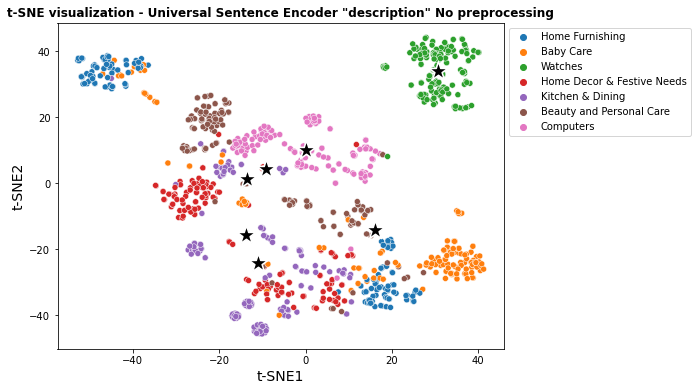

In [311]:
title = 't-SNE visualization - Universal Sentence Encoder "description" No preprocessing'
tsne_visualisation(use_tsne_desc_raw, title)

#### KMeans clustering after t-SNE

In [312]:
data_type = 'use_tsne_desc_raw'

In [313]:
# Kmeans
tsne_use_desc_raw = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(use_tsne_desc_raw.iloc[:, :2])
 
use_tsne_desc_raw['cluster'] = tsne_use_desc_raw.labels_
cluster_labels = tsne_use_desc_raw.labels_
centres_reduced = tsne_use_desc_raw.cluster_centers_

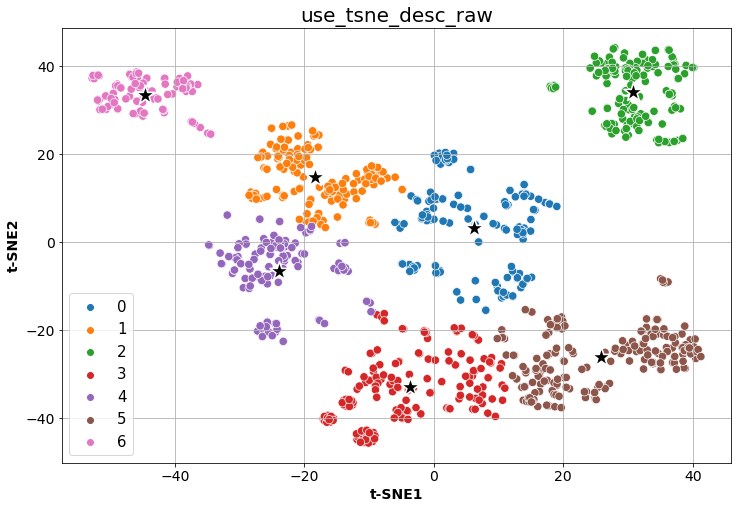

In [314]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
5    195
3    176
0    156
1    155
2    149
4    124
6     95
Name: cluster, dtype: int64


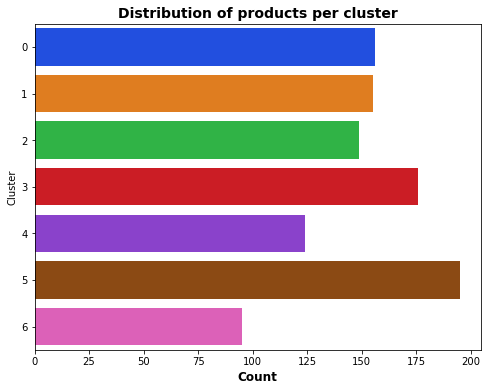

In [315]:
cluster_distribution(use_tsne_desc_raw)

#### Clusters metrics

In [316]:
# tSNE + U.S.E on "description" no preprocessed
results_use_desc_raw = metrics_clusters(use_tsne_desc_raw, data_type)
results4_4 = results4_3.append(results_use_desc_raw, ignore_index=True)
results4_4

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,cv_pca_desc,0.041124,0.158510,0.330658,0.214293,0.203763,0.321146
1,cv_pca_prod_spec,0.106508,0.304036,0.524535,0.384946,0.377519,0.362289
2,cv_pca_desc_spec,0.055817,0.199927,0.399967,0.266595,0.257100,0.334653
3,hashvect_pca_desc,0.007844,0.076872,0.395124,0.128705,0.114142,0.358306
4,hashvect_pca_spec,0.182032,0.383375,0.548196,0.451205,0.445164,0.385708
5,hashvect_pca_desc_spec,0.127645,0.308782,0.658383,0.420398,0.412924,0.405333
6,tfidf_pca_desc,0.190894,0.451914,0.600400,0.515681,0.510664,0.390236
7,tfidf_pca_prod_spec,0.303335,0.534879,0.635423,0.580832,0.576713,0.451896
8,tfidf_pca_desc_spec,0.425482,0.616156,0.691789,0.651786,0.648458,0.536182
9,cv_tsne_desc,0.402529,0.519033,0.537083,0.527904,0.523583,0.494167


Looking at the ARI score, we can already see that it performs better on raw data than on preprocessed data on the "description" section.

#### 8.1.5 "product specifications" section no preprocessed

In [ ]:
# Model loading
data_use_prod_spec_raw = data_cleaned['product_specifications']
data_use_prod_spec_raw_model = hub.load(module_url)

In [ ]:
data_use_prod_spec_raw_vect = data_use_prod_spec_raw_model(data_use_prod_spec_raw)

In [ ]:
use_tsne_results = tsne.fit_transform(data_use_prod_spec_raw_vect)
use_tsne_prod_spec_raw = pd.concat([pd.DataFrame(use_tsne_results),
                                    data_cleaned['prod_category1']], axis=1)
use_tsne_prod_spec_raw = use_tsne_prod_spec_raw.\
                         rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - Universal Sentence Encoder "product_specifications" no preprocessed'
tsne_visualisation(use_tsne_prod_spec_raw, title)

#### KMeans clustering after t-SNE 

In [ ]:
data_type = 'use_tsne_prod_spec_raw'

In [ ]:
# Kmeans
tsne_use_prod_spec_raw = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(use_tsne_prod_spec_raw.iloc[:, :2])
 
use_tsne_prod_spec_raw['cluster'] = tsne_use_prod_spec_raw.labels_
cluster_labels = tsne_use_prod_spec_raw.labels_
centres_reduced = tsne_use_prod_spec_raw.cluster_centers_

In [ ]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
cluster_distribution(use_tsne_prod_spec_raw)

#### Clusters metrics

In [ ]:
# tSNE + USE on "product specifications" no preprocessed
results_use_prod_spec_raw = metrics_clusters(use_tsne_prod_spec_raw, data_type)
results4_5 = results4_4.append(results_use_prod_spec_raw, ignore_index=True)
results4_5

#### 8.1.6 "description + product specifications" section no preprocessed

In [ ]:
# Model loading
data_use_desc_spec_raw = data_cleaned['desc_spec']
data_use_desc_spec_raw_model = hub.load(module_url)

In [ ]:
data_use_desc_spec_raw_vect = data_use_desc_spec_raw_model(data_use_desc_spec_raw)

In [ ]:
use_tsne_results = tsne.fit_transform(data_use_desc_spec_raw_vect)
    
use_tsne_desc_spec_raw = pd.concat([pd.DataFrame(use_tsne_results), data_cleaned['prod_category1']], axis=1)
use_tsne_desc_spec_raw = use_tsne_desc_spec_raw.rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - USE "description + product_specifications" no preprocessed'
tsne_visualisation(use_tsne_desc_spec_raw, title)

#### KMeans clustering after t-SNE

In [ ]:
data_type = 'use_tsne_desc_spec_raw'

In [ ]:
# Kmeans
tsne_use_desc_spec_raw = KMeans(n_clusters=7,
                                init='k-means++',
                                random_state=42).\
                                fit(use_tsne_desc_spec_raw.iloc[:, :2])

use_tsne_desc_spec_raw['cluster'] = tsne_use_desc_spec_raw.labels_
cluster_labels = tsne_use_desc_spec_raw.labels_
centres_reduced = tsne_use_desc_spec_raw.cluster_centers_

In [ ]:
display_clusters_tsne(use_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
use_tsne_desc_spec_raw

In [ ]:
cluster_distribution(use_tsne_desc_spec_raw)

#### Clusters metrics

In [ ]:
# tSNE + USE on "product specifications" no preprocessed
results_use_desc_spec_raw = metrics_clusters(use_tsne_desc_spec_raw,
                                             data_type)
results4_6 = results4_5.append(results_use_desc_spec_raw,
                               ignore_index=True)
results4_6

This Universal Sentence Encoder is pretty efficient on raw data. Apart from the "product specifications" section, it outperforms the ARI score obtained on preprocessed data.

## 9. Bidirectional Encoder Representations from Transformers (BERT)

BERT, which stands for Bidirectional Encoder Representations from Transformers is a language representation model. Unlike recent language representation models, BERT is designed to pre-train deep bidirectional representations from unlabeled text by jointly conditioning on both left and right context in all layers. As a result, the pre-trained BERT model can be fine-tuned with just one additional output layer to create state-of-the-art models for a wide range of tasks, such as question answering and language inference, without substantial task-specific architecture modifications.

The standard BERT model is now deprecated as it produces sentence embeddings of low quality. For this project, we picked up 2 recent sentence transformers to check how efficient they are on raw (non-preprocessed) compared to U.S.E.:

* __paraphrase-multilingual__ (MiniLM-L12-v2 model): It maps sentences & paragraphs to a 384 dimensional dense vector space and can be used for tasks like clustering or semantic search. It is a BERT architecture, but it uses the XLM-Roberta tokenizer.

* __MPNet__: Introduced in Nov 2020, it is a novel pre-training method that inherits the advantages of BERT and XLNet and avoids their limitations. MPNet leverages the dependency among predicted tokens through permuted language modeling (vs. MLM in BERT), and takes auxiliary position information as input to make the model see a full sentence and thus reducing the position discrepancy (vs. PLM in XLNet).<br>
https://hal.archives-ouvertes.fr/hal-02913045v2/file/mpNet_hal.pdf<br>
https://huggingface.co/sentence-transformers

#### 9.1 MiniLM on "description" section

In [ ]:
# Model initialisation
data_bert_desc_raw = data_cleaned['description']
bert_desc_raw = SentenceTransformer('all-MiniLM-L12-v2')
# Encoding
bert_desc_raw_vect = \
    bert_desc_raw.encode(data_bert_desc_raw, show_progress_bar=False)

In [ ]:
bert_tsne_results = tsne.fit_transform(bert_desc_raw_vect)
bert_tsne_desc_raw = pd.concat([pd.DataFrame(bert_tsne_results),
                                data_cleaned['prod_category1']], axis=1)
bert_tsne_desc_raw = bert_tsne_desc_raw.\
                     rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - MiniLM "description" no preprocessed'
tsne_visualisation(bert_tsne_desc_raw, title)

#### KMeans clustering after t-SNE

In [ ]:
data_type = 'minilm_tsne_desc_raw'

In [ ]:
# Kmeans
tsne_bert_desc_raw = KMeans(n_clusters=7,
                            init='k-means++',
                            random_state=42).\
                            fit(bert_tsne_desc_raw.iloc[:, :2])

bert_tsne_desc_raw['cluster'] = tsne_bert_desc_raw.labels_
cluster_labels = tsne_bert_desc_raw.labels_
centres_reduced = tsne_bert_desc_raw.cluster_centers_

In [ ]:
display_clusters_tsne(bert_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
cluster_distribution(bert_tsne_desc_raw)

#### Clusters metrics

In [ ]:
# tSNE + MiniLM on "description" no preprocessed
results_bert_desc_raw = metrics_clusters(bert_tsne_desc_raw, data_type)
results5_1 = results4_6.append(results_bert_desc_raw, ignore_index=True)
results5_1

#### 9.2 MiniLM on "product specifications" section

In [ ]:
# Model initialisation
data_bert_spec_raw = data_cleaned['product_specifications']
bert_spec_raw = SentenceTransformer('all-MiniLM-L12-v2')
# Encoding
bert_spec_raw_vect = \
    bert_spec_raw.encode(data_bert_spec_raw, show_progress_bar=False)

In [ ]:
bert_tsne_results = tsne.fit_transform(bert_spec_raw_vect)
bert_tsne_spec_raw = pd.concat([pd.DataFrame(bert_tsne_results),
                                data_cleaned['prod_category1']], axis=1)
bert_tsne_spec_raw = bert_tsne_spec_raw.\
                     rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - MiniLM "product specifications" no preprocessed'
tsne_visualisation(bert_tsne_spec_raw, title)

#### KMeans clustering after t-SNE

In [ ]:
data_type = 'minilm_tsne_spec_raw'

In [ ]:
# Kmeans
tsne_bert_spec_raw = KMeans(n_clusters=7,
                            init='k-means++',
                            random_state=42).\
                            fit(bert_tsne_spec_raw.iloc[:, :2])

bert_tsne_spec_raw['cluster'] = tsne_bert_spec_raw.labels_
cluster_labels = tsne_bert_spec_raw.labels_
centres_reduced = tsne_bert_spec_raw.cluster_centers_

In [ ]:
display_clusters_tsne(bert_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
cluster_distribution(bert_tsne_spec_raw)

#### Clusters metrics

In [ ]:
# tSNE + MiniLM on "product specifications" no preprocessed
results_bert_spec_raw = metrics_clusters(bert_tsne_spec_raw, data_type)
results5_2 = results5_1.append(results_bert_spec_raw, ignore_index=True)
results5_2

#### 9.3 MiniLM on "description + product specifications" section

In [ ]:
# Model initialisation
data_bert_desc_spec_raw = data_cleaned['desc_spec']
bert_desc_spec_raw = SentenceTransformer('all-MiniLM-L12-v2')
# Encoding
bert_desc_spec_raw_vect = \
    bert_desc_spec_raw.encode(data_bert_desc_spec_raw, show_progress_bar=False)

In [ ]:
bert_tsne_results = tsne.fit_transform(bert_desc_spec_raw_vect)
bert_tsne_desc_spec_raw = pd.concat([pd.DataFrame(bert_tsne_results),
                                     data_cleaned['prod_category1']], axis=1)
bert_tsne_desc_spec_raw = bert_tsne_desc_spec_raw.\
                          rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - MiniLM "description + \
product specifications" no preprocessed'
tsne_visualisation(bert_tsne_desc_spec_raw, title)

#### KMeans clustering after t-SNE

In [ ]:
data_type = 'minilm_tsne_desc_spec_raw'

In [ ]:
# Kmeans
tsne_bert_desc_spec_raw = KMeans(n_clusters=7,
                                 init='k-means++',
                                 random_state=42).\
                                 fit(bert_tsne_desc_spec_raw.iloc[:, :2])

bert_tsne_desc_spec_raw['cluster'] = tsne_bert_desc_spec_raw.labels_
cluster_labels = tsne_bert_desc_spec_raw.labels_
centres_reduced = tsne_bert_desc_spec_raw.cluster_centers_

In [ ]:
display_clusters_tsne(bert_tsne_results, cluster_labels, centres_reduced, data_type)

#### 3D Visualization

In [ ]:
tsne_3d = TSNE(n_components=3, perplexity=30, n_iter=1500, random_state=42)
bert_tsne_desc_spec_raw_3d = pd.DataFrame(tsne_3d.fit_transform(bert_desc_spec_raw_vect))

# # Kmeans
tsne_bert_tsne_desc_spec_raw_3d = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(bert_tsne_desc_spec_raw_3d.iloc[:, :3])
bert_tsne_desc_spec_raw_3d['cluster'] = tsne_bert_tsne_desc_spec_raw_3d.labels_
cluster_labels_3d = tsne_bert_tsne_desc_spec_raw_3d.labels_
centres_reduced_3d = tsne_bert_tsne_desc_spec_raw_3d.cluster_centers_

In [ ]:
threed_clustering(bert_tsne_desc_spec_raw_3d)

In [ ]:
cluster_distribution(bert_tsne_desc_spec_raw)

In [ ]:
# Categories into clusters
bert_tsne_desc_spec_raw.groupby('cluster')['Category'].value_counts().to_frame()

#### Clusters metrics

In [ ]:
# tSNE + MiniLM on "description + product specifications" no preprocessed
results_bert_desc_spec_raw = metrics_clusters(bert_tsne_desc_spec_raw,
                                              data_type)
results5_3 = results5_2.append(results_bert_desc_spec_raw,
                               ignore_index=True)
results5_3

#### Summary for MiniLM + t-SNE on "description + product specifications"

* 7 topics are found and the distribution in clusters is quite homogeneous. Topic 6 representing Baby Care contains less than 100 products but other clusters remain in an acceptable range considering all the methods tested previously. Results are the following:


    - Cluster 0 : Computers (137/159)
    - Cluster 1 : Home Furnishing (152/177)
    - Cluster 2 : Watches (150/155)
    - Cluster 3 : Home decor & Festive Needs (124/176)
    - Cluster 4 : Beauty and Personal Care (129/148)
    - Cluster 5 : Kitchen & Dining (127/136)
    - Cluster 6 : Baby Care (96/99)
        
    
- High ARI score of 0.71 on raw data

#### 9.4 MPNET on "description" section

In [ ]:
# Model initialisation
data_mpnet_desc_raw = data_cleaned['description']
mpnet_desc_raw = SentenceTransformer('all-mpnet-base-v2')
# Encoding
mpnet_desc_raw_vect = \
    mpnet_desc_raw.encode(data_mpnet_desc_raw, show_progress_bar=False)

In [ ]:
mpnet_tsne_results = tsne.fit_transform(mpnet_desc_raw_vect)
mpnet_tsne_desc_raw = pd.concat([pd.DataFrame(mpnet_tsne_results),
                                 data_cleaned['prod_category1']], axis=1)
mpnet_tsne_desc_raw = mpnet_tsne_desc_raw.\
                      rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - MPNET "description" no preprocessed'
tsne_visualisation(mpnet_tsne_desc_raw, title)

#### KMeans clustering after t-SNE

In [ ]:
data_type = 'mpnet_tsne_desc_raw'

In [ ]:
# Kmeans
tsne_mpnet_desc_raw = KMeans(n_clusters=7,
                             init='k-means++',
                             random_state=42).\
                             fit(mpnet_tsne_desc_raw.iloc[:, :2])

mpnet_tsne_desc_raw['cluster'] = tsne_mpnet_desc_raw.labels_
cluster_labels = tsne_mpnet_desc_raw.labels_
centres_reduced = tsne_mpnet_desc_raw.cluster_centers_

In [ ]:
display_clusters_tsne(mpnet_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
cluster_distribution(mpnet_tsne_desc_raw)

#### Clusters metrics

In [ ]:
# tSNE + MPNET on "description" no preprocessed
results_mpnet_desc_raw = metrics_clusters(mpnet_tsne_desc_raw, data_type)
results5_4 = results5_3.append(results_mpnet_desc_raw, ignore_index=True)
results5_4

#### 9.5 MPNET on "product specifications" section

In [ ]:
# Model initialisation
data_mpnet_spec_raw = data_cleaned['product_specifications']
mpnet_spec_raw = SentenceTransformer('all-mpnet-base-v2')
# Encoding
mpnet_spec_raw_vect = mpnet_spec_raw.\
                      encode(data_mpnet_spec_raw, show_progress_bar=False)

In [ ]:
mpnet_tsne_results = tsne.fit_transform(mpnet_spec_raw_vect)
mpnet_tsne_spec_raw = pd.concat([pd.DataFrame(mpnet_tsne_results),
                                 data_cleaned['prod_category1']], axis=1)
mpnet_tsne_spec_raw = mpnet_tsne_spec_raw.\
                      rename(columns={'prod_category1':'Category'})

In [ ]:
title = 't-SNE visualization - MPNET "product specifications" no preprocessed'
tsne_visualisation(mpnet_tsne_spec_raw, title)

#### t-SNE dimension reduction

In [ ]:
data_type = 'mpnet_tsne_spec_raw'

In [ ]:
# Kmeans
tsne_mpnet_spec_raw = KMeans(n_clusters=7,
                             init='k-means++',
                             random_state=42).\
                             fit(mpnet_tsne_spec_raw.iloc[:, :2])

mpnet_tsne_spec_raw['cluster'] = tsne_mpnet_spec_raw.labels_
cluster_labels = tsne_mpnet_spec_raw.labels_
centres_reduced = tsne_mpnet_spec_raw.cluster_centers_

In [ ]:
display_clusters_tsne(mpnet_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
cluster_distribution(mpnet_tsne_spec_raw)

#### Clusters metrics

In [ ]:
# tSNE + MPNET on "product specifications" no preprocessed
results_mpnet_spec_raw = metrics_clusters(mpnet_tsne_spec_raw,
                                          data_type)
results5_5 = results5_4.append(results_mpnet_spec_raw,
                               ignore_index=True)
results5_5

#### 9.6 MPNET on "description + product specifications" section

## --- CUDA out of memory ---

__To run on another laptop with more memory or on Colab__

In [ ]:
# # Model initialisation
# data_mpnet_desc_spec_raw = data_cleaned['desc_spec']
# mpnet_desc_spec_raw = SentenceTransformer('all-mpnet-base-v2')
# # Encoding
# mpnet_desc_spec_raw_vect = mpnet_desc_spec_raw.\
#                            encode(data_mpnet_desc_spec_raw,
#                                   show_progress_bar=False)

In [ ]:
# mpnet_tsne_results = tsne.fit_transform(mpnet_desc_spec_raw_vect)
# mpnet_tsne_desc_spec_raw = pd.concat([pd.DataFrame(mpnet_tsne_results),
#                                      data_cleaned['prod_category1']], axis=1)
# mpnet_tsne_desc_spec_raw = mpnet_tsne_desc_spec_raw.\
#                            rename(columns={'prod_category1':'Category'})

In [ ]:
# title = 't-SNE visualization - MPNET "description + \n
#          product specifications" no preprocessed'
# tsne_visualisation(mpnet_tsne_desc_spec_raw, title)

#### KMeans clustering after t-SNE dimension reduction

In [ ]:
# data_type = 'mpnet_tsne_desc_spec_raw'

In [ ]:
# # Kmeans
# tsne_mpnet_desc_spec_raw = KMeans(n_clusters=7,
#                                   init='k-means++',
#                                   random_state=42).\
#                            fit(mpnet_tsne_desc_spec_raw.iloc[:, :2])

# mpnet_tsne_desc_spec_raw['cluster'] = tsne_mpnet_desc_spec_raw.labels_
# cluster_labels = tsne_mpnet_desc_spec_raw.labels_
# centres_reduced = tsne_mpnet_desc_spec_raw.cluster_centers_

In [ ]:
# display_clusters_tsne(mpnet_tsne_results, cluster_labels, centres_reduced, data_type)

In [ ]:
# cluster_distribution(mpnet_tsne_desc_spec_raw)

#### Clusters metrics

In [ ]:
# # tSNE + MPNET on "description + product specifications" no preprocessed
# results_mpnet_desc_spec_raw = metrics_clusters(mpnet_tsne_desc_spec_raw,
#                                                data_type)
# results5_6 = results5_5.append(results_mpnet_desc_spec_raw,
#                                ignore_index=True)
# results5_6

In [ ]:
# Algorithms comparison 
final_results = results5_5.sort_values(by='ARI', ascending=False)
scores_final = pd.melt(final_results, id_vars=['Methods'],
                                 value_name='score',
                                 value_vars=['ARI', 'Homogeneity',
                                             'Completness', 'V-Measure',
                                            'AMI', 'Fowlkes-Mallows'])
# Visualisation
plt.figure(figsize=(15, 25))
sns.barplot(y=scores_final['Methods'],
            x=scores_final['score'],
            hue=scores_final['variable'],
            palette='tab10')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Score', weight='bold', size=18)
plt.ylabel('Methods', weight='bold', size=18)
plt.title('Clusters score benchmark', fontsize=25)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.show()

In [ ]:
tm = time.time() - start_time
print('Total running time (sec):', tm)

### 10. Errors distribution

Which category is the most difficult to classify?

In [ ]:
# Dict creation to compare cluster number with categories
dict = {'Computers':'0',
        'Home Furnishing':'1',
        'Watches':'2',
        'Home Decor & Festive Needs':'3',
        'Beauty and Personal Care':'4',
        'Kitchen & Dining':'5',
        'Baby Care':'6'}

In [ ]:
bert_tsne_desc_spec_raw['Category1'] = bert_tsne_desc_spec_raw['Category'].map(dict)
bert_tsne_desc_spec_raw['Category1'] = pd.to_numeric(bert_tsne_desc_spec_raw['Category1'])

In [ ]:
mask = bert_tsne_desc_spec_raw['Category1'] == \
    bert_tsne_desc_spec_raw['cluster']
errors = bert_tsne_desc_spec_raw[~mask]
print(f'Count of errors: {errors.shape[0]}')

In [ ]:
# Errors distribution across the categories
plt.figure(figsize=(8, 8))
sns.countplot(y='Category', data=errors,
              order=errors['Category'].value_counts().index,
              palette=['#FF00CC', '#ED0A3F', '#9C2542', '#9C51B6', '#0048BA', '#FF7A00'])
plt.title('Errors distribution', weight='bold', fontsize=16)
plt.xlabel('Count of errors', weight='bold', fontsize=14)
plt.ylabel('Categories', weight='bold', fontsize=14)
plt.yticks(fontsize=14, rotation=45)
plt.show()